# Import and preparation

In [1]:
import os

In [2]:
import pandas as pd

In [3]:
import matplotlib.pyplot as plt

In [4]:
import seaborn as sns

In [5]:
import scipy.stats as stat

In [6]:
current_directory = os.getcwd()
print(current_directory)


/home/borela/fontes/ind-ir/code


In [7]:
from util import util_evaluation

OpenAI tiktoken module is not available for Python < 3.8,Linux ARM64 and AARCH64. Falling back to GPT2TokenizerFast.


In [8]:
import numpy as np

In [9]:
import importlib


In [10]:
from pandas.api.types import CategoricalDtype


In [11]:
import gc

In [12]:
def config_display():
  """
  Esta função configura as opções de display do Pandas.
  """

  # Configurando formato saída Pandas
  # define o número máximo de colunas que serão exibidas
  pd.options.display.max_columns = None

  # define a largura máxima de uma linha
  pd.options.display.width = 1000

  # define o número máximo de linhas que serão exibidas
  pd.options.display.max_rows = 500

  # define o número máximo de caracteres por coluna
  pd.options.display.max_colwidth = 50

  # se deve exibir o número de linhas e colunas de um DataFrame.
  pd.options.display.show_dimensions = True

  # número de dígitos após a vírgula decimal a serem exibidos para floats.
  pd.options.display.precision = 2

In [13]:
config_display()

In [14]:
DATASET_NAME = 'juris_tcu'

In [15]:
importlib.reload(util_evaluation)

<module 'util.util_evaluation' from '/home/borela/fontes/ind-ir/code/util/util_evaluation.py'>

# CODE RELATED TO FINAL REPORT

In [16]:
df_result = util_evaluation.return_experiment(DATASET_NAME)

In [17]:
len(df_result['RANKER'].unique()), len(df_result['RETRIEVER'].unique()), len(df_result['TIME'].unique())

(5, 3, 1027)

In [18]:
df_result.shape

(1027, 24)

In [19]:
df_result.columns

Index(['TIME', 'COLUMN_NAME', 'RETRIEVER', 'COUNT_QUERY_RUN', 'TOPK_RETRIEVER', 'TOPK_RANKER', 'COUNT_QUERY_WITHOUT_RESULT', 'COUNT_QUERY_NOT_FOUND', 'RANK1', 'NDCG@5', 'NDCG@10', 'NDCG@15', 'NDCG@20', 'PRECISION@50', 'PRECISION@100', 'RECALL@50', 'RECALL@100', 'TIME_SPENT', 'RETRIEVER_MODEL_NAME', 'RANKER', 'EXPQ_CNT', 'EXPD_VAL', 'EXPD_TYPE', 'EXPQ_TYPE'], dtype='object')

In [20]:
list_metric = ['NDCG@10', 'PRECISION@50', 'RECALL@100']
list_category = [ 'EXPQ_CNT', 'EXPQ_TYPE', 'EXPD_TYPE', 'EXPD_VAL',   'RANKER', 'RETRIEVER'] 
list_columns_filter = list_category + list_metric

In [21]:
df_result = df_result[list_columns_filter]

In [22]:
df_result.shape

(1027, 9)

In [23]:
# list_RANKER = ['none', 'PTT5_BASE', 'PTT5_INDIR_106']
# df_result = df_result[df_result['RANKER'].isin(list_RANKER)]

In [24]:
columns_with_nan = df_result.columns[df_result.isna().any()].tolist()
assert [] == columns_with_nan, f"Review treatment of columns_with_nan. Expected no one, but found {columns_with_nan}"

In [25]:
for column_name in df_result.columns:
    if '@' not in column_name:
        print(f"Unique values for column {column_name}: {df_result[column_name].unique()}")

Unique values for column EXPQ_CNT: ['1', '10', '2', '3', '4', ..., '6', '7', '8', '9', '----']
Length: 11
Categories (11, object): ['----' < '1' < '2' < '3' ... '7' < '8' < '9' < '10']
Unique values for column EXPQ_TYPE: ['indir', '----', 'indir_extra']
Categories (4, object): ['----' < 'base' < 'indir' < 'indir_extra']
Unique values for column EXPD_TYPE: ['----', 'indir-1', 'indir-3', 'indir-5', 'user']
Categories (5, object): ['----' < 'user' < 'indir-1' < 'indir-3' < 'indir-5']
Unique values for column EXPD_VAL: ['----', '+rel', '+syn', '+syn+rel', 'term']
Categories (5, object): ['----' < 'term' < '+syn' < '+rel' < '+syn+rel']
Unique values for column RANKER: ['----', 'indir', 'base', 'indiri', 'basei']
Categories (5, object): ['----' < 'indir' < 'indiri' < 'base' < 'basei']
Unique values for column RETRIEVER: ['bm25', 'join', 'sts']
Categories (3, object): ['bm25' < 'sts' < 'join']


In [26]:
df_result.columns

Index(['EXPQ_CNT', 'EXPQ_TYPE', 'EXPD_TYPE', 'EXPD_VAL', 'RANKER', 'RETRIEVER', 'NDCG@10', 'PRECISION@50', 'RECALL@100'], dtype='object')

In [27]:
list_category

['EXPQ_CNT', 'EXPQ_TYPE', 'EXPD_TYPE', 'EXPD_VAL', 'RANKER', 'RETRIEVER']

In [28]:
df_result = df_result.sort_values(by=list_category)

In [29]:
df_result.shape

(1027, 9)

In [30]:
df_result.head()

,EXPQ_CNT,EXPQ_TYPE,EXPD_TYPE,EXPD_VAL,RANKER,RETRIEVER,NDCG@10,PRECISION@50,RECALL@100
10,----,----,----,----,----,bm25,54.99,12.92,82.94
682,----,----,----,----,----,sts,18.47,5.97,46.37
21,----,----,----,----,----,join,21.48,6.72,51.82
384,----,----,----,----,indir,bm25,64.09,15.16,90.74
684,----,----,----,----,indir,sts,56.67,10.71,65.71


In [31]:
list(df_result.columns)[:4]

['EXPQ_CNT', 'EXPQ_TYPE', 'EXPD_TYPE', 'EXPD_VAL']

In [32]:
list_category[:4]

['EXPQ_CNT', 'EXPQ_TYPE', 'EXPD_TYPE', 'EXPD_VAL']

In [33]:
list_category[4:]

['RANKER', 'RETRIEVER']

In [34]:
gc.collect()

124

In [35]:
raise Exception('Stop hera, from run all')

Exception: Stop hera, from run all

# Analize

In [317]:
table_union_superior_value_sparse= {}

In [318]:
table_union_superior_top_values = {}
num_top_value = 40

In [319]:
table_union_superior = {}

In [320]:
dict_base_value = {}

## Analize ndcg@10

### Define base value

In [321]:
metric_base = 'NDCG@10'

In [322]:
base_value = df_result.loc[(df_result['RANKER'] == '----') & (df_result['EXPQ_CNT'] == '----') & (df_result['EXPD_TYPE'] == '----') & (df_result['RETRIEVER'] == 'bm25'), metric_base].iloc[0]




In [323]:
dict_base_value[metric_base] = base_value

In [324]:
base_value

54.992

### View superior values in sparse search

In [325]:
df_superior_value_esparsa = df_result[(df_result[metric_base]>=base_value)&(df_result['RANKER']=='----')]

In [326]:
table_superior_value_esparsa = df_superior_value_esparsa[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [327]:
table_union_superior_value_sparse[metric_base] = table_superior_value_esparsa.copy()

In [328]:
table_superior_value_esparsa

NDCG@10
RETRIEVER                                       bm25
EXPQ_CNT EXPQ_TYPE EXPD_TYPE EXPD_VAL RANKER        
----     ----      ----      ----     ----     54.99
                   user      term     ----     55.72
                             +syn     ----     55.58

[3 rows x 1 columns]

### View superior values

In [329]:
df_superior_value = df_result[(df_result[metric_base]>=base_value)]
df_superior_value = df_superior_value.sort_values(by=metric_base, ascending=False)

In [330]:
df_superior_value.shape[0]

88

In [331]:
df_superior_value[list_category+[metric_base]].head(30)

,EXPQ_CNT,EXPQ_TYPE,EXPD_TYPE,EXPD_VAL,RANKER,RETRIEVER,NDCG@10
688,----,----,----,----,base,join,73.48
686,----,----,----,----,base,bm25,72.95
696,----,----,user,term,base,join,71.25
704,----,----,indir-5,term,base,bm25,70.82
706,----,----,indir-5,term,base,join,70.76
694,----,----,user,term,base,bm25,70.66
689,1,indir,----,----,base,join,67.40
687,1,indir,----,----,base,bm25,65.97
707,1,indir,indir-5,term,base,join,65.01
705,1,indir,indir-5,term,base,bm25,64.70


In [336]:
table_superior = df_superior_value[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [337]:
# Complementar os valores nulos em table_ndcg10_superior com os valores correspondentes em df_result
table_superior = table_superior.fillna(df_result.pivot_table(index=list_category[:5], columns=list_category[5:], values=metric_base, aggfunc='first'))

In [338]:
table_union_superior_top_values[metric_base] = df_superior_value.head(num_top_value)[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first').fillna(table_superior)

In [339]:
table_union_superior[metric_base] = table_superior.copy()

In [335]:
table_superior  = table_superior.fillna("----")

In [340]:
table_superior 

NDCG@10              
RETRIEVER                                       bm25    sts   join
EXPQ_CNT EXPQ_TYPE EXPD_TYPE EXPD_VAL RANKER                      
----     ----      ----      ----     ----     54.99  18.47  21.48
                                      indir    64.09  56.67  64.16
                                      base     72.95  61.12  73.48
                   user      term     ----     55.72  21.63  25.91
                                      indir    63.46  57.85  63.16
                                      base     70.66  63.54  71.25
                             +syn     ----     55.58  20.59  25.81
                                      indir    59.25    NaN  59.41
                             +rel     indir    57.65    NaN  57.96
                             +syn+rel indir    55.54    NaN  55.89
                   indir-1   term     indir    60.91    NaN  60.62
                             +syn     indir    56.52    NaN  56.10
                             +rel     indir    55.43    NaN  56.19
                   indir-3   term     indir    60.40    NaN  60.70
                             +rel     indir    54.64    NaN  55.53
                   indir-5   term     indir    60.26  55.11  60.50
                                      base     70.82  62.68  70.76
                             +rel     indir    55.41    NaN  56.12
1        indir     ----      ----     indir    58.65  52.60  59.04
                                      base     65.97  57.21  67.40
                   user      term     indir    58.23  53.38  58.19
                                      base     64.19  58.59  64.59
                   indir-1   term     indir    55.98    NaN  56.33
                   indir-3   term     indir    55.26    NaN  55.71
                   indir-5   term     indir    55.58  52.28  56.16
                                      base     64.70  58.28  65.01
2        indir     ----      ----     indir    56.36    NaN  56.83
                   user      term     indir    55.82    NaN  55.83
                   indir-1   term     indir    54.51    NaN  55.41
3        indir     ----      ----     indir    56.20    NaN  56.71
4        indir     ----      ----     indir    57.36    NaN  57.67
                   user      term     indir    55.11    NaN  55.40
5        indir     ----      ----     indir    57.47    NaN  57.07
                   user      term     indir    55.57    NaN  55.49
6        indir     ----      ----     indir    57.03    NaN  57.40
                   user      term     indir    55.14    NaN  55.69
7        indir     ----      ----     indir    56.17    NaN  56.83
8        indir     ----      ----     indir    56.27    NaN  56.51
                   user      term     indir    54.75    NaN  55.05
9        indir     ----      ----     indir    55.85    NaN  56.38
                   user      term     indir    55.20    NaN  55.44
10       indir     ----      ----     indir    55.87    NaN  56.33
                   user      term     indir    54.77    NaN  55.18

[43 rows x 3 columns]

### View all values

In [341]:
table_all = df_result[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [342]:
table_all = table_all.round(2)

In [343]:
table_all = table_all.fillna("----")

In [344]:
table_all

NDCG@10              
RETRIEVER                                         bm25    sts   join
EXPQ_CNT EXPQ_TYPE   EXPD_TYPE EXPD_VAL RANKER                      
----     ----        ----      ----     ----     54.99  18.47  21.48
                                        indir    64.09  56.67  64.16
                                        indiri   53.19   ----  54.86
                                        base     72.95  61.12  73.48
                                        basei     ----   ----  33.13
...                                                ...    ...    ...
10       indir_extra user      +syn     ----     25.42  18.02   9.05
                               +rel     ----     22.48  13.83  11.87
                               +syn+rel ----      20.7   13.5   9.84
                     indir-5   term     ----     26.84  17.42  10.64
                                        indir     ----   ----  44.80

[503 rows x 3 columns]

## Recall@100

### Define base value

In [345]:
metric_base = 'RECALL@100'

In [346]:
base_value = df_result.loc[(df_result['RANKER'] == '----') & (df_result['EXPQ_CNT'] == '----') & (df_result['EXPD_TYPE'] == '----') & (df_result['RETRIEVER'] == 'bm25'), metric_base].iloc[0]




In [347]:
base_value

82.94

In [348]:
dict_base_value[metric_base] = base_value

### View superior values in sparse search

In [349]:
df_superior_value_esparsa = df_result[(df_result[metric_base]>=base_value)&(df_result['RANKER']=='----')]

In [350]:
table_superior_value_esparsa = df_superior_value_esparsa[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [351]:
table_union_superior_value_sparse[metric_base] = table_superior_value_esparsa.copy()

In [352]:
table_superior_value_esparsa

RECALL@100
RETRIEVER                                          bm25
EXPQ_CNT EXPQ_TYPE EXPD_TYPE EXPD_VAL RANKER           
----     ----      ----      ----     ----        82.94
                   user      term     ----        85.74
                             +syn     ----        85.79
                   indir-1   term     ----        83.19
                   indir-3   term     ----        84.30
                   indir-5   term     ----        85.05
                             +syn     ----        83.29
1        indir     user      term     ----        86.85
                             +syn     ----        86.38
                   indir-1   term     ----        83.79
                   indir-3   term     ----        84.75
                   indir-5   term     ----        84.89
2        indir     user      term     ----        85.31
3        indir     user      term     ----        84.38
4        indir     user      term     ----        84.16
5        indir     user      term     ----        83.42
6        indir     user      term     ----        83.55
7        indir     user      term     ----        82.99
9        indir     user      term     ----        83.06
10       indir     user      term     ----        83.28

[20 rows x 1 columns]

### View superior values

In [353]:
df_superior_value = df_result[(df_result[metric_base]>=base_value)]
df_superior_value = df_superior_value.sort_values(by=metric_base, ascending=False)

In [354]:
df_superior_value.shape[0]

276

In [355]:
df_superior_value[list_category+[metric_base]].head(20)

,EXPQ_CNT,EXPQ_TYPE,EXPD_TYPE,EXPD_VAL,RANKER,RETRIEVER,RECALL@100
696,----,----,user,term,base,join,95.42
681,----,----,user,term,indir,join,94.74
697,1,indir,user,term,base,join,94.30
688,----,----,----,----,base,join,93.92
706,----,----,indir-5,term,base,join,93.68
395,----,----,----,----,indir,join,93.67
571,----,----,user,+syn,indir,join,93.12
637,----,----,indir-3,term,indir,join,93.08
694,----,----,user,term,base,bm25,93.00
671,1,indir,user,term,indir,join,92.74


In [356]:
table_superior = df_superior_value[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [357]:
# Complementar os valores nulos em table_ndcg10_superior com os valores correspondentes em df_result
table_superior = table_superior.fillna(df_result.pivot_table(index=list_category[:5], columns=list_category[5:], values=metric_base, aggfunc='first'))

In [358]:
table_union_superior_top_values[metric_base] = df_superior_value.head(num_top_value)[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first').fillna(table_superior)

In [359]:
table_union_superior[metric_base] = table_superior.copy()

In [360]:
table_superior  = table_superior.fillna("----")

In [361]:
table_superior 

RECALL@100       
RETRIEVER                                            bm25   join
EXPQ_CNT EXPQ_TYPE   EXPD_TYPE EXPD_VAL RANKER                  
----     ----        ----      ----     ----        82.94  51.82
                                        indir       90.74  93.67
                                        indiri      88.19  92.15
                                        base        91.08  93.92
                                        basei        ----  86.40
                     user      term     ----        85.74  61.56
                                        indir       92.19  94.74
                                        indiri      85.19  89.23
                                        base         93.0  95.42
                               +syn     ----        85.79  60.49
                                        indir       90.76  93.12
                               +rel     indir       89.91  90.45
                               +syn+rel indir       89.19  90.07
                     indir-1   term     ----        83.19  55.88
                                        indir       90.81  92.35
                               +syn     indir       87.96  89.87
                               +rel     indir       87.17  88.55
                     indir-3   term     ----         84.3  57.87
                                        indir       90.52  93.08
                               +syn     indir       86.66  89.59
                               +rel     indir       85.61  87.05
                     indir-5   term     ----        85.05  57.68
                                        indir       90.51  92.21
                                        indiri      84.73  89.20
                                        base        91.92  93.68
                               +syn     ----        83.29  56.89
                                        indir        87.8  89.36
                               +rel     indir       86.23  87.51
1        indir       ----      ----     indir       87.42  90.64
                                        indiri      87.12  90.81
                                        base        88.89  92.03
                                        basei        ----  85.51
                     user      term     ----        86.85  63.93
                                        indir       90.08  92.74
                                        indiri      86.36  90.23
                                        base        92.42  94.30
                               +syn     ----        86.38  61.65
                                        indir       87.74  90.42
                               +rel     indir       87.95  87.74
                               +syn+rel indir       85.37  86.63
                     indir-1   term     ----        83.79  59.39
                                        indir       87.81  90.28
                               +syn     indir       84.37  86.12
                               +rel     indir       82.58  84.47
                     indir-3   term     ----        84.75  61.46
                                        indir       88.22  89.74
                               +syn     indir       82.04  83.94
                               +rel     indir       82.79  83.72
                     indir-5   term     ----        84.89  62.38
                                        indir       88.07  89.98
                                        indiri      85.89  88.39
                                        base        91.29  92.21
                               +syn     indir       83.38  85.33
                               +rel     indir       83.23  85.15
         indir_extra ----      ----     indir        ----  85.47
                     user      term     indir        ----  84.07
                     indir-5   term     indir        ----  83.38
2        indir       ----      ----     indir       85.63  88.64
                                        indiri      85.85  89.68
                 

### View all values

In [362]:
table_all = df_result[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [363]:
table_all = table_all.round(2)

In [364]:
table_all = table_all.fillna("----")

In [365]:
table_all

RECALL@100              
RETRIEVER                                            bm25    sts   join
EXPQ_CNT EXPQ_TYPE   EXPD_TYPE EXPD_VAL RANKER                         
----     ----        ----      ----     ----        82.94  46.37  51.82
                                        indir       90.74  65.71  93.67
                                        indiri      88.19   ----  92.15
                                        base        91.08   65.7  93.92
                                        basei        ----   ----  86.40
...                                                   ...    ...    ...
10       indir_extra user      +syn     ----        64.64  45.46  31.09
                               +rel     ----        60.99  40.35  32.42
                               +syn+rel ----        60.25  41.33  31.67
                     indir-5   term     ----        66.12  44.63  33.94
                                        indir        ----   ----  79.57

[503 rows x 3 columns]

## Analize precision@50

### Define base value

In [366]:
metric_base = 'PRECISION@50'

In [367]:
base_value = df_result.loc[(df_result['RANKER'] == '----') & (df_result['EXPQ_CNT'] == '----') & (df_result['EXPD_TYPE'] == '----') & (df_result['RETRIEVER'] == 'bm25'), metric_base].iloc[0]




In [368]:
base_value

12.92

In [369]:
dict_base_value[metric_base] = base_value

### View superior values in sparse search

In [370]:
df_superior_value_esparsa = df_result[(df_result[metric_base]>=base_value)&(df_result['RANKER']=='----')]

In [371]:
table_superior_value_esparsa = df_superior_value_esparsa[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [372]:
table_union_superior_value_sparse[metric_base] = table_superior_value_esparsa.copy()

In [373]:
table_superior_value_esparsa

PRECISION@50
RETRIEVER                                            bm25
EXPQ_CNT EXPQ_TYPE EXPD_TYPE EXPD_VAL RANKER             
----     ----      ----      ----     ----          12.92
                   user      term     ----          13.53
                             +syn     ----          13.73
                   indir-1   term     ----          13.07
                   indir-3   term     ----          13.07
                   indir-5   term     ----          12.93
1        indir     user      term     ----          13.35
                             +syn     ----          13.29
2        indir     user      term     ----          13.00

[9 rows x 1 columns]

### View superior values

In [374]:
df_superior_value = df_result[(df_result[metric_base]>=base_value)]
df_superior_value = df_superior_value.sort_values(by=metric_base, ascending=False)

In [375]:
df_superior_value.shape[0]

199

In [376]:
df_superior_value[list_category+[metric_base]].head(20)

,EXPQ_CNT,EXPQ_TYPE,EXPD_TYPE,EXPD_VAL,RANKER,RETRIEVER,PRECISION@50
696,----,----,user,term,base,join,16.08
706,----,----,indir-5,term,base,join,15.79
694,----,----,user,term,base,bm25,15.79
688,----,----,----,----,base,join,15.77
704,----,----,indir-5,term,base,bm25,15.60
395,----,----,----,----,indir,join,15.51
686,----,----,----,----,base,bm25,15.51
681,----,----,user,term,indir,join,15.39
697,1,indir,user,term,base,join,15.36
689,1,indir,----,----,base,join,15.17


In [385]:
table_superior = df_superior_value[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [386]:
# Complementar os valores nulos em table_ndcg10_superior com os valores correspondentes em df_result
table_superior = table_superior.fillna(df_result.pivot_table(index=list_category[:5], columns=list_category[5:], values=metric_base, aggfunc='first'))

In [387]:
table_union_superior_top_values[metric_base] = df_superior_value.head(num_top_value)[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [388]:
table_union_superior[metric_base] = table_superior.copy()

In [389]:
table_superior  = table_superior.fillna("----")

In [390]:
table_superior 

PRECISION@50       
RETRIEVER                                              bm25   join
EXPQ_CNT EXPQ_TYPE   EXPD_TYPE EXPD_VAL RANKER                    
----     ----        ----      ----     ----          12.92   6.72
                                        indir         15.16  15.51
                                        indiri        13.85  14.57
                                        base          15.51  15.77
                     user      term     ----          13.53   8.12
                                        indir         15.15  15.39
                                        indiri         12.6  13.45
                                        base          15.79  16.08
                               +syn     ----          13.73   7.92
                                        indir         14.35  14.68
                               +rel     indir         14.81  14.95
                               +syn+rel indir         13.96  14.07
                     indir-1   term     ----          13.07   7.16
                                        indir         14.83  14.92
                               +syn     indir         13.67  13.95
                               +rel     indir         13.72  13.73
                     indir-3   term     ----          13.07   7.40
                                        indir         14.83  15.01
                               +syn     indir         13.65  14.11
                               +rel     indir         13.64  13.95
                     indir-5   term     ----          12.93   7.27
                                        indir         14.69  14.92
                                        indiri        12.75  13.41
                                        base           15.6  15.79
                               +syn     indir         13.57  13.95
                               +rel     indir         13.68  14.11
1        indir       ----      ----     indir         14.25  14.65
                                        indiri        13.76  14.27
                                        base          14.77  15.17
                     user      term     ----          13.35   8.36
                                        indir         14.39  14.65
                                        indiri        13.08  13.53
                                        base          15.17  15.36
                               +syn     ----          13.29   7.95
                                        indir         13.43  13.71
                               +rel     indir         13.85  14.04
                               +syn+rel indir         13.12  13.32
                     indir-1   term     indir         13.96  14.40
                               +syn     indir         12.59  12.93
                     indir-3   term     indir         13.83  14.08
                     indir-5   term     indir          13.8  14.01
                                        indiri        13.04  13.45
                                        base          14.91  15.16
                               +rel     indir         12.65  13.03
         indir_extra ----      ----     indir          ----  13.19
2        indir       ----      ----     indir         13.72  14.09
                                        indiri        13.57  14.23
                     user      term     ----           13.0   8.17
                                        indir         13.72  14.01
                                        indiri        13.09  13.45
                               +syn     indir         13.01  13.17
                               +rel     indir         12.97  13.11
                     indir-1   term     indir         13.43  13.69
                     indir-3   term     indir         13.29  13.35
                     indir-5   term     indir         13.04  13.31
                                        indiri        13.05  13.35
3        indir       ----      ----     indir         13.32  13.53
                           

In [393]:
table_superior_styled = table_superior.style.background_gradient(subset=pd.IndexSlice[:, :], cmap='Greens', vmin=base_value, vmax=table_superior.max().max())
#RdYlGn

In [395]:
table_superior_styled

### View all values

In [396]:
table_all = df_result[list_category+[metric_base]].pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [397]:
table_all = table_all.round(2)

In [398]:
table_all = table_all.fillna("----")

In [399]:
table_all

PRECISION@50              
RETRIEVER                                              bm25    sts   join
EXPQ_CNT EXPQ_TYPE   EXPD_TYPE EXPD_VAL RANKER                           
----     ----        ----      ----     ----          12.92   5.97   6.72
                                        indir         15.16  10.71  15.51
                                        indiri        13.85   ----  14.57
                                        base          15.51  10.88  15.77
                                        basei          ----   ----  12.37
...                                                     ...    ...    ...
10       indir_extra user      +syn     ----           9.03   5.68   3.72
                               +rel     ----           7.95   4.64   4.00
                               +syn+rel ----           7.87   4.96   3.76
                     indir-5   term     ----           8.84   5.52   4.16
                                        indir          ----   ----  12.37

[503 rows x 3 columns]

## Combining results

In [409]:
table_combined_sparse = pd.concat(table_union_superior_value_sparse.values(), keys=table_union_superior_value_sparse.keys(), axis=1)


In [410]:
table_combined_sparse

NDCG@10 RECALL@100 PRECISION@50
                                             NDCG@10 RECALL@100 PRECISION@50
RETRIEVER                                       bm25       bm25         bm25
EXPQ_CNT EXPQ_TYPE EXPD_TYPE EXPD_VAL RANKER                                
----     ----      ----      ----     ----     54.99      82.94        12.92
                   indir-1   term     ----       NaN      83.19        13.07
                   indir-3   term     ----       NaN      84.30        13.07
                   indir-5   +syn     ----       NaN      83.29          NaN
                             term     ----       NaN      85.05        12.93
                   user      +syn     ----     55.58      85.79        13.73
                             term     ----     55.72      85.74        13.53
1        indir     indir-1   term     ----       NaN      83.79          NaN
                   indir-3   term     ----       NaN      84.75          NaN
                   indir-5   term     ----       NaN      84.89          NaN
                   user      +syn     ----       NaN      86.38        13.29
                             term     ----       NaN      86.85        13.35
10       indir     user      term     ----       NaN      83.28          NaN
2        indir     user      term     ----       NaN      85.31        13.00
3        indir     user      term     ----       NaN      84.38          NaN
4        indir     user      term     ----       NaN      84.16          NaN
5        indir     user      term     ----       NaN      83.42          NaN
6        indir     user      term     ----       NaN      83.55          NaN
7        indir     user      term     ----       NaN      82.99          NaN
9        indir     user      term     ----       NaN      83.06          NaN

[20 rows x 3 columns]

In [411]:
table_combined_sparse_styled = table_combined_sparse.style

for metric in dict_base_value.keys():
    vmin = dict_base_value[metric]
    columns_subset = [(metric, metric, retriever) for retriever in table_combined_sparse.columns.get_level_values('RETRIEVER').unique() if (metric, metric, retriever) in table_combined_sparse_styled.columns]
    vmax = table_combined_sparse.loc[:, columns_subset].max().max()
    table_combined_sparse_styled = table_combined_sparse_styled.background_gradient(subset=pd.IndexSlice[:, columns_subset], cmap='Greens', vmin=vmin, vmax=vmax)


In [412]:
table_combined_sparse_styled

In [413]:
table_combined_top_values = pd.concat(table_union_superior_top_values.values(), keys=table_union_superior_top_values.keys(), axis=1)


table_combined_top_values  = table_combined_top_values.fillna("----")

In [414]:
num_top_value

40

In [415]:
table_combined_top_values

NDCG@10               RECALL@100        PRECISION@50       
                                             NDCG@10               RECALL@100        PRECISION@50       
RETRIEVER                                       bm25    sts   join       bm25   join         bm25   join
EXPQ_CNT EXPQ_TYPE EXPD_TYPE EXPD_VAL RANKER                                                            
----     ----      ----      ----     base     72.95  61.12  73.48      91.08  93.92        15.51  15.77
                                      indir    64.09  56.67  64.16      90.74  93.67        15.16  15.51
                                      indiri     NaN    NaN    NaN      88.19  92.15          NaN  14.57
                   indir-1   +syn     indir      NaN    NaN    NaN      87.96  89.87          NaN    NaN
                             term     indir    60.91    NaN  60.62      90.81  92.35        14.83  14.92
                   indir-3   +syn     indir      NaN    NaN    NaN        NaN    NaN          NaN  14.11
                             term     indir    60.40    NaN  60.70      90.52  93.08        14.83  15.01
                   indir-5   +rel     indir      NaN    NaN    NaN        NaN    NaN          NaN  14.11
                             term     base     70.82  62.68  70.76      91.92  93.68        15.60  15.79
                                      indir    60.26  55.11  60.50      90.51  92.21        14.69  14.92
                   user      +rel     indir    57.65    NaN  57.96      89.91  90.45        14.81  14.95
                             +syn     indir    59.25    NaN  59.41      90.76  93.12        14.35  14.68
                             +syn+rel indir      NaN    NaN    NaN      89.19  90.07          NaN    NaN
                             term     base     70.66  63.54  71.25      93.00  95.42        15.79  16.08
                                      indir    63.46  57.85  63.16      92.19  94.74        15.15  15.39
1        indir     ----      ----     base     65.97  57.21  67.40      88.89  92.03        14.77  15.17
                                      indir    58.65  52.60  59.04      87.42  90.64        14.25  14.65
                                      indiri     NaN    NaN    NaN      87.12  90.81          NaN  14.27
                   indir-1   term     indir      NaN    NaN    NaN      87.81  90.28          NaN  14.40
                   indir-5   term     base     64.70  58.28  65.01      91.29  92.21        14.91  15.16
                                      indir      NaN    NaN    NaN      88.07  89.98          NaN    NaN
                   user      +syn     indir      NaN    NaN    NaN      87.74  90.42          NaN    NaN
                             term     base     64.19  58.59  64.59      92.42  94.30        15.17  15.36
                                      indir    58.23  53.38  58.19      90.08  92.74        14.39  14.65
                                      indiri     NaN    NaN    NaN      86.36  90.23          NaN    NaN
10       indir     user      term     indiri     NaN    NaN    NaN      87.74  90.00          NaN    NaN
2        indir     ----      ----     indir      NaN    NaN    NaN        NaN    NaN          NaN  14.09
                                      indiri     NaN    NaN    NaN        NaN    NaN          NaN  14.23
                   user      term     indir      NaN    NaN    NaN      88.15  89.89          NaN    NaN
3        indir     ----      ----     indiri     NaN    NaN    NaN        NaN    NaN          NaN  14.28
4        indir     ----      ----     indir    57.36    NaN  57.67        NaN    NaN          NaN    NaN
                                      indiri     NaN    NaN    NaN        NaN    NaN          NaN  14.31
5        indir     ----      ----     indir    57.47    NaN  57.07        NaN    NaN          NaN    NaN
6        indir     ----      ----     indir    57.03    NaN  57.40        NaN    NaN          NaN    NaN
9        indir     user      term     indiri     NaN   

In [416]:
dict_base_value

{'NDCG@10': 54.992, 'RECALL@100': 82.94, 'PRECISION@50': 12.92}

In [417]:
table_combined_top_values.columns

MultiIndex([(     'NDCG@10',      'NDCG@10', 'bm25'),
            (     'NDCG@10',      'NDCG@10',  'sts'),
            (     'NDCG@10',      'NDCG@10', 'join'),
            (  'RECALL@100',   'RECALL@100', 'bm25'),
            (  'RECALL@100',   'RECALL@100', 'join'),
            ('PRECISION@50', 'PRECISION@50', 'bm25'),
            ('PRECISION@50', 'PRECISION@50', 'join')],
           names=[None, None, 'RETRIEVER'])

In [418]:
table_combined_top_values_styled = table_combined_top_values.style

for metric in dict_base_value.keys():
    vmin = dict_base_value[metric]
    columns_subset = [(metric, metric, retriever) for retriever in table_combined_top_values.columns.get_level_values('RETRIEVER').unique() if (metric, metric, retriever) in table_combined_top_values_styled.columns]
    vmax = table_combined_top_values.loc[:, columns_subset].max().max()
    table_combined_top_values_styled = table_combined_top_values_styled.background_gradient(subset=pd.IndexSlice[:, columns_subset], cmap='Greens', vmin=vmin, vmax=vmax)


In [419]:
table_combined_top_values_styled

In [420]:
table_combined_superior = pd.concat(table_union_superior.values(), keys=table_union_superior.keys(), axis=1)


In [422]:
table_combined_superior_styled = table_combined_superior.style

for metric in dict_base_value.keys():
    vmin = dict_base_value[metric]
    columns_subset = [(metric, metric, retriever) for retriever in table_combined_superior.columns.get_level_values('RETRIEVER').unique() if (metric, metric, retriever) in table_combined_superior_styled.columns]
    vmax = table_combined_superior.loc[:, columns_subset].max().max()
    table_combined_superior_styled = table_combined_superior_styled.background_gradient(subset=pd.IndexSlice[:, columns_subset], cmap='Greens', vmin=vmin, vmax=vmax)


In [424]:
table_combined_superior_styled

In [426]:
table_combined_superior.shape[0]

159

## Partial view

In [ ]:
df_result.columns

Index(['EXPQ_CNT', 'EXPQ_TYPE', 'EXPD_TYPE', 'EXPD_VAL', 'RANKER', 'RETRIEVER', 'NDCG@10', 'PRECISION@50', 'RECALL@100'], dtype='object')

In [305]:
list_expd_type = ['----',  'indir-5', 'user']

In [306]:
list_expq_cnt = ['1']

In [307]:
list_expd_val = ['----',  'term', '+syn']

In [308]:
df_result.shape[0]

1027

In [309]:
df_result_filter = df_result[(df_result['EXPD_TYPE'].isin(list_expd_type)) & (df_result['EXPD_VAL'].isin(list_expd_val))  & (df_result['EXPQ_CNT'].isin(list_expq_cnt))]

In [310]:
df_result_filter.shape[0]

59

In [311]:
table_filter = df_result_filter.pivot_table(index=list_category[:5], columns=list_category[5:], aggfunc='first')

In [314]:
table_filter_styled = table_filter.style

for metric in dict_base_value.keys():
    vmin = dict_base_value[metric]
    columns_subset = [(metric, retriever) for retriever in table_filter.columns.get_level_values('RETRIEVER').unique() if (metric, retriever) in table_filter_styled.columns]
    vmax = table_filter.loc[:, columns_subset].max().max()
    table_filter_styled = table_filter_styled.background_gradient(subset=pd.IndexSlice[:, columns_subset], cmap='Greens', vmin=vmin, vmax=vmax)


In [315]:
table_filter_styled

In [428]:
table_combined_superior_styled.to_excel("../docs/table/table_result_juris_tcu_superior.xlsx", index=True)

In [316]:
table_filter_styled.to_excel("../docs/table/table_result_juris_tcu_experiment_view.xlsx", index=True)

In [292]:
table_combined_top_values_styled.to_excel("../docs/table/table_result_juris_tcu_top_values_40.xlsx", index=True)

In [ ]:
table_combined_sparse_styled.to_excel("../docs/table/table_result_juris_tcu_sparse_impact.xlsx", index=True)

In [ ]:
table_precision50.to_excel("../docs/table/table_result_juris_tcu_precision_50.xlsx", index=True)

In [ ]:
table_recall100.to_excel("../docs/table/table_result_juris_tcu_recall_100.xlsx", index=True)

In [ ]:
table_ndcg10.to_excel("../docs/table/table_result_juris_tcu_ndcg_10.xlsx", index=True)

In [ ]:
../data/{DATASET_NAME}/

# CODE NOT RELATED TO FINAL REPORT

In [ ]:
# util_evaluation.consolidate_result(DATASET_NAME)

In [ ]:
df_result = util_evaluation.return_consolidate_result(DATASET_NAME)

In [ ]:
dict_metrics = {}
for metrica in list_metric:
    dict_metrics[metrica] = ['count', 'mean', 'median']
print(dict_metrics)


{'NDCG@5': ['count', 'mean', 'median'], 'NDCG@10': ['count', 'mean', 'median'], 'NDCG@15': ['count', 'mean', 'median'], 'NDCG@20': ['count', 'mean', 'median'], 'PRECISION@50': ['count', 'mean', 'median'], 'RECALL@50': ['count', 'mean', 'median'], 'PRECISION@100': ['count', 'mean', 'median'], 'RECALL@100': ['count', 'mean', 'median']}


# All data

## Separate found x not found

In [ ]:
df_not_found = df_result[df_result['COUNT_DOCTO_FOUND']==0]

In [ ]:
df_not_found.shape

(553, 43)

In [ ]:
df_result = df_result[df_result['COUNT_DOCTO_FOUND']>00]

In [ ]:
df_result.shape

(38297, 43)

In [ ]:
del df_not_found['RANK1']

## Some consolidated data

In [ ]:
list_category

['INDEX_NAME',
 'RETRIEVER_TYPE',
 'RANKER_TYPE',
 'NUM_EXPANSAO',
 'EXPANSOR_CRITERIA']

In [ ]:
df_result.groupby(list_category).agg(dict_metrics)

NDCG@5                 NDCG@10                 NDCG@15                 NDCG@20                 PRECISION@50                RECALL@50                  PRECISION@100               RECALL@100                 
                                                                                                        count    mean  median   count    mean  median   count    mean  median   count    mean  median        count    mean median     count    mean   median         count   mean median      count    mean   median
INDEX_NAME                           RETRIEVER_TYPE RANKER_TYPE      NUM_EXPANSAO EXPANSOR_CRITERIA                                                                                                                                                                                                                 
indir_juris_tcu                      bm25           MINILM_INDIR_400 0            none                    150  46.229  50.260     150  43.832  48.350     150  47.097  50.595     150  49.708  53.955          150  12.333   14.0       150  71.723   73.864           150  7.160    8.0        150  83.146   90.000
                                                                     1            join_30_minilm_indir    150  46.252  50.870     150  43.285  46.840     150  45.699  48.900     150  48.549  53.055          150  12.053   12.0       150  69.936   72.727           150  6.933    8.0        150  80.496   88.195
                                                                     2            join_30_minilm_indir    150  47.199  50.920     150  44.072  47.495     150  46.498  49.215     150  49.219  52.530          150  12.173   12.0       150  70.394   72.727           150  6.853    8.0        150  79.416   83.333
                                                                     3            join_30_minilm_indir    150  45.809  49.255     150  43.273  46.915     150  45.856  47.860     150  48.290  51.465          150  11.853   12.0       150  68.600   72.727           150  6.833    7.0        150  79.289   87.500
                                                                     4            join_30_minilm_indir    150  48.607  54.170     150  45.789  50.885     150  48.699  52.730     150  50.656  53.745          150  12.107   12.0       150  70.815   75.000           150  6.927    8.0        150  80.431   88.889
                                                                     5            join_30_minilm_indir    150  50.004  55.310     150  46.480  50.585     150  49.128  53.720     150  51.493  56.385          150  12.307   12.0       150  71.476   78.889           150  6.900    7.0        150  80.388   90.000
                                                                     6            join_30_minilm_indir    150  48.483  50.860     150  46.428  49.770     150  49.053  52.410     150  51.613  55.525          150  12.347   13.0       150  71.809   80.000           150  6.887    8.0        150  80.357   88.889
                                                                     7            join_30_minilm_indir    150  49.601  53.690     150  46.851  50.240     150  49.648  53.315     150  51.873  55.775          150  12.480   13.0       150  72.975   80.000           150  6.907    8.0        150  80.495   88.889
                                                                     8            join_30_minilm_indir    150  51.474  59.300     150  48.147  51.635     150  50.724  56.355     150  53.044  58.640          150  12.440   12.0       150  72.823   80.000           150  6.853    7.0        150  79.651   88.889
                                                                     9            join_30_minilm_indir    150  50.900  57.230     150  47.719  50.725     150  50.291  54.980     150  52.485  57.620          150  12.333   12.0       150  72.260   80.000           150  6.827    7.0        150  79.966   89.445
                                                                     10           join

In [ ]:
baseline_group = df_result[(df_result['INDEX_NAME'] == 'indir_juris_tcu') & 
                           (df_result['RETRIEVER'] == 'bm25') & 
                           (df_result['RANKER'] == 'none') & 
                           (df_result['NUM_EXPANSAO'] == 0) &
                           (df_result['EXPQ_TYPE'] == 'none')]

baseline_metrics = baseline_group.groupby(['INDEX_NAME', 'RETRIEVER', 'RANKER', 'NUM_EXPANSAO', 'EXPQ_TYPE']).agg(dict_metrics).reset_index()

# Remover o nível adicional nos nomes das colunas
#baseline_metrics.columns = baseline_metrics.columns.droplevel(1)

In [ ]:
baseline_metrics.columns = baseline_metrics.columns.to_flat_index()
baseline_metrics.columns = baseline_metrics.columns.map(lambda x: '_'.join(x) )


In [ ]:
baseline_metrics.columns = baseline_metrics.columns.map(lambda x: x.rstrip('_'))


In [ ]:
baseline_metrics

,INDEX_NAME,RETRIEVER_TYPE,RANKER_TYPE,NUM_EXPANSAO,EXPANSOR_CRITERIA,NDCG@5_count,NDCG@5_mean,NDCG@5_median,NDCG@10_count,NDCG@10_mean,NDCG@10_median,NDCG@15_count,NDCG@15_mean,NDCG@15_median,NDCG@20_count,NDCG@20_mean,NDCG@20_median,PRECISION@50_count,PRECISION@50_mean,PRECISION@50_median,RECALL@50_count,RECALL@50_mean,RECALL@50_median,PRECISION@100_count,PRECISION@100_mean,PRECISION@100_median,RECALL@100_count,RECALL@100_mean,RECALL@100_median
0,indir_juris_tcu,bm25,none,0,none,150,59.411,62.58,150,55.158,58.855,150,58.502,62.905,150,61.256,65.195,150,12.92,14.0,150,75.593,81.818,150,7.127,8.0,150,82.94,90.0


In [ ]:
for name in baseline_metrics.columns:
    print(name, baseline_metrics.loc[0][name])

INDEX_NAME indir_juris_tcu
RETRIEVER_TYPE bm25
RANKER_TYPE none
NUM_EXPANSAO 0
EXPANSOR_CRITERIA none
NDCG@5_count 150
NDCG@5_mean 59.4108
NDCG@5_median 62.58
NDCG@10_count 150
NDCG@10_mean 55.15813333333333
NDCG@10_median 58.855000000000004
NDCG@15_count 150
NDCG@15_mean 58.501733333333334
NDCG@15_median 62.905
NDCG@20_count 150
NDCG@20_mean 61.25626666666667
NDCG@20_median 65.195
PRECISION@50_count 150
PRECISION@50_mean 12.92
PRECISION@50_median 14.0
RECALL@50_count 150
RECALL@50_mean 75.59297333333333
RECALL@50_median 81.818
PRECISION@100_count 150
PRECISION@100_mean 7.126666666666667
PRECISION@100_median 8.0
RECALL@100_count 150
RECALL@100_mean 82.94046666666667
RECALL@100_median 90.0


In [ ]:
# Realizar a agregação dos dados
result_metrics = df_result.groupby(['INDEX_NAME', 'RETRIEVER', 'RANKER', 'NUM_EXPANSAO','EXPQ_TYPE']).agg(dict_metrics)

# Transformar os índices em colunas
result_metrics = result_metrics.reset_index()

result_metrics.columns = result_metrics.columns.to_flat_index()

result_metrics.columns = result_metrics.columns.map(lambda x: '_'.join(x) )

result_metrics.columns = result_metrics.columns.map(lambda x: x.rstrip('_'))

# Visualizar o resultado
result_metrics.head()



,INDEX_NAME,RETRIEVER_TYPE,RANKER_TYPE,NUM_EXPANSAO,EXPANSOR_CRITERIA,NDCG@5_count,NDCG@5_mean,NDCG@5_median,NDCG@10_count,NDCG@10_mean,NDCG@10_median,NDCG@15_count,NDCG@15_mean,NDCG@15_median,NDCG@20_count,NDCG@20_mean,NDCG@20_median,PRECISION@50_count,PRECISION@50_mean,PRECISION@50_median,RECALL@50_count,RECALL@50_mean,RECALL@50_median,PRECISION@100_count,PRECISION@100_mean,PRECISION@100_median,RECALL@100_count,RECALL@100_mean,RECALL@100_median
0,indir_juris_tcu,bm25,MINILM_INDIR_400,0,none,150,46.229,50.260,150,43.832,48.350,150,47.097,50.595,150,49.708,53.955,150,12.333,14.0,150,71.723,73.864,150,7.160,8.0,150,83.146,90.000
1,indir_juris_tcu,bm25,MINILM_INDIR_400,1,join_30_minilm_indir,150,46.252,50.870,150,43.285,46.840,150,45.699,48.900,150,48.549,53.055,150,12.053,12.0,150,69.936,72.727,150,6.933,8.0,150,80.496,88.195
2,indir_juris_tcu,bm25,MINILM_INDIR_400,2,join_30_minilm_indir,150,47.199,50.920,150,44.072,47.495,150,46.498,49.215,150,49.219,52.530,150,12.173,12.0,150,70.394,72.727,150,6.853,8.0,150,79.416,83.333
3,indir_juris_tcu,bm25,MINILM_INDIR_400,3,join_30_minilm_indir,150,45.809,49.255,150,43.273,46.915,150,45.856,47.860,150,48.290,51.465,150,11.853,12.0,150,68.600,72.727,150,6.833,7.0,150,79.289,87.500
4,indir_juris_tcu,bm25,MINILM_INDIR_400,4,join_30_minilm_indir,150,48.607,54.170,150,45.789,50.885,150,48.699,52.730,150,50.656,53.745,150,12.107,12.0,150,70.815,75.000,150,6.927,8.0,150,80.431,88.889


In [ ]:
result_metrics.shape

(165, 29)

df_criterio_ndcg = result_metrics[result_metrics['NDCG@10_mean'] > baseline_metrics.loc[0]['NDCG@10_mean']].sort_values('NDCG@10_mean')
df_criterio_precision = result_metrics[result_metrics['PRECISION@100_mean'] > baseline_metrics.loc[0]['PRECISION@100_mean']].sort_values('PRECISION@100_mean')
df_criterio_recall = result_metrics[result_metrics['RECALL@100_mean'] > baseline_metrics.loc[0]['RECALL@100_mean']].sort_values('RECALL@100_mean')


In [ ]:
df_criterio_ndcg = pd.concat([baseline_metrics,result_metrics[result_metrics['NDCG@10_mean'] > baseline_metrics.loc[0]['NDCG@10_mean']]]).sort_values('NDCG@10_mean')


In [ ]:
df_criterio_precision = pd.concat([baseline_metrics,result_metrics[result_metrics['PRECISION@100_mean'] > baseline_metrics.loc[0]['PRECISION@100_mean']]]).sort_values('PRECISION@100_mean')
df_criterio_recall = pd.concat([baseline_metrics,result_metrics[result_metrics['RECALL@100_mean'] > baseline_metrics.loc[0]['RECALL@100_mean']]]).sort_values('RECALL@100_mean')


In [ ]:
df_criterio_ndcg.to_csv('../data/search/juris_tcu/df_criterio_ndcg.csv', index=False)

df_criterio_precision.to_csv('../data/search/juris_tcu/df_criterio_precision.csv', index=False)

df_criterio_recall.to_csv('../data/search/juris_tcu/df_criterio_recall.csv', index=False)


In [ ]:
df_criterio_ndcg = df_criterio_ndcg.sort_values('NDCG@10_mean')

In [ ]:
df_criterio_ndcg

,INDEX_NAME,RETRIEVER_TYPE,RANKER_TYPE,NUM_EXPANSAO,EXPANSOR_CRITERIA,NDCG@5_count,NDCG@5_mean,NDCG@5_median,NDCG@10_count,NDCG@10_mean,NDCG@10_median,NDCG@15_count,NDCG@15_mean,NDCG@15_median,NDCG@20_count,NDCG@20_mean,NDCG@20_median,PRECISION@50_count,PRECISION@50_mean,PRECISION@50_median,RECALL@50_count,RECALL@50_mean,RECALL@50_median,PRECISION@100_count,PRECISION@100_mean,PRECISION@100_median,RECALL@100_count,RECALL@100_mean,RECALL@100_median
0,indir_juris_tcu,bm25,MINILM_INDIR_400,0,none,150,46.229,50.260,150,43.832,48.350,150,47.097,50.595,150,49.708,53.955,150,12.333,14.0,150,71.723,73.864,150,7.160,8.0,150,83.146,90.000
133,indir_juris_tcu_term,bm25,MINILM_INDIR_400,1,join_30_minilm_indir,150,51.293,59.595,150,48.103,54.235,150,50.898,55.210,150,53.303,58.265,150,12.880,14.0,150,73.832,80.000,150,7.293,8.0,150,84.635,90.000
139,indir_juris_tcu_term,bm25,MINILM_INDIR_400,7,join_30_minilm_indir,150,52.387,58.290,150,48.870,54.545,150,51.715,57.835,150,53.897,60.255,150,12.813,13.0,150,74.834,80.909,150,7.260,8.0,150,84.626,90.000
141,indir_juris_tcu_term,bm25,MINILM_INDIR_400,9,join_30_minilm_indir,150,52.173,58.730,150,48.871,55.515,150,51.785,57.860,150,53.858,61.945,150,12.667,12.0,150,74.304,80.000,150,7.147,8.0,150,83.443,90.000
142,indir_juris_tcu_term,bm25,MINILM_INDIR_400,10,join_30_minilm_indir,150,52.196,58.730,150,48.941,55.515,150,51.672,57.860,150,53.839,62.585,150,12.627,12.0,150,74.126,80.000,150,7.127,8.0,150,83.258,90.000
111,indir_juris_tcu_synonym_related_term,bm25,PTT5_INDIR_83,1,join_30_ptt5_indir,150,51.292,50.870,150,48.953,49.990,150,52.406,54.355,150,55.674,57.030,150,12.880,14.0,150,75.745,80.000,150,7.187,8.0,150,83.694,90.909
134,indir_juris_tcu_term,bm25,MINILM_INDIR_400,2,join_30_minilm_indir,150,52.599,60.180,150,49.070,54.565,150,51.631,57.315,150,54.486,59.485,150,13.013,14.0,150,75.207,80.000,150,7.360,8.0,150,85.084,90.000
140,indir_juris_tcu_term,bm25,MINILM_INDIR_400,8,join_30_minilm_indir,150,52.682,59.315,150,49.088,54.545,150,51.880,58.485,150,53.997,61.850,150,12.760,13.0,150,74.812,81.818,150,7.153,8.0,150,83.530,90.000
135,indir_juris_tcu_term,bm25,MINILM_INDIR_400,3,join_30_minilm_indir,150,52.241,57.800,150,49.144,54.970,150,51.996,56.815,150,54.039,60.490,150,12.627,14.0,150,73.903,80.000,150,7.307,8.0,150,84.914,90.000
132,indir_juris_tcu_term,bm25,MINILM_INDIR_400,0,none,150,51.656,55.310,150,49.246,54.335,150,51.426,54.340,150,54.309,58.200,150,13.213,14.0,150,76.212,80.000,150,7.407,8.0,150,85.774,90.909


In [ ]:
print('NDCG@10_mean:', baseline_metrics.loc[0]['NDCG@10_mean'])
result_metrics[result_metrics['NDCG@10_mean'] > baseline_metrics.loc[0]['NDCG@10_mean']]

NDCG@10_mean: 55.15813333333333


,INDEX_NAME,RETRIEVER_TYPE,RANKER_TYPE,NUM_EXPANSAO,EXPANSOR_CRITERIA,NDCG@5_count,NDCG@5_mean,NDCG@5_median,NDCG@10_count,NDCG@10_mean,NDCG@10_median,NDCG@15_count,NDCG@15_mean,NDCG@15_median,NDCG@20_count,NDCG@20_mean,NDCG@20_median,PRECISION@50_count,PRECISION@50_mean,PRECISION@50_median,RECALL@50_count,RECALL@50_mean,RECALL@50_median,PRECISION@100_count,PRECISION@100_mean,PRECISION@100_median,RECALL@100_count,RECALL@100_mean,RECALL@100_median
11,indir_juris_tcu,bm25,PTT5_INDIR_83,0,none,150,71.636,76.420,150,67.377,71.825,150,70.425,73.005,150,73.013,76.030,150,15.173,16.0,150,88.377,100.000,150,7.833,9.0,150,91.108,100.000
12,indir_juris_tcu,bm25,PTT5_INDIR_83,1,join_30_ptt5_indir,149,68.071,72.270,149,63.112,67.340,149,66.604,71.400,149,69.559,74.100,149,14.497,16.0,149,84.699,90.909,149,7.631,8.0,149,88.804,100.000
13,indir_juris_tcu,bm25,PTT5_INDIR_83,2,join_30_ptt5_indir,150,66.236,72.270,150,60.850,65.940,150,64.203,68.240,150,67.211,71.610,150,14.147,16.0,150,83.069,90.454,150,7.453,8.0,150,87.207,100.000
14,indir_juris_tcu,bm25,PTT5_INDIR_83,3,join_30_ptt5_indir,150,65.371,70.980,150,60.989,66.400,150,63.594,67.755,150,66.498,70.460,150,14.027,16.0,150,82.524,90.000,150,7.413,8.0,150,86.679,100.000
15,indir_juris_tcu,bm25,PTT5_INDIR_83,4,join_30_ptt5_indir,150,65.202,71.060,150,60.844,66.525,150,63.563,66.120,150,65.846,69.915,150,14.107,16.0,150,82.389,90.000,150,7.453,8.0,150,86.504,100.000
16,indir_juris_tcu,bm25,PTT5_INDIR_83,5,join_30_ptt5_indir,149,64.957,71.080,149,60.110,66.440,149,63.612,67.660,149,65.856,71.250,149,14.000,16.0,149,81.659,90.000,149,7.430,8.0,149,86.606,100.000
17,indir_juris_tcu,bm25,PTT5_INDIR_83,6,join_30_ptt5_indir,150,63.757,70.085,150,59.620,65.000,150,62.120,67.935,150,65.284,70.655,150,13.747,16.0,150,80.105,89.445,150,7.240,8.0,150,84.426,91.667
18,indir_juris_tcu,bm25,PTT5_INDIR_83,7,join_30_ptt5_indir,149,64.214,68.860,149,60.160,64.840,149,62.892,68.200,149,65.581,70.570,149,13.879,16.0,149,81.182,90.000,149,7.342,8.0,149,85.775,100.000
19,indir_juris_tcu,bm25,PTT5_INDIR_83,8,join_30_ptt5_indir,150,64.141,70.640,150,59.738,65.260,150,62.713,67.310,150,65.492,70.015,150,13.853,16.0,150,81.082,90.000,150,7.333,8.0,150,85.703,100.000
20,indir_juris_tcu,bm25,PTT5_INDIR_83,9,join_30_ptt5_indir,150,64.552,70.085,150,59.741,65.245,150,62.839,66.870,150,65.758,70.110,150,13.773,14.0,150,80.645,90.000,150,7.347,8.0,150,85.812,100.000


In [ ]:
df_better = pd.concat([baseline_metrics, result_metrics[result_metrics['NDCG@10_mean'] > baseline_metrics.loc[0]['NDCG@10_mean']]]).sort_values('NDCG@10_mean')
df_better

,INDEX_NAME,RETRIEVER_TYPE,RANKER_TYPE,NUM_EXPANSAO,EXPANSOR_CRITERIA,NDCG@5_count,NDCG@5_mean,NDCG@5_median,NDCG@10_count,NDCG@10_mean,NDCG@10_median,NDCG@15_count,NDCG@15_mean,NDCG@15_median,NDCG@20_count,NDCG@20_mean,NDCG@20_median,PRECISION@50_count,PRECISION@50_mean,PRECISION@50_median,RECALL@50_count,RECALL@50_mean,RECALL@50_median,PRECISION@100_count,PRECISION@100_mean,PRECISION@100_median,RECALL@100_count,RECALL@100_mean,RECALL@100_median
0,indir_juris_tcu,bm25,none,0,none,150,59.411,62.580,150,55.158,58.855,150,58.502,62.905,150,61.256,65.195,150,12.920,14.0,150,75.593,81.818,150,7.127,8.0,150,82.940,90.000
88,indir_juris_tcu_synonym,bm25,none,0,none,150,58.332,64.325,150,55.239,62.415,150,57.717,63.620,150,60.345,65.415,150,13.533,16.0,150,79.136,88.889,150,7.373,8.0,150,85.823,90.909
154,indir_juris_tcu_term,bm25,none,0,none,150,59.011,63.605,150,55.707,60.310,150,58.925,63.835,150,61.785,65.260,150,13.533,15.0,150,79.387,90.000,150,7.373,8.0,150,85.738,100.000
148,indir_juris_tcu_term,bm25,PTT5_INDIR_83,5,join_30_ptt5_indir,150,60.483,65.730,150,56.305,62.240,150,59.128,64.080,150,62.349,68.425,150,13.840,16.0,150,81.339,90.000,150,7.493,8.0,150,87.929,100.000
149,indir_juris_tcu_term,bm25,PTT5_INDIR_83,6,join_30_ptt5_indir,150,60.526,65.905,150,56.451,61.830,150,59.359,63.995,150,62.437,68.230,150,13.960,16.0,150,82.037,90.000,150,7.507,8.0,150,87.762,100.000
153,indir_juris_tcu_term,bm25,PTT5_INDIR_83,10,join_30_ptt5_indir,150,61.288,66.080,150,56.704,61.340,150,59.481,65.630,150,61.852,67.535,150,13.987,16.0,150,82.224,90.454,150,7.547,8.0,150,88.184,100.000
152,indir_juris_tcu_term,bm25,PTT5_INDIR_83,9,join_30_ptt5_indir,150,61.270,66.125,150,56.758,61.340,150,59.423,65.630,150,62.015,67.755,150,14.000,16.0,150,82.285,90.000,150,7.527,8.0,150,87.989,100.000
150,indir_juris_tcu_term,bm25,PTT5_INDIR_83,7,join_30_ptt5_indir,150,60.919,66.080,150,56.815,60.240,150,59.688,64.450,150,62.163,67.220,150,13.893,16.0,150,81.625,90.000,150,7.527,8.0,150,87.908,100.000
44,indir_juris_tcu_related_term,bm25,PTT5_INDIR_83,0,none,150,60.798,64.445,150,57.044,60.970,150,60.299,61.720,150,63.202,66.540,150,14.040,16.0,150,82.020,90.000,150,7.547,8.0,150,87.965,100.000
151,indir_juris_tcu_term,bm25,PTT5_INDIR_83,8,join_30_ptt5_indir,150,61.613,66.125,150,57.228,62.475,150,59.973,65.630,150,62.626,67.380,150,13.973,16.0,150,82.128,90.454,150,7.513,8.0,150,87.827,100.000


In [ ]:
df_better.to_csv('../data/juris_tcu_expanded_query/better_results.csv', index=False)

In [ ]:
# Agrupar e calcular os percentuais em relação à baseline
result_metrics = pd.DataFrame(df_result.groupby(['INDEX_NAME', 'RETRIEVER', 'RANKER', 'NUM_EXPANSAO']).agg(dict_metrics))


In [ ]:
result_metrics

NDCG@5                 NDCG@10                 NDCG@15                 NDCG@20                 PRECISION@50                RECALL@50                  PRECISION@100               RECALL@100                 
                                                                                   count    mean  median   count    mean  median   count    mean  median   count    mean  median        count    mean median     count    mean   median         count   mean median      count    mean   median
INDEX_NAME                           RETRIEVER_TYPE RANKER_TYPE      NUM_EXPANSAO                                                                                                                                                                                                              
indir_juris_tcu                      bm25           MINILM_INDIR_400 0               150  46.229  50.260     150  43.832  48.350     150  47.097  50.595     150  49.708  53.955          150  12.333   14.0       150  71.723   73.864           150  7.160    8.0        150  83.146   90.000
                                                                     1               150  46.252  50.870     150  43.285  46.840     150  45.699  48.900     150  48.549  53.055          150  12.053   12.0       150  69.936   72.727           150  6.933    8.0        150  80.496   88.195
                                                                     2               150  47.199  50.920     150  44.072  47.495     150  46.498  49.215     150  49.219  52.530          150  12.173   12.0       150  70.394   72.727           150  6.853    8.0        150  79.416   83.333
                                                                     3               150  45.809  49.255     150  43.273  46.915     150  45.856  47.860     150  48.290  51.465          150  11.853   12.0       150  68.600   72.727           150  6.833    7.0        150  79.289   87.500
                                                                     4               150  48.607  54.170     150  45.789  50.885     150  48.699  52.730     150  50.656  53.745          150  12.107   12.0       150  70.815   75.000           150  6.927    8.0        150  80.431   88.889
                                                                     5               150  50.004  55.310     150  46.480  50.585     150  49.128  53.720     150  51.493  56.385          150  12.307   12.0       150  71.476   78.889           150  6.900    7.0        150  80.388   90.000
                                                                     6               150  48.483  50.860     150  46.428  49.770     150  49.053  52.410     150  51.613  55.525          150  12.347   13.0       150  71.809   80.000           150  6.887    8.0        150  80.357   88.889
                                                                     7               150  49.601  53.690     150  46.851  50.240     150  49.648  53.315     150  51.873  55.775          150  12.480   13.0       150  72.975   80.000           150  6.907    8.0        150  80.495   88.889
                                                                     8               150  51.474  59.300     150  48.147  51.635     150  50.724  56.355     150  53.044  58.640          150  12.440   12.0       150  72.823   80.000           150  6.853    7.0        150  79.651   88.889
                                                                     9               150  50.900  57.230     150  47.719  50.725     150  50.291  54.980     150  52.485  57.620          150  12.333   12.0       150  72.260   80.000           150  6.827    7.0        150  79.966   89.445
                                                                     10              150  51.330  59.335     150  48.085  51.575     150  50.832  56.630     150  52.832  58.435          150  12.333   12.0       150  72.250   80.000           150  6.833    7.0        150  80.045   88.195
                                                  

In [ ]:
result_metrics.head()

NDCG@5                 NDCG@10                 NDCG@15                 NDCG@20                 PRECISION@50                RECALL@50                 PRECISION@100               RECALL@100                
                                                              count    mean  median   count    mean  median   count    mean  median   count    mean  median        count    mean median     count    mean  median         count   mean median      count    mean  median
INDEX_NAME      RETRIEVER_TYPE RANKER_TYPE      NUM_EXPANSAO                                                                                                                                                                                                            
indir_juris_tcu bm25           MINILM_INDIR_400 0               150  46.229  50.260     150  43.832  48.350     150  47.097  50.595     150  49.708  53.955          150  12.333   14.0       150  71.723  73.864           150  7.160    8.0        150  83.146  90.000
                                                1               150  46.252  50.870     150  43.285  46.840     150  45.699  48.900     150  48.549  53.055          150  12.053   12.0       150  69.936  72.727           150  6.933    8.0        150  80.496  88.195
                                                2               150  47.199  50.920     150  44.072  47.495     150  46.498  49.215     150  49.219  52.530          150  12.173   12.0       150  70.394  72.727           150  6.853    8.0        150  79.416  83.333
                                                3               150  45.809  49.255     150  43.273  46.915     150  45.856  47.860     150  48.290  51.465          150  11.853   12.0       150  68.600  72.727           150  6.833    7.0        150  79.289  87.500
                                                4               150  48.607  54.170     150  45.789  50.885     150  48.699  52.730     150  50.656  53.745          150  12.107   12.0       150  70.815  75.000           150  6.927    8.0        150  80.431  88.889

[5 rows x 24 columns]

In [ ]:
percentage_diff_metrics = result_metrics.apply(calculate_percentage_diff)

# Visualizar o resultado
print(percentage_diff_metrics)


KeyError: 'NDCG@5'

In [ ]:
# Calcular os percentuais em relação à baseline
def calculate_percentage_diff(row):
    try:
        baseline_row = baseline_metrics.loc[row.name]
        return (row - baseline_row) / baseline_row * 100
    except KeyError:
        return np.nan

# Agrupar e calcular os percentuais em relação à baseline
result_metrics = df_result.groupby(['INDEX_NAME', 'RETRIEVER', 'RANKER', 'NUM_EXPANSAO']).agg(dict_metrics)
percentage_diff_metrics = result_metrics.apply(calculate_percentage_diff)

# Visualizar o resultado
print(percentage_diff_metrics)


NDCG@5         count    NaN
               mean     NaN
               median   NaN
NDCG@10        count    NaN
               mean     NaN
               median   NaN
NDCG@15        count    NaN
               mean     NaN
               median   NaN
NDCG@20        count    NaN
               mean     NaN
               median   NaN
PRECISION@50   count    NaN
               mean     NaN
               median   NaN
RECALL@50      count    NaN
               mean     NaN
               median   NaN
PRECISION@100  count    NaN
               mean     NaN
               median   NaN
RECALL@100     count    NaN
               mean     NaN
               median   NaN
Length: 24, dtype: float64


## Found x Not found

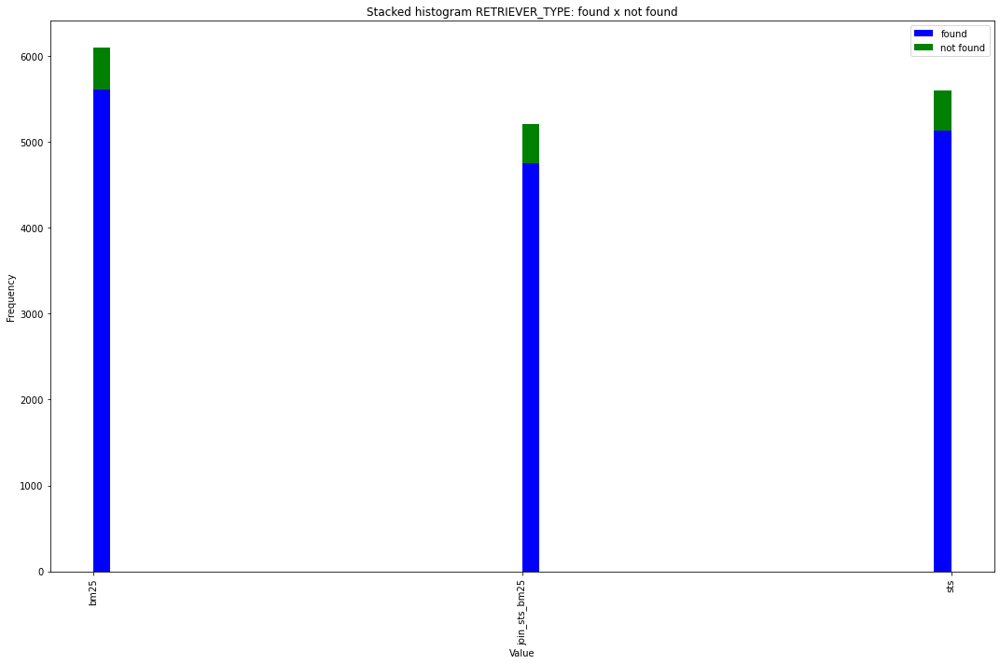

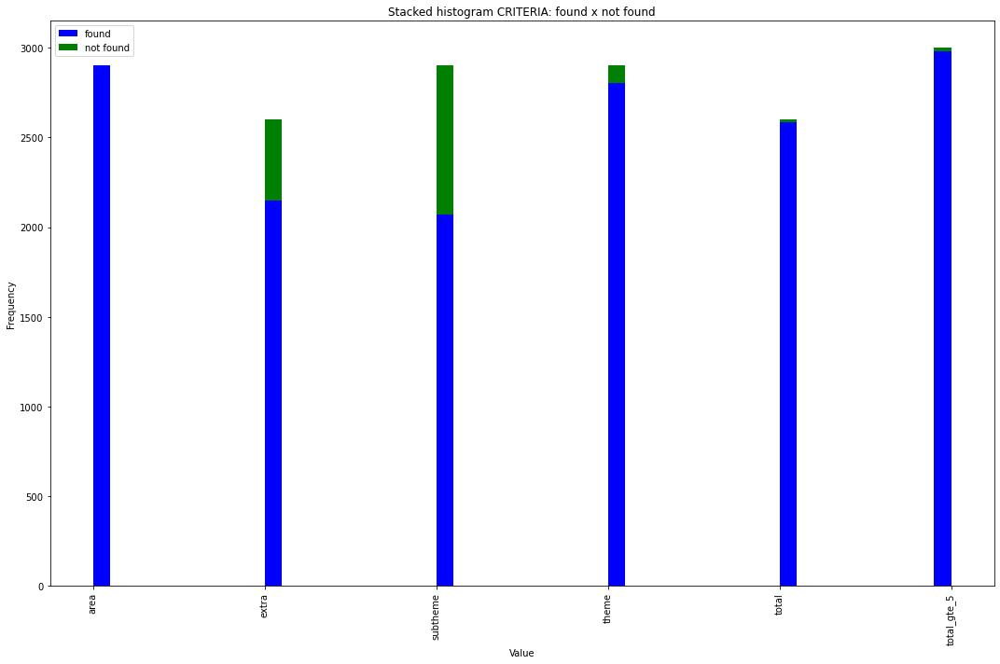

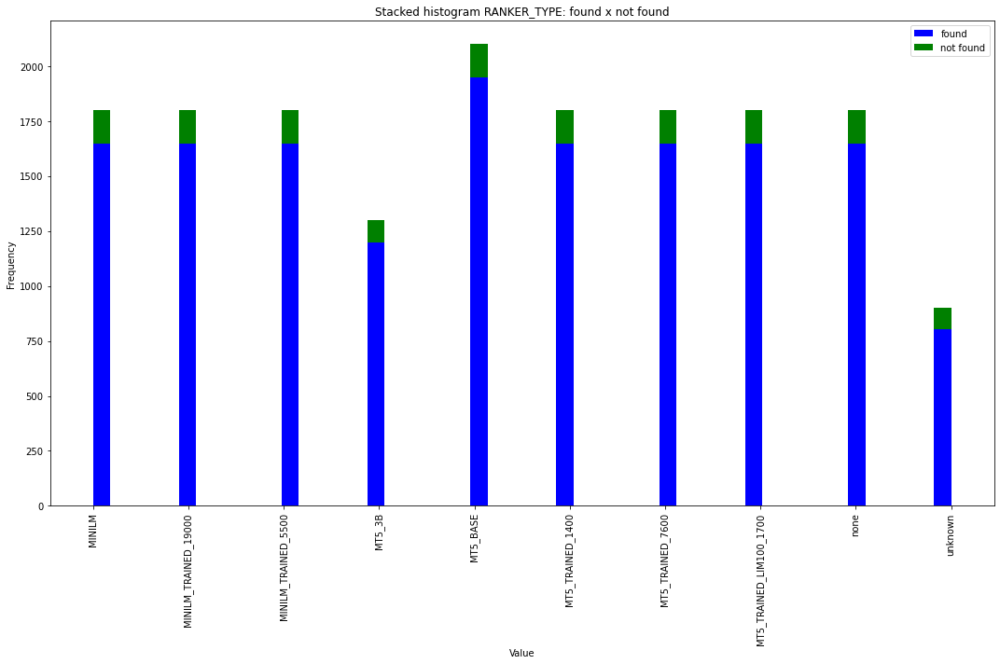

In [ ]:
for coluna in list_category:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result.sort_values(by=coluna)[coluna].dropna(), df_not_found.sort_values(by=coluna)[coluna].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {coluna}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

## Category evaluation

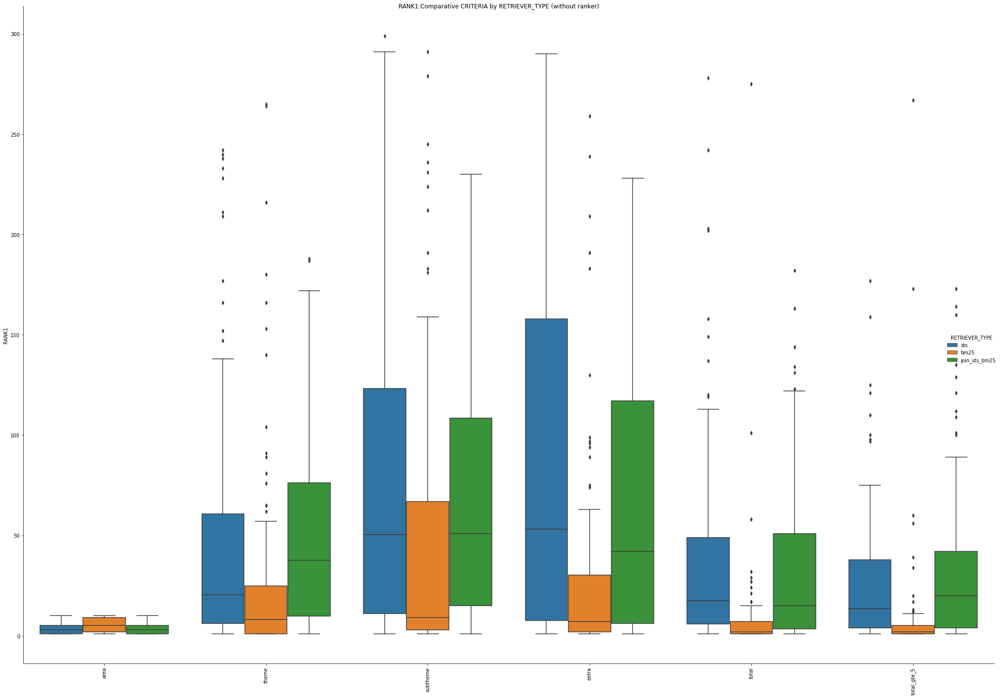

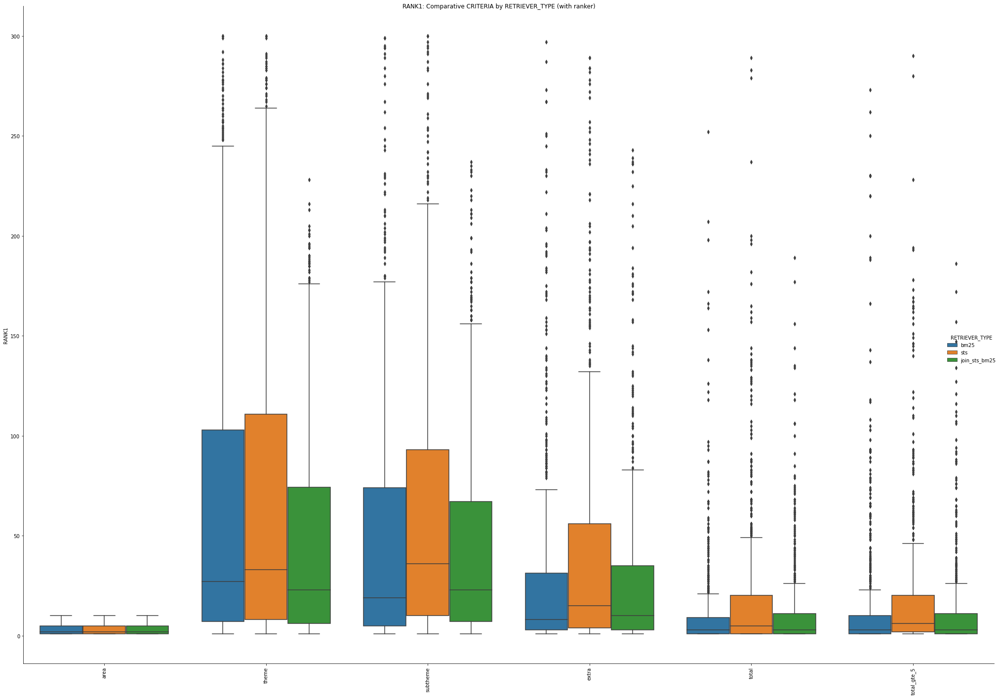

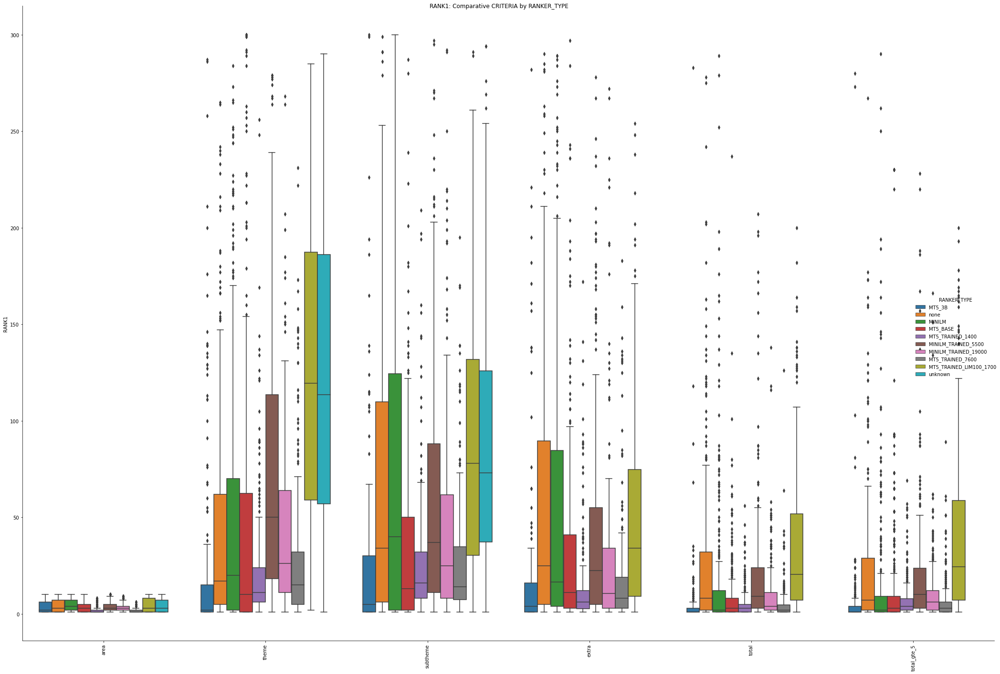

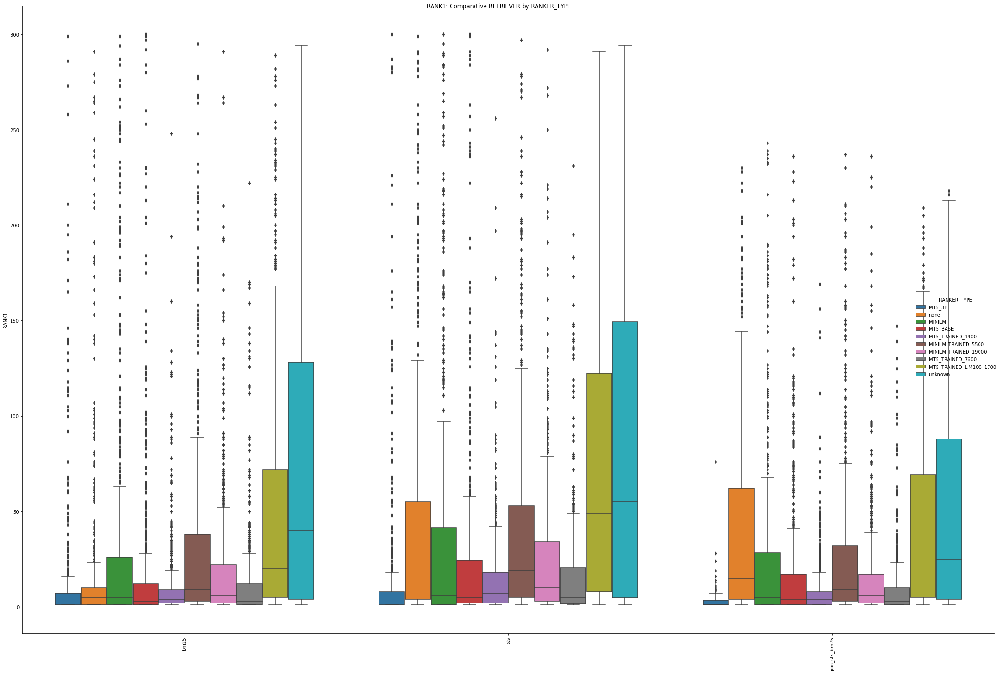

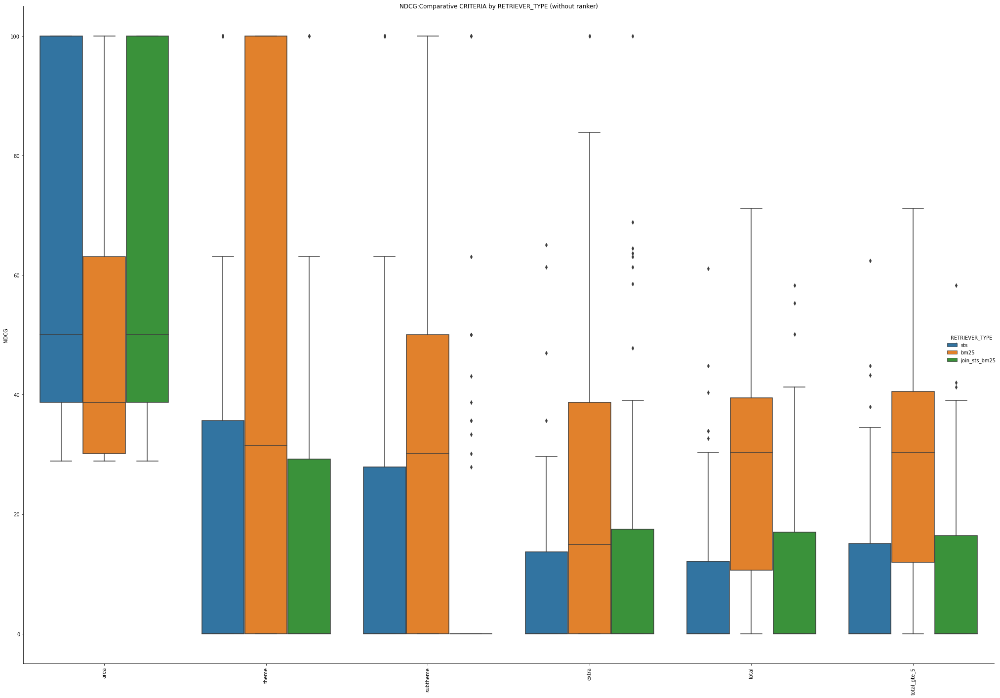

...

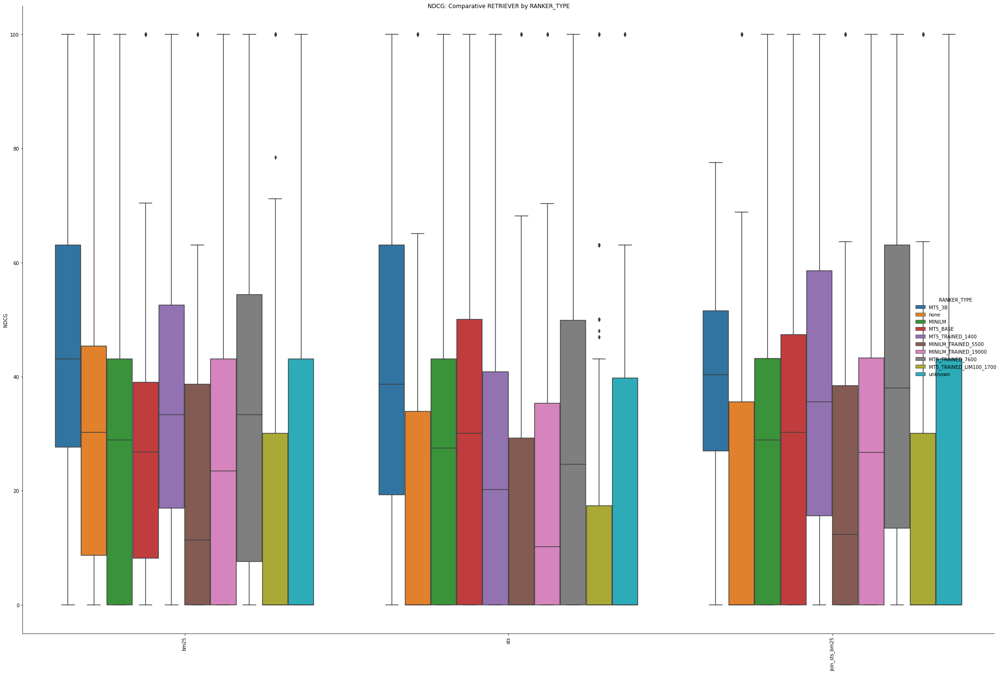

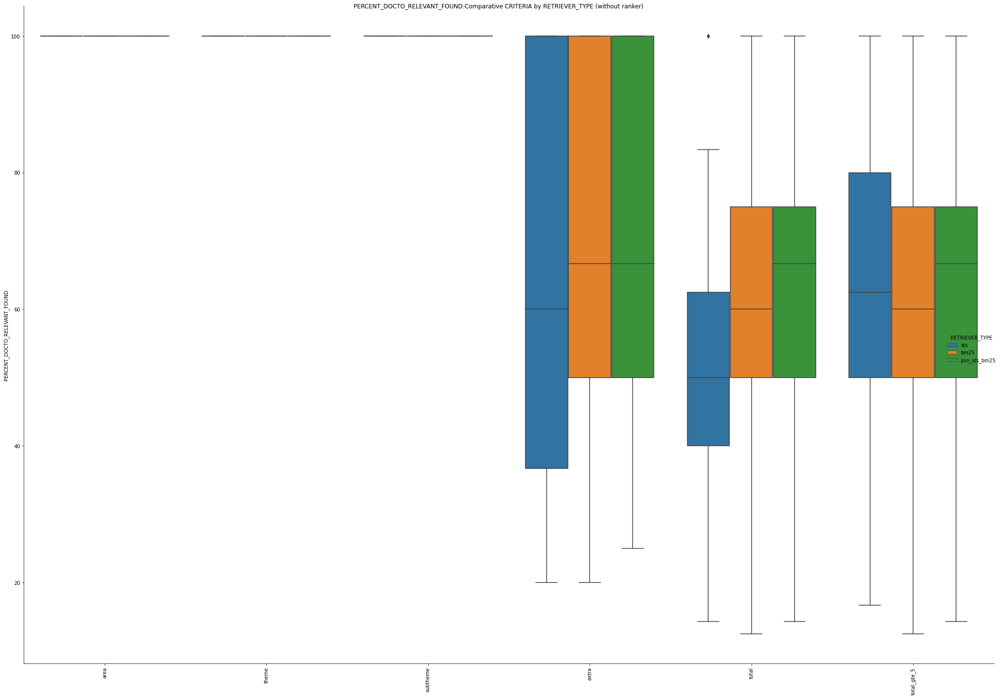

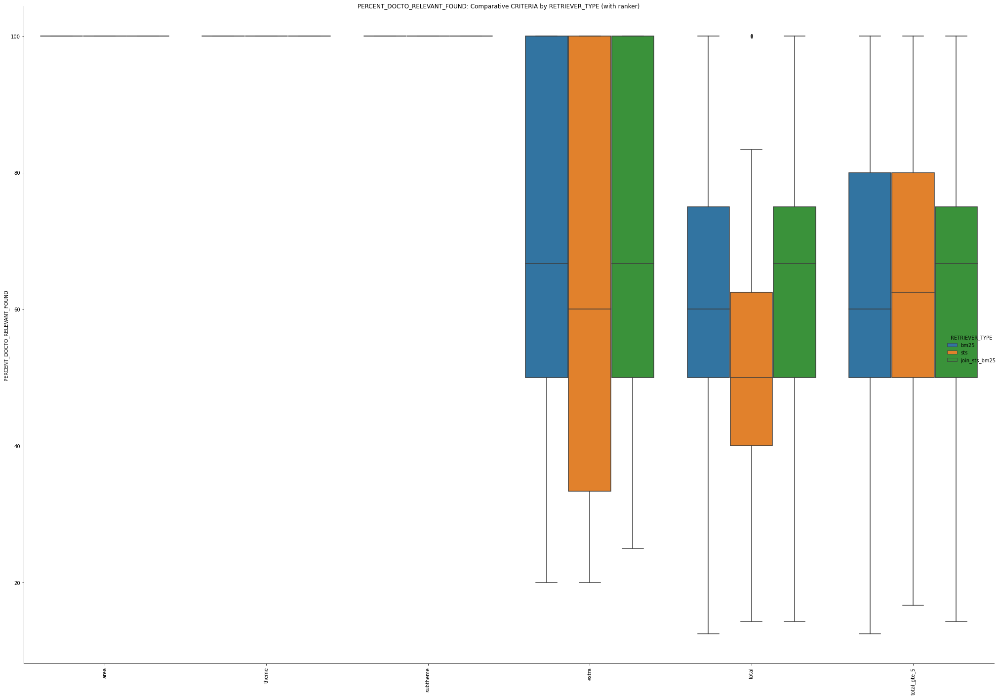

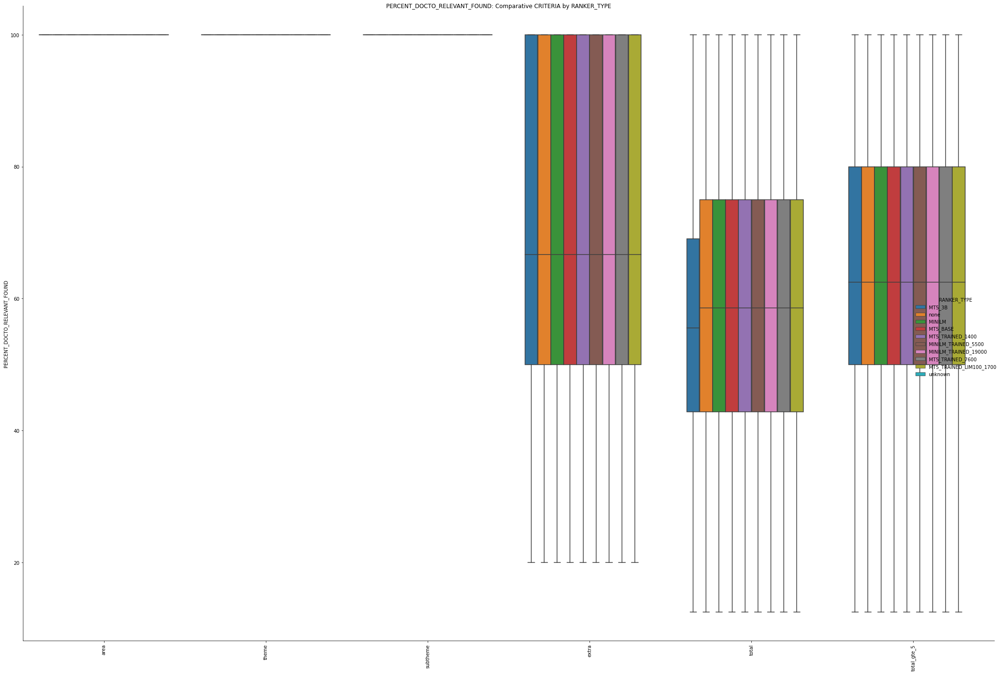

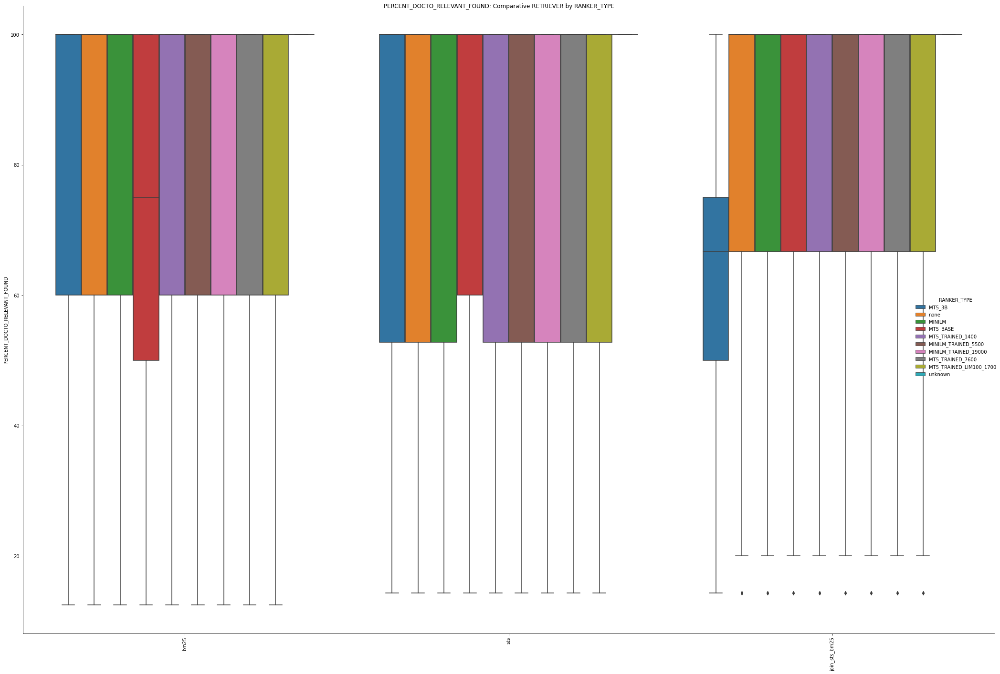

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER",
                    kind="box", data=df_result[df_result['RANKER']=='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}:Comparative CRITERIA by RETRIEVER (without ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER",
                    kind="box", data=df_result[df_result['RANKER']!='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RETRIEVER (with ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()    

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RANKER",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RANKER')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()      

    g = sns.catplot(x="RETRIEVER", sharex=True, y=metric, hue="RANKER",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative RETRIEVER by RANKER')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()     

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


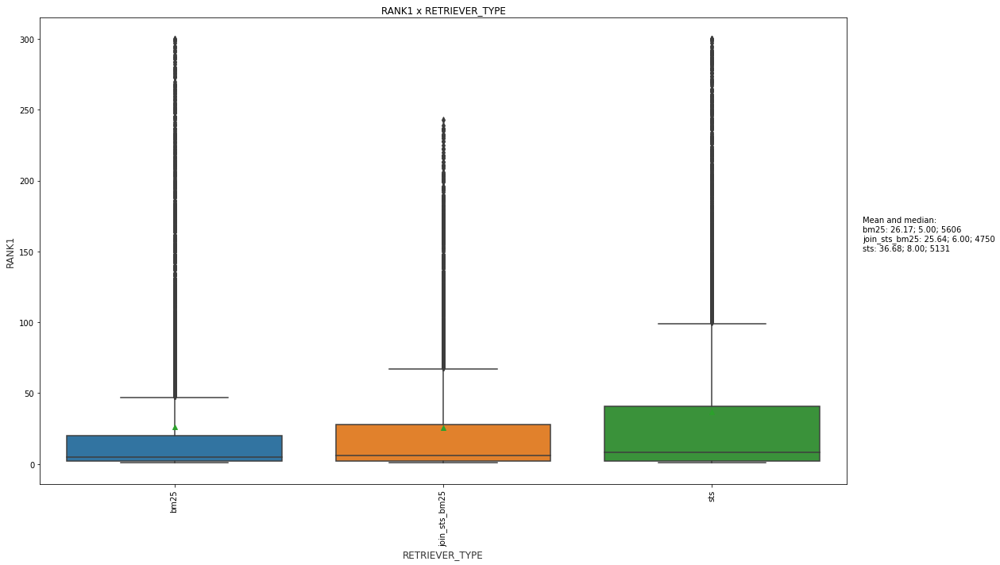

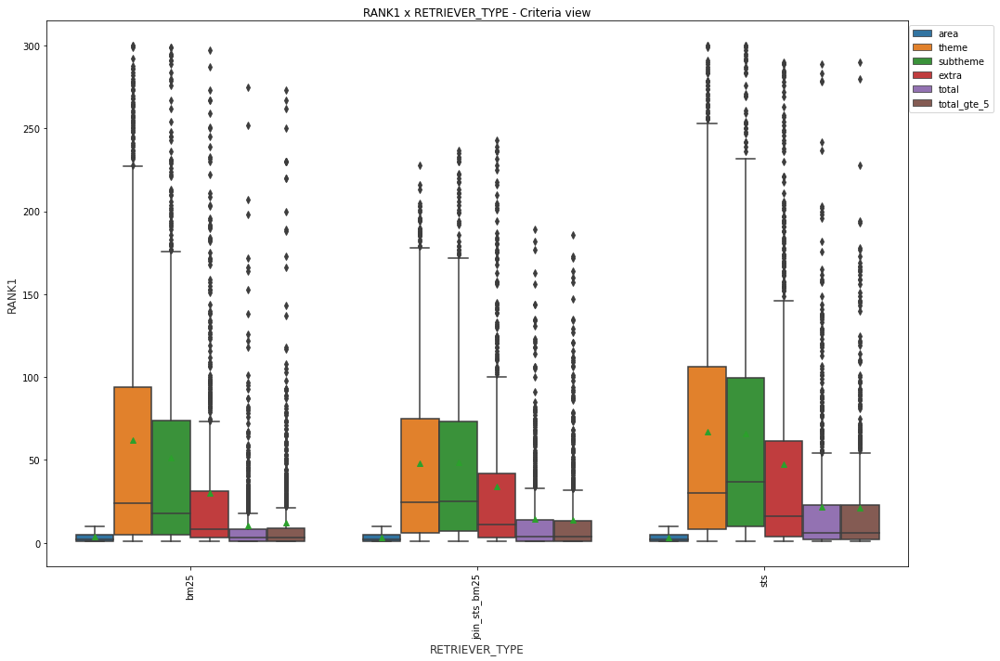

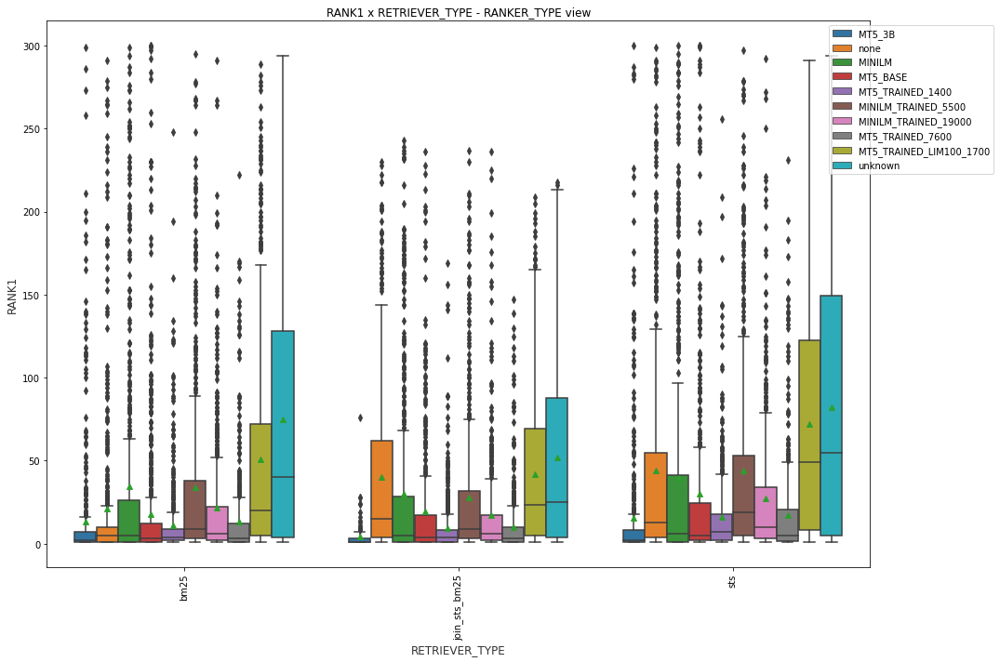

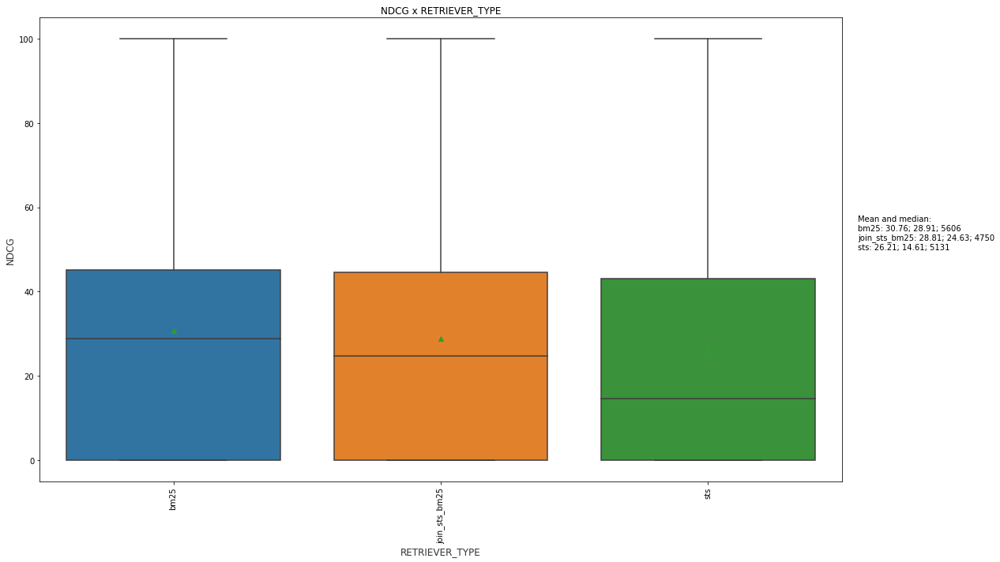

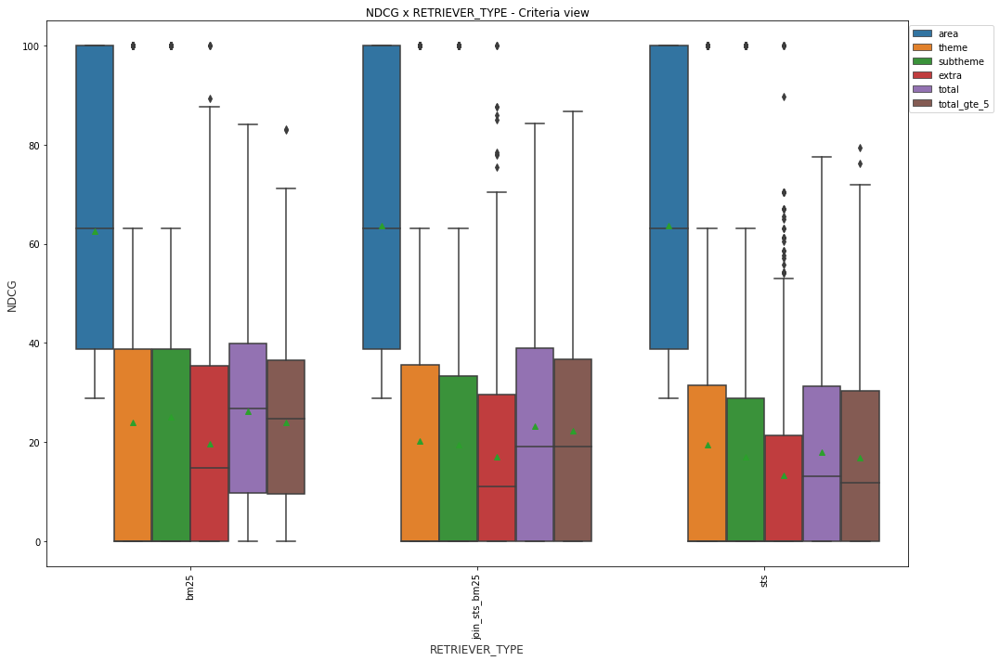

...

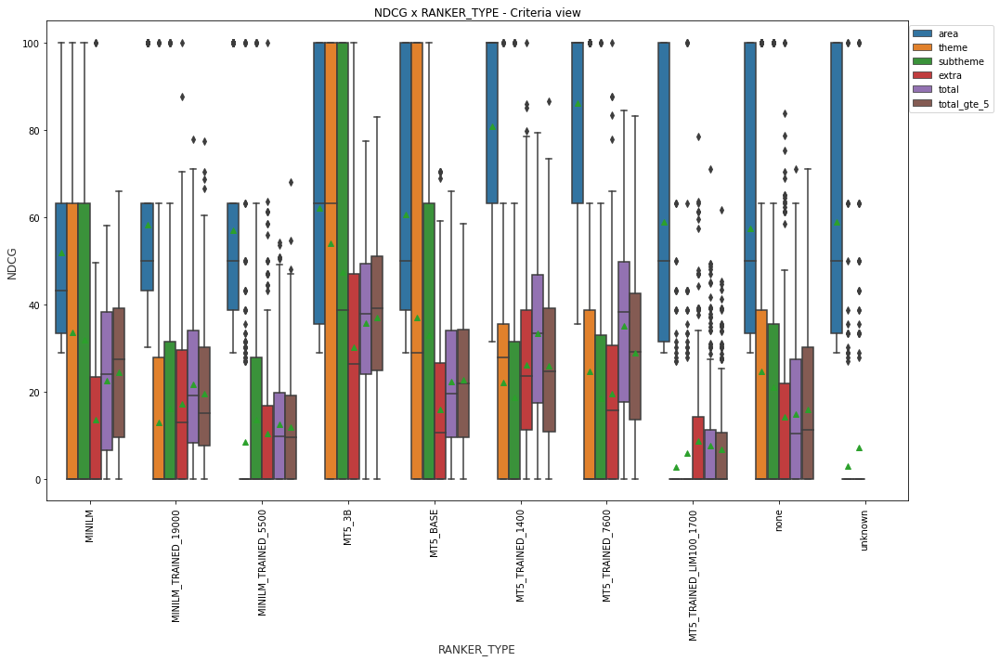

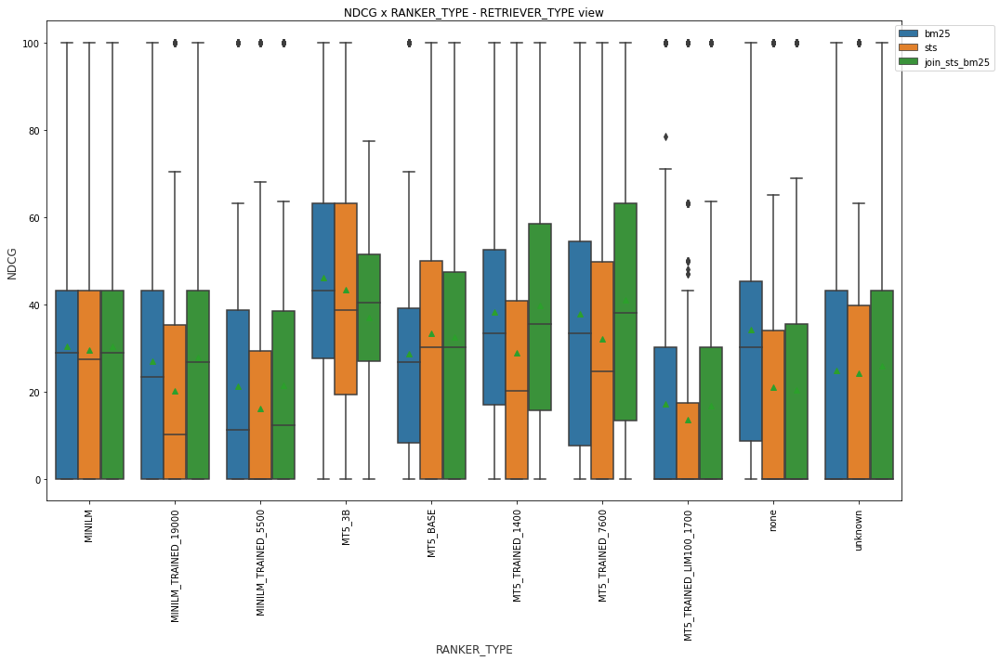

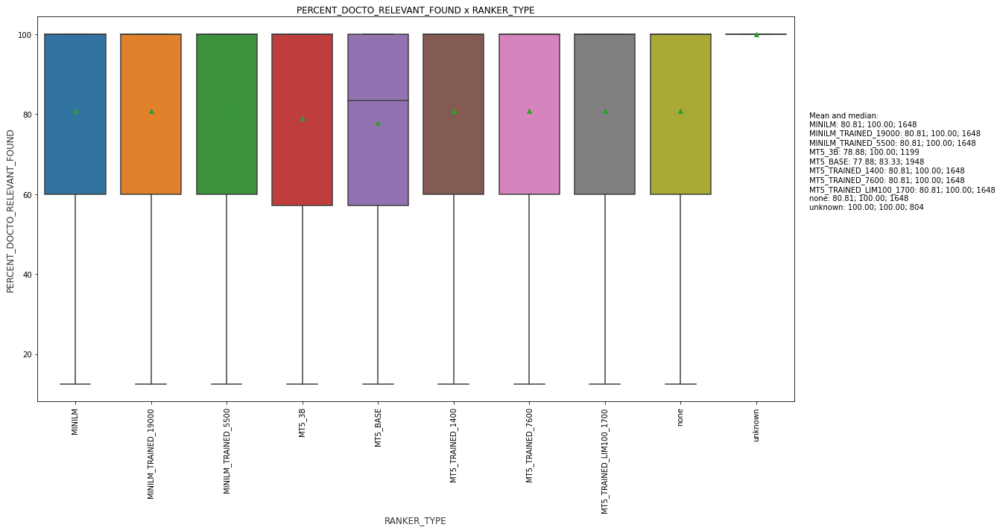

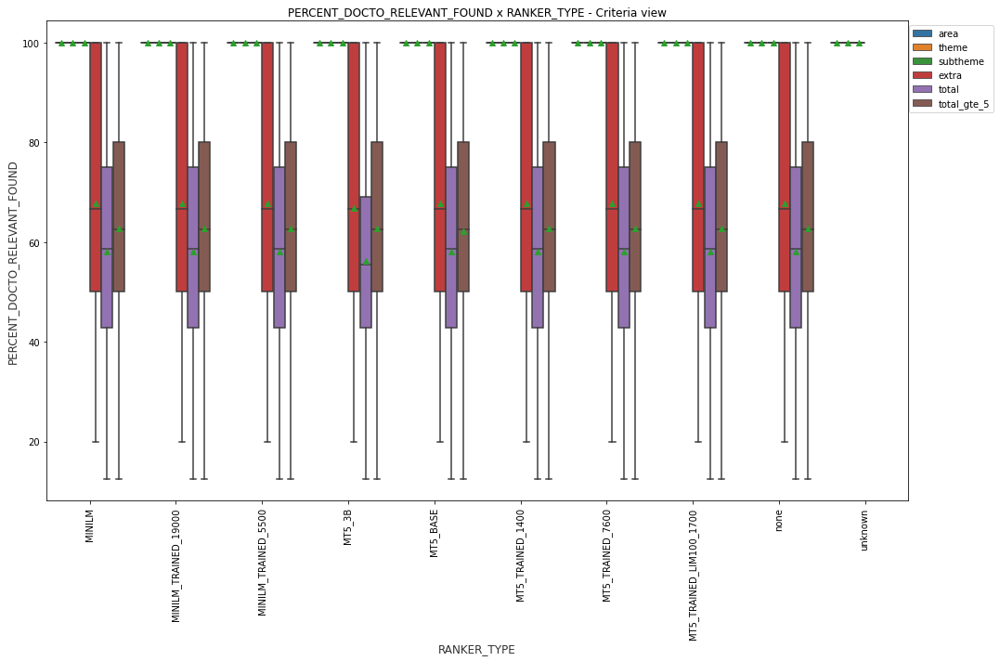

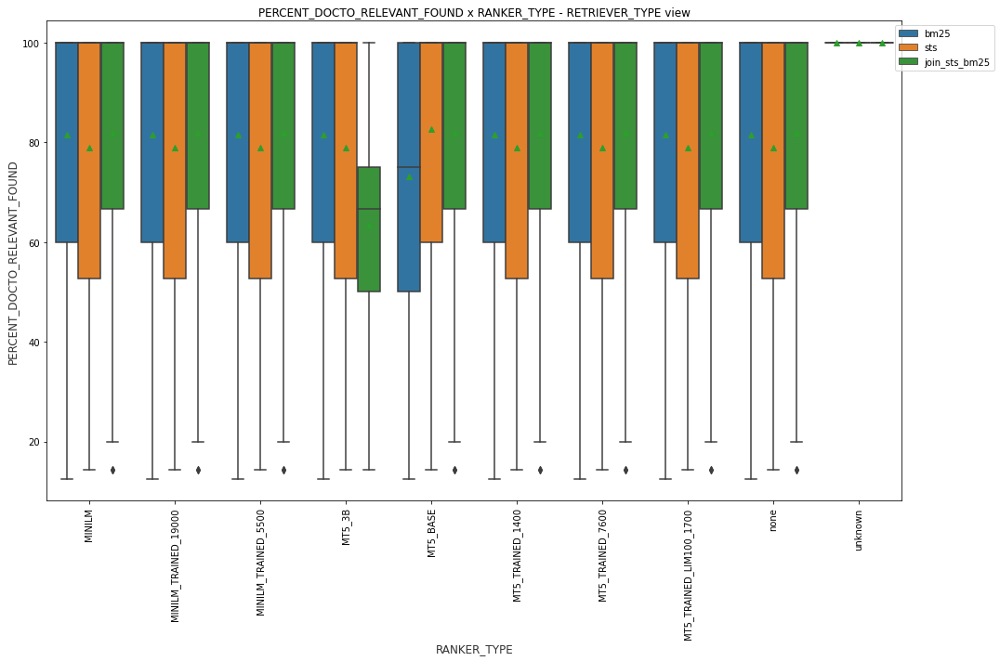

In [ ]:
for context in list_category: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result[context].unique())
        
        valores_unicos = sorted(df_result[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result.groupby(context)[metric].mean()
        mediana = df_result.groupby(context)[metric].median()
        count = df_result.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)

        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

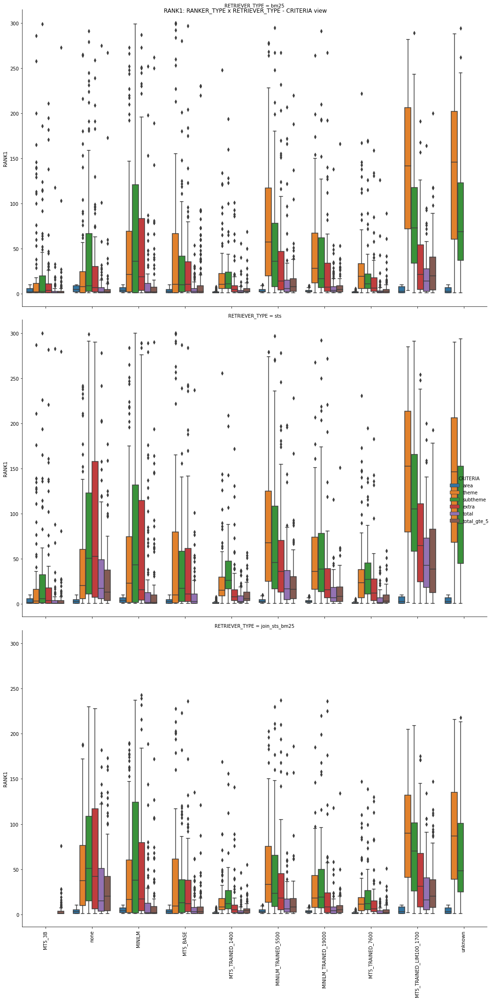

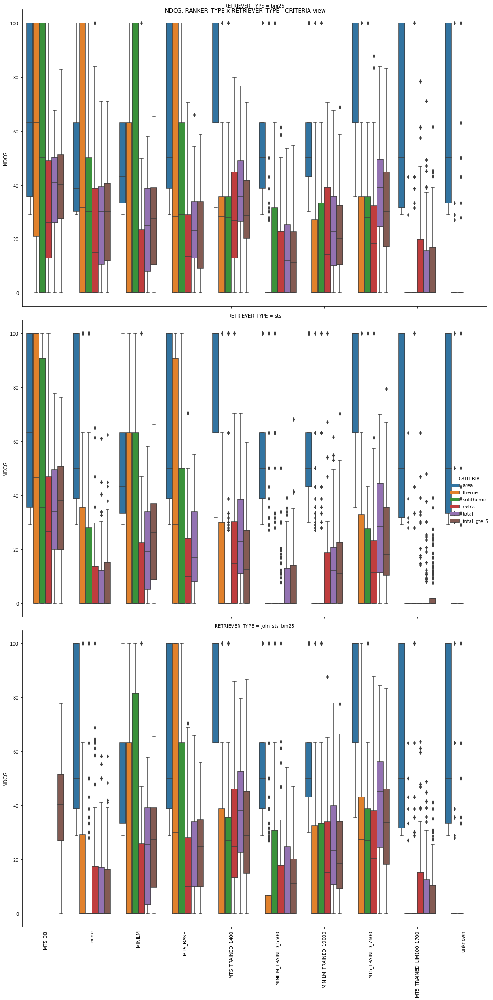

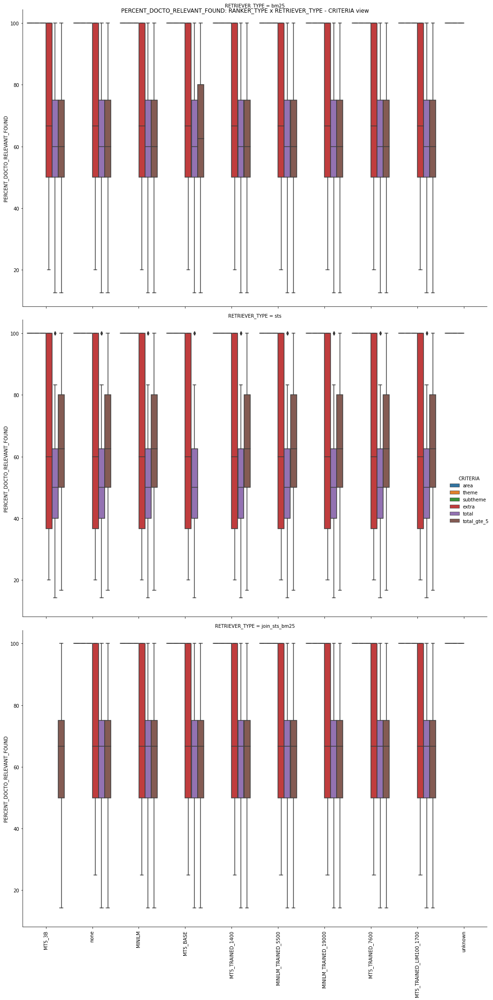

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="RANKER", sharex=True, y=metric, hue="CRITERIA", row="RETRIEVER", kind="box", data=df_result, height=10, aspect=20/15)
    g.fig.suptitle(f"{metric}: RANKER x RETRIEVER - CRITERIA view")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
plt.show()

STS encontrou mais (percent_found)
BM25 alcançou ndcg melhor entre os 12 primeiros


In [ ]:
df_result.corr()

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,COUNT_DOCTO_RELEVANT,COUNT_QUERY_RUN,COUNT_QUERY_WITHOUT_RESULT,COUNT_QUERY_NOT_FOUND,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_DOC_ID,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
TIME_SPENT,1.0000000,0.0368604,-0.0418115,0.2712758,0.1261649,NaN,NaN,0.0579834,NaN,NaN,NaN,0.0047678,0.0016259,0.0235049,0.0205219,0.0239114,0.0235697,0.0232368,0.0215879,0.0215719,0.1034036,-0.1154244
NDCG,0.0368604,1.0000000,-0.4749083,-0.5241326,-0.1912407,NaN,NaN,-0.2051666,NaN,NaN,NaN,0.0262825,0.0562691,0.0185437,0.0135144,0.0126814,0.0221319,0.0293206,0.0272372,0.0311527,-0.1019390,0.2629439
RANK1,-0.0418115,-0.4749083,1.0000000,0.2346386,-0.2064419,NaN,NaN,0.2455226,NaN,NaN,NaN,-0.0094389,-0.0486485,-0.0033668,-0.0082929,0.0049418,-0.0024324,-0.0068649,-0.0146882,-0.0233887,-0.2370507,0.0745274
COUNT_DOCTO_FOUND,0.2712758,-0.5241326,0.2346386,1.0000000,0.4192623,NaN,NaN,0.3172242,NaN,NaN,NaN,0.0036715,-0.0047640,-0.0013190,-0.0033015,-0.0009397,-0.0011156,-0.0009324,-0.0001402,-0.0007002,0.3493293,-0.3907233
COUNT_DOCTO_RELEVANT,0.1261649,-0.1912407,-0.2064419,0.4192623,1.0000000,NaN,NaN,-0.3303800,NaN,NaN,NaN,0.0175189,0.0858940,0.0447577,0.0442157,0.0408294,0.0384783,0.0370527,0.0342997,0.0446134,0.8567290,-0.7369830
COUNT_QUERY_RUN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
COUNT_QUERY_WITHOUT_RESULT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
COUNT_QUERY_NOT_FOUND,0.0579834,-0.2051666,0.2455226,0.3172242,-0.3303800,NaN,NaN,1.0000000,NaN,NaN,NaN,0.0173653,-0.0290616,-0.0048980,-0.0206477,-0.0045075,-0.0048726,-0.0057644,-0.0037760,-0.0093750,-0.3008026,0.1770259
TOPK_RETRIEVER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TOPK_RANKER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Correlation 

In [ ]:
df_result.corr()

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,COUNT_DOCTO_RELEVANT,COUNT_QUERY_RUN,COUNT_QUERY_WITHOUT_RESULT,COUNT_QUERY_NOT_FOUND,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_DOC_ID,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
TIME_SPENT,1.0000000,0.0368604,-0.0418115,0.2712758,0.1261649,NaN,NaN,0.0579834,NaN,NaN,NaN,0.0047678,0.0016259,0.0235049,0.0205219,0.0239114,0.0235697,0.0232368,0.0215879,0.0215719,0.1034036,-0.1154244
NDCG,0.0368604,1.0000000,-0.4749083,-0.5241326,-0.1912407,NaN,NaN,-0.2051666,NaN,NaN,NaN,0.0262825,0.0562691,0.0185437,0.0135144,0.0126814,0.0221319,0.0293206,0.0272372,0.0311527,-0.1019390,0.2629439
RANK1,-0.0418115,-0.4749083,1.0000000,0.2346386,-0.2064419,NaN,NaN,0.2455226,NaN,NaN,NaN,-0.0094389,-0.0486485,-0.0033668,-0.0082929,0.0049418,-0.0024324,-0.0068649,-0.0146882,-0.0233887,-0.2370507,0.0745274
COUNT_DOCTO_FOUND,0.2712758,-0.5241326,0.2346386,1.0000000,0.4192623,NaN,NaN,0.3172242,NaN,NaN,NaN,0.0036715,-0.0047640,-0.0013190,-0.0033015,-0.0009397,-0.0011156,-0.0009324,-0.0001402,-0.0007002,0.3493293,-0.3907233
COUNT_DOCTO_RELEVANT,0.1261649,-0.1912407,-0.2064419,0.4192623,1.0000000,NaN,NaN,-0.3303800,NaN,NaN,NaN,0.0175189,0.0858940,0.0447577,0.0442157,0.0408294,0.0384783,0.0370527,0.0342997,0.0446134,0.8567290,-0.7369830
COUNT_QUERY_RUN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
COUNT_QUERY_WITHOUT_RESULT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
COUNT_QUERY_NOT_FOUND,0.0579834,-0.2051666,0.2455226,0.3172242,-0.3303800,NaN,NaN,1.0000000,NaN,NaN,NaN,0.0173653,-0.0290616,-0.0048980,-0.0206477,-0.0045075,-0.0048726,-0.0057644,-0.0037760,-0.0093750,-0.3008026,0.1770259
TOPK_RETRIEVER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TOPK_RANKER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


    NDCG    
        COUNT_DOCTO_FOUND
        RANK1
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT(-)
        TOPK_RANKER (-)
        LEN_TEXT_CHAR_LOG (-)

    RANK1 (contribui se leva a um rank1 menor)
        PERCENT_DOCTO_RELEVANT_FOUND
        NDCG
        COUNT_DOCTO_RELEVANT (-)
        TOPK_RANKER (-)

    COUNT_DOCTO_RELEVANT
        COUNT_DOCTO_RELEVANT_FOUND
        LEN_TEXT_CHAR_LOG

    TIME_SPENT
        COUNT_DOCTO_RELEVANT_FOUND
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        TOPK_RANKER (-)

    COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND

    TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND


## Distribution of values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


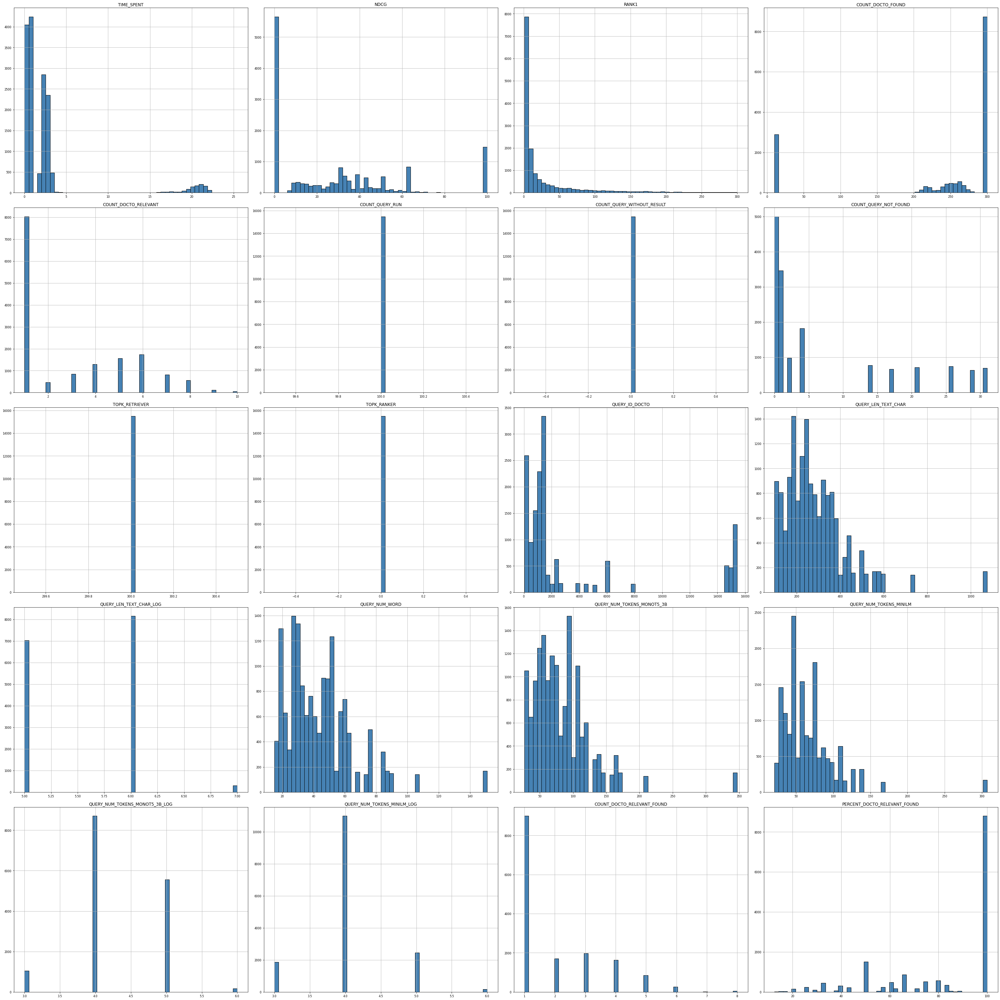

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(40,40))
ax.set_title('Histogram')
df_result.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=50, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout()   

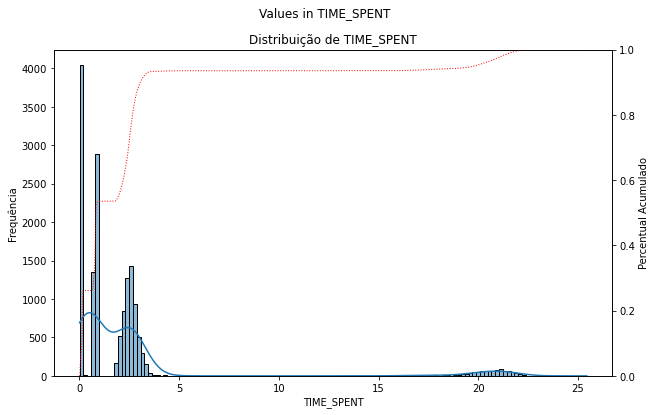

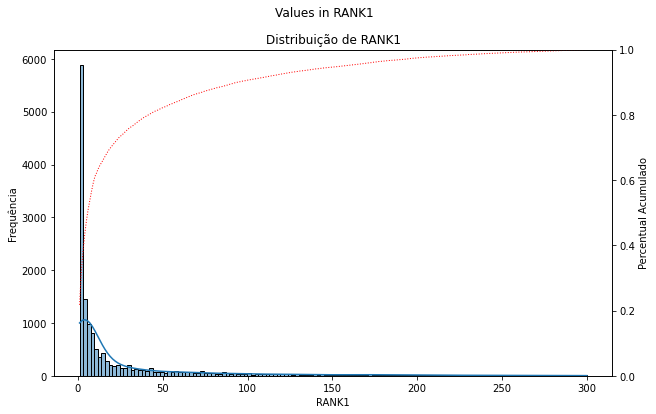

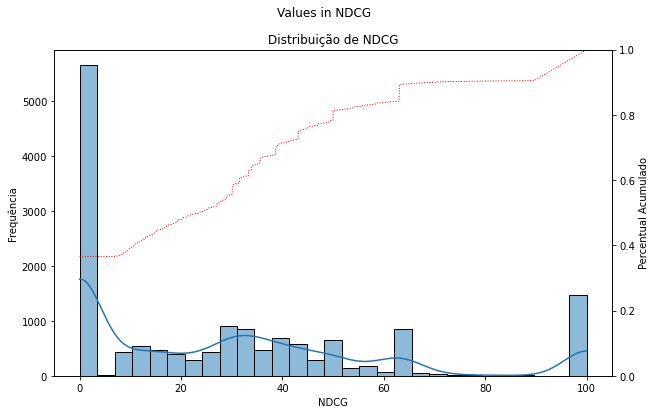

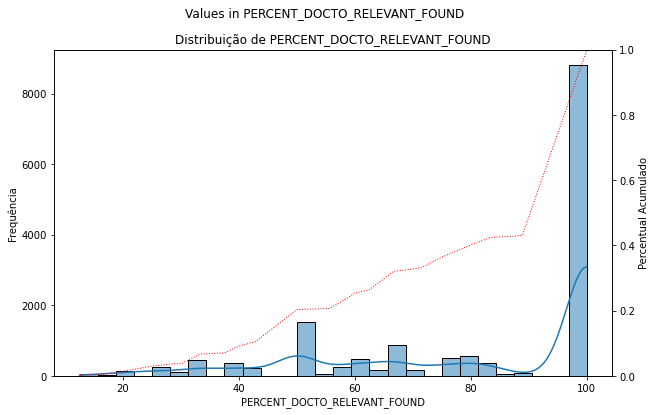

In [ ]:
for column in ['TIME_SPENT'] + list_metric + list_category:
    if df_result[column].dtype != object:
        f, ax = plt.subplots(1, 1, figsize=(10,6))
        f.suptitle(f'Values in {column}')    
        # Plot o histograma normalizado com KDE
        sns.histplot(data=df_result[column], kde=True, ax=ax, linewidth=1)

        # Calcula o percentual acumulado
        cumulative = df_result[column].value_counts(normalize=True).sort_index().cumsum()

        # Cria um novo eixo y com o percentual acumulado
        ax2 = ax.twinx()
        ax2.plot(cumulative.index, cumulative.values, linestyle='dotted', marker='', color='red', linewidth=1)
        ax2.set_ylim([0, 1])
        ax2.set_ylabel('Percentual Acumulado')

        # Configurações do gráfico
        ax.set_title(f'Distribuição de {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequência')
# Exibe o gráfico
plt.show()

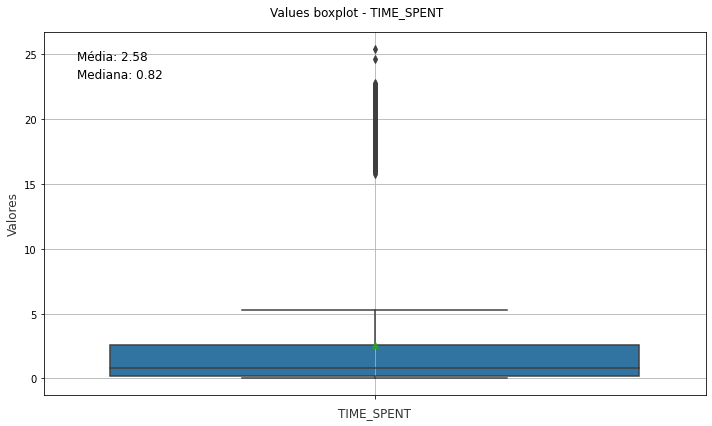

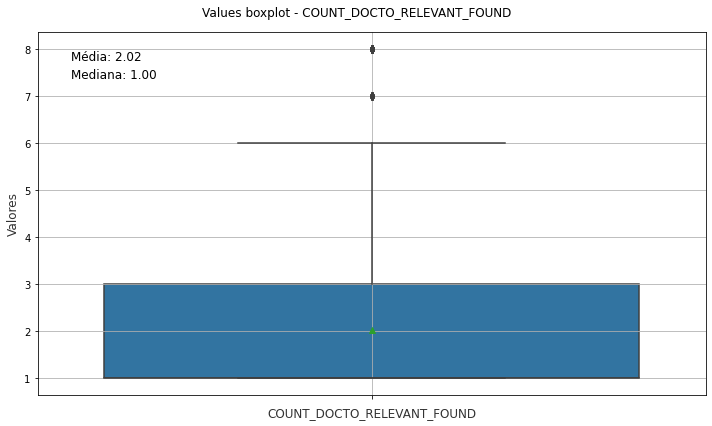

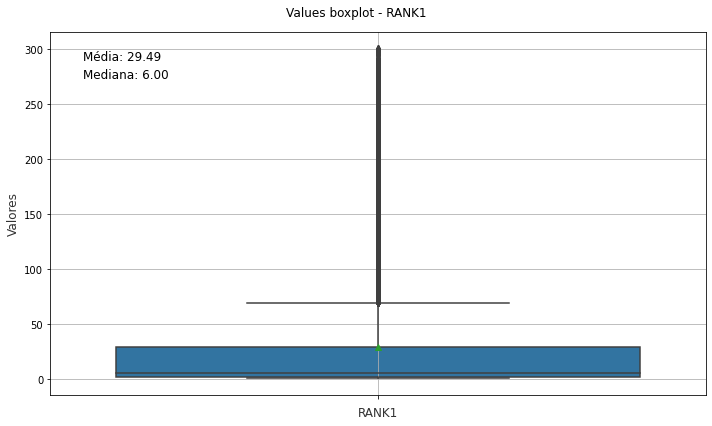

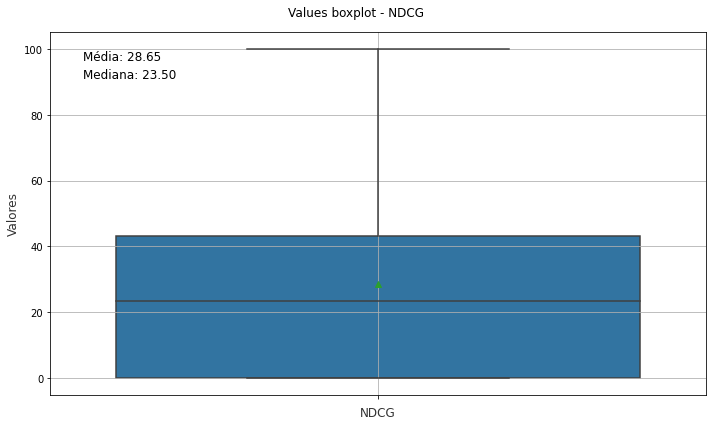

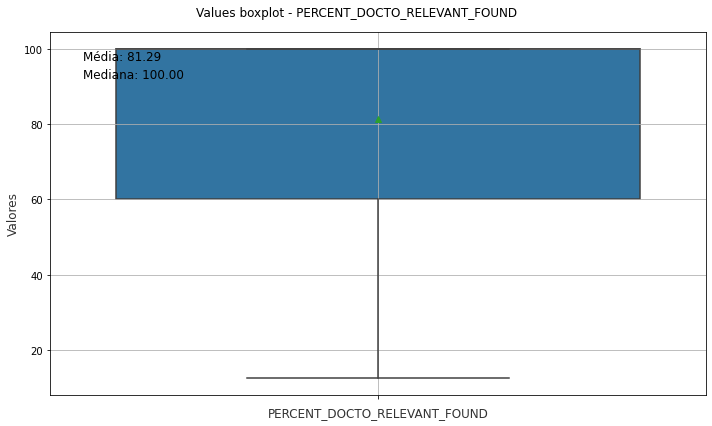

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_result[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Values boxplot - {column}')
    ax = sns.boxplot(y=column, data=df_result, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_result, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_result[column].mean(), 3)
    median_val = df_result[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_result['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

## Best ndcg evaluation

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [ ]:
df_result.sort_values(by='NDCG', ascending=False).head(10)

,TIME,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_RETURNED,COUNT_QUERY_RUN,COUNT_QUERY_WITHOUT_RESULT,COUNT_QUERY_NOT_FOUND,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,CRITERIA,RETRIEVER_TYPE,RETRIEVER_MODEL_NAME,RANKER_MODEL_NAME,QUERY_ID,QUERY_RELEVANCE_DICT_ID_DOC,QUERY_RELEVANCE_DICT_TYPE,QUERY_PARADIGMATIC,QUERY_AREA_NAME,QUERY_DOC_ID,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
10037,2023-Jun-24 18:40:41,0.1226,100.0,1,10,[1],1,{1131: 'AREA'},"[1131, 5288, 414, 932, 342, 629, 775, 15273, 3...",100,0.0,0.0,300,0.0,12,area,sts,NaN,unicamp-dl/ptt5-base-pt-msmarco-100k-v2-1400,34017,"{14854: 'SUBTEMA', 887: 'INDEXACAO_EXTRA', 26:...","{'SUBTEMA': [14854], 'INDEXACAO_EXTRA': [887, ...",NaN,Pessoal,14854,219,5,34,73,58,4,4,1,100.0,MT5_TRAINED_1400
1395,2023-Jun-24 16:42:24,0.1344,100.0,1,10,[1],1,{932: 'AREA'},"[932, 775, 342, 5095, 5288, 629, 1131, 15273, ...",100,0.0,0.0,300,0.0,12,area,bm25,NaN,unicamp-dl/ptt5-base-pt-msmarco-100k-v2,13651,"{932: 'AREA', 2353: 'INDEXACAO_EXTRA', 1635: '...","{'AREA': [932], 'INDEXACAO_EXTRA': [2353, 3674...",NaN,Licitação,932,225,5,34,60,46,4,4,1,100.0,MT5_BASE
9494,2023-Jun-24 08:37:30,0.7822,100.0,1,300,[1],1,{722: 'SUBTEMA'},"[722, 16003, 1100836, 1100694, 16005, 1558, 11...",100,0.0,26.0,300,0.0,12,subtheme,sts,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mMiniLM-L6-v2-pt-v2,33691,"{1381: 'TEMA', 1571: 'INDEXACAO_EXTRA', 15342:...","{'TEMA': [1381], 'INDEXACAO_EXTRA': [1571, 153...",NaN,Pessoal,1381,184,5,28,49,44,4,4,1,100.0,MINILM
14261,2023-Jun-24 18:40:28,0.1327,100.0,1,10,[1],1,{775: 'AREA'},"[775, 342, 414, 932, 5288, 629, 331, 15273, 50...",100,0.0,0.0,300,0.0,12,area,join_sts_bm25,NaN,unicamp-dl/ptt5-base-pt-msmarco-100k-v2-1400,60979,"{342: 'TEMA', 15274: 'INDEXACAO_EXTRA', 1201: ...","{'TEMA': [342], 'INDEXACAO_EXTRA': [15274, 120...",NaN,Responsabilidade,342,314,6,48,84,67,4,4,1,100.0,MT5_TRAINED_1400
9503,2023-Jun-24 10:02:50,0.7274,100.0,1,234,[1],1,{722: 'SUBTEMA'},"[722, 16003, 1100836, 1100694, 16005, 1558, 11...",100,0.0,29.0,300,0.0,12,subtheme,join_sts_bm25,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mMiniLM-L6-v2-pt-v2,33691,"{1381: 'TEMA', 1571: 'INDEXACAO_EXTRA', 15342:...","{'TEMA': [1381], 'INDEXACAO_EXTRA': [1571, 153...",NaN,Pessoal,1381,184,5,28,49,44,4,4,1,100.0,MINILM
14262,2023-Jun-24 18:40:41,0.1244,100.0,1,10,[1],1,{775: 'AREA'},"[775, 342, 414, 932, 5288, 629, 331, 15273, 50...",100,0.0,0.0,300,0.0,12,area,sts,NaN,unicamp-dl/ptt5-base-pt-msmarco-100k-v2-1400,60979,"{342: 'TEMA', 15274: 'INDEXACAO_EXTRA', 1201: ...","{'TEMA': [342], 'INDEXACAO_EXTRA': [15274, 120...",NaN,Responsabilidade,342,314,6,48,84,67,4,4,1,100.0,MT5_TRAINED_1400
1389,2023-Jun-24 09:58:36,0.0698,100.0,1,10,[1],1,{932: 'AREA'},"[932, 342, 5095, 775, 629, 331, 15273, 414, 52...",100,0.0,0.0,300,0.0,12,area,join_sts_bm25,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mMiniLM-L6-v2-pt-v2,13651,"{932: 'AREA', 2353: 'INDEXACAO_EXTRA', 1635: '...","{'AREA': [932], 'INDEXACAO_EXTRA': [2353, 3674...",NaN,Licitação,932,225,5,34,60,46,4,4,1,100.0,MINILM
6735,2023-Jun-25 15:20:36,0.1306,100.0,1,10,[1],1,{1131: 'AREA'},"[1131, 775, 629, 5288, 342, 414, 15273, 331, 9...",100,0.0,0.0,300,0.0,12,area,sts,NaN,unicamp-dl/ptt5-base-pt-msmarco-100k-v2-lim100...,29671,"{15427: 'INDEXACAO_EXTRA', 15326: 'TEMA', 186:...","{'INDEXACAO_EXTRA': [15427, 186, 5300, 5083], ...",NaN,Pessoal,15427,347,6,57,106,81,5,4,1,100.0,MT5_TRAINED_LIM100_1700
6734,2023-Jun-25 15:20:22,0.1165,100.0,1,10,[1],1,{1131: 'AREA'},"[1131, 775, 629, 5288, 342, 414, 15273, 331, 9...",100,0.0,0.0,300,0.0,12,area,bm25,NaN,unicamp-dl/ptt5-base-pt-msmarco-100k-v2-lim100...,29671,"{15427: 'INDEXACAO_EXTRA', 15326: 'TEMA', 186:...","{'INDEXACAO_EXTRA': [15427, 186, 5300, 5083], ...",NaN,P

In [ ]:
df_top = df_result[df_result['NDCG'] >= 60].sort_values(by='NDCG', ascending=False)
df_top.shape

(2514, 35)

### Distribution of Values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


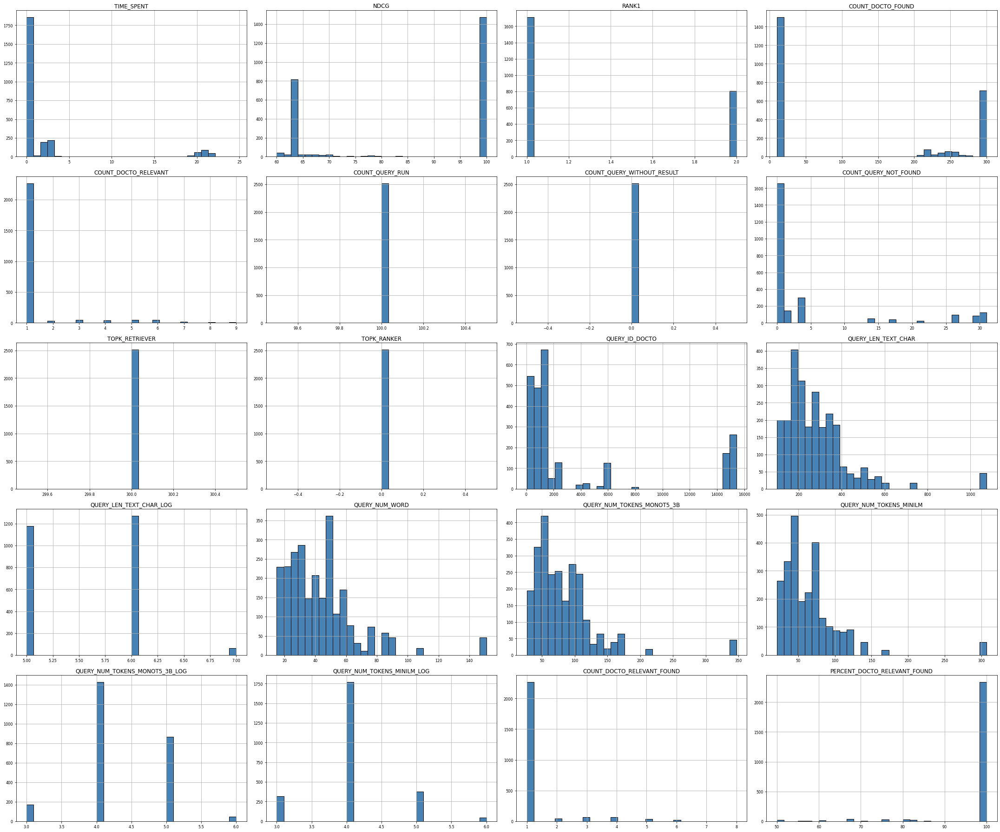

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(30,25))
ax.set_title('Histogram')
df_top.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=30, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout() 

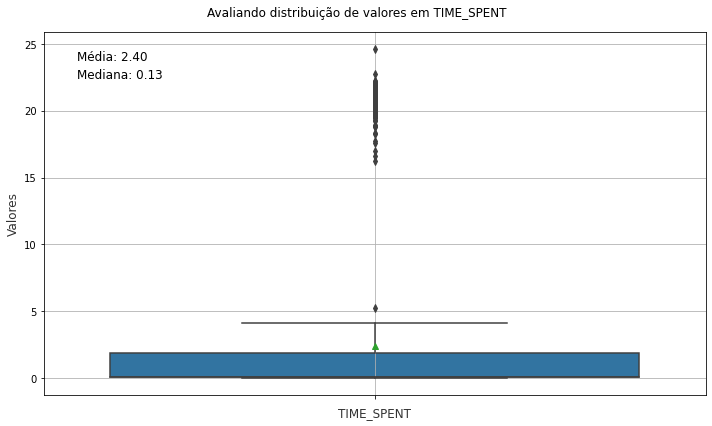

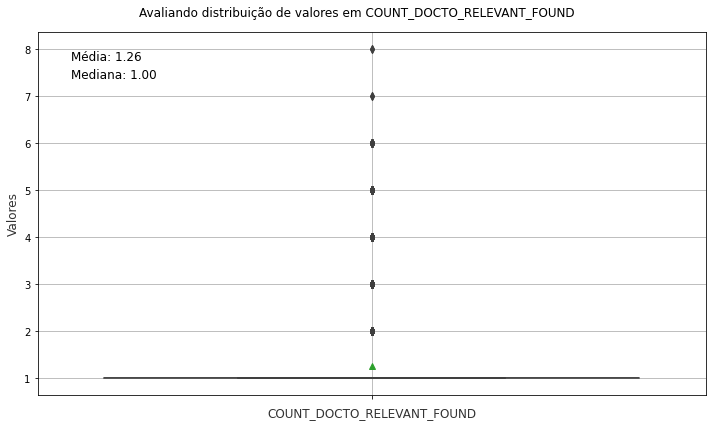

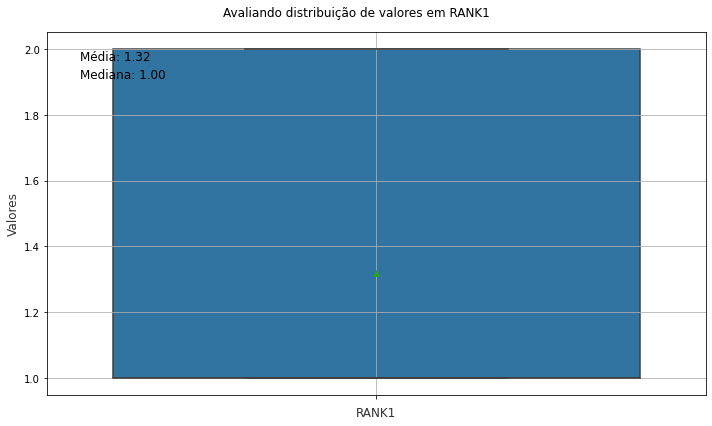

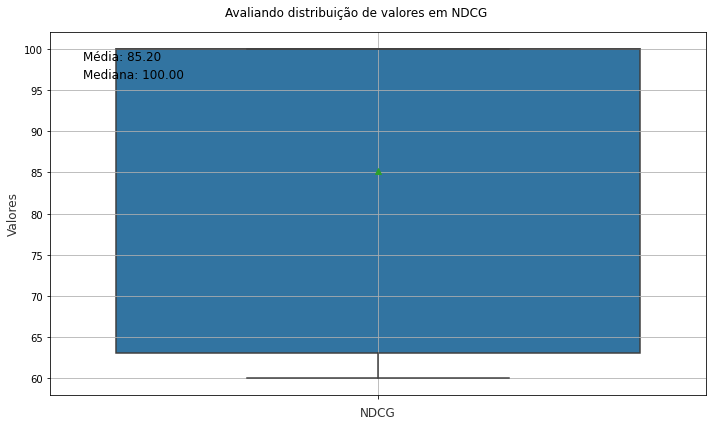

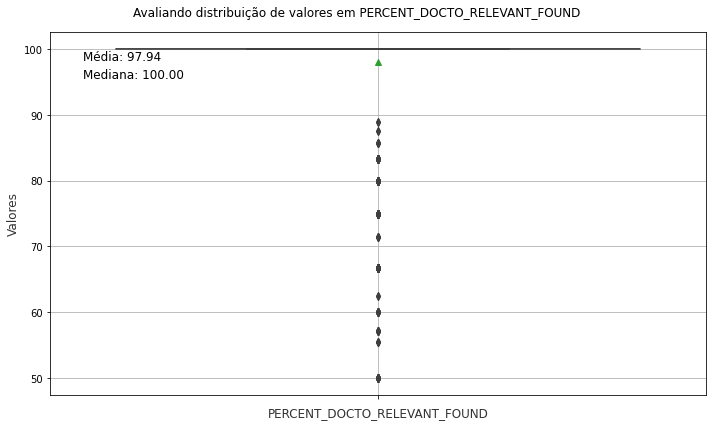

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_top[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Avaliando distribuição de valores em {column}')
    ax = sns.boxplot(y=column, data=df_top, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_top, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_top[column].mean(), 3)
    median_val = df_top[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_top['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

### Category evaluation

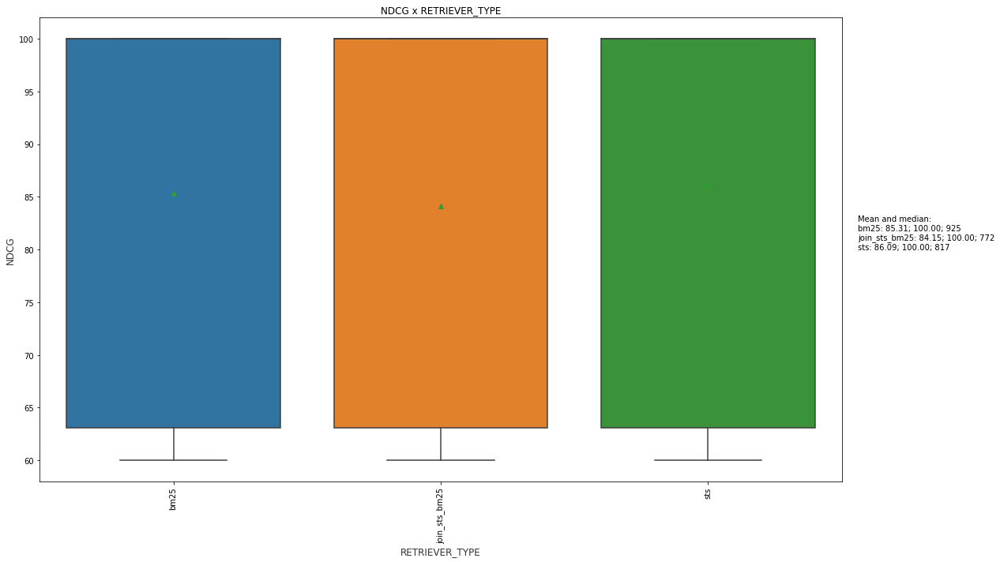

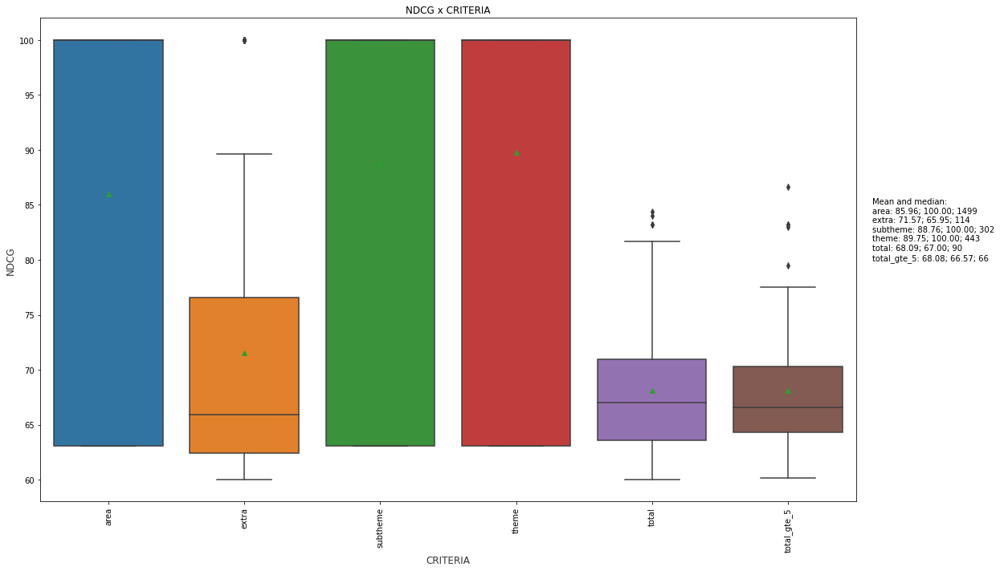

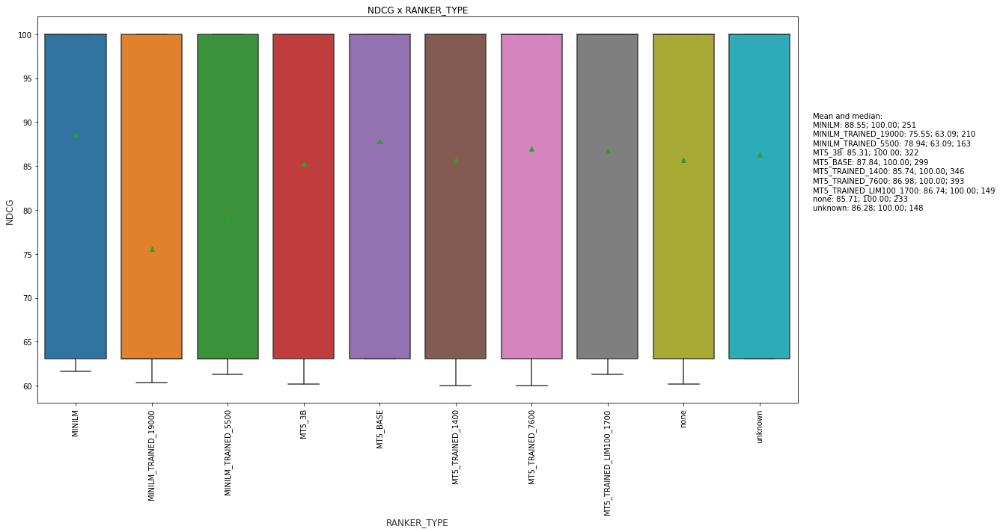

In [ ]:
for context in list_category: 
    for metric in ['NDCG']:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_top[context].unique())
        
        valores_unicos = sorted(df_top[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_top, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_top.groupby(context)[metric].mean()
        mediana = df_top.groupby(context)[metric].median()
        count = df_top.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)


# Selected configuration

In [ ]:
df_result.shape

(15487, 35)

In [ ]:
df_result = df_result[(df_result['RANKER']=='MT5_3B') & (df_result['CRITERIA'].isin(['total'])) & (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt')]

In [ ]:
df_result['RETRIEVER'].unique()

array(['bm25', 'sts'], dtype=object)

In [ ]:
df_result.shape

(1300, 33)

## Separate found x not found

In [ ]:
df_not_found = df_result[df_result['RANK1']==0]

In [ ]:
df_not_found.shape

(0, 31)

In [ ]:
df_result = df_result[df_result['RANK1']>0]

In [ ]:
df_result.shape

(349, 31)

In [ ]:
del df_not_found['RANK1']

## Some consolidated data

In [ ]:
df_result.groupby(['TOPK_RETRIEVER','RANKER','RETRIEVER','CRITERIA']).agg(dict_metrics)

RANK1              \
                                                      count        mean   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                        
100            minilm      bm25           total         300    7.773333   
                                          total_gte_5   300    6.610000   
                           sts            total         300    7.266667   
                                          total_gte_5   300    5.433333   
               monot5      bm25           total         200    2.870000   
...                                                     ...         ...   
600            none        join_sts_bm25  extra          98  106.214286   
                                          subtheme      100  103.970000   
                                          theme         100   55.600000   
                                          total         100   59.380000   
                                          total_gte_5   100    3.470000   

                                                              NDCG             \
                                                      median count       mean   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                              
100            minilm      bm25           total          2.0   300  24.615900   
                                          total_gte_5    2.0   300  25.978700   
                           sts            total          2.0   300  21.227900   
                                          total_gte_5    2.0   300  23.582200   
               monot5      bm25           total          1.0   200  38.850500   
...                                                      ...   ...        ...   
600            none        join_sts_bm25  extra         53.0    98   6.239898   
                                          subtheme      45.5   100   7.911200   
                                          theme         27.0   100  17.263300   
                                          total         28.0   100   6.829300   
                                          total_gte_5    3.0   100  21.538400   

                                                               \
                                                       median   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA              
100            minilm      bm25           total        26.390   
                                          total_gte_5  27.490   
                           sts            total        16.265   
                                          total_gte_5  21.705   
               monot5      bm25           total        41.530   
...                                                       ...   
600            none        join_sts_bm25  extra         0.000   
                                          subtheme      0.000   
                                          theme         0.000   
                                          total         0.000   
                                          total_gte_5  17.340   

                                                      PERCENT_DOCTO_RELEVANT_FOUND  \
                                                                             count   
TOPK_RETRIEVER RANKER_TYPE RETRIEVER_TYPE CRITERIA                                   
100            minilm      bm25           total                                300   
                                          total_gte_5                          300   
                           sts            total                                300   
                                          total_gte_5                          300   
               monot5      bm25           total                                200   
...                                                                            ...   
600            none        join_sts_bm25  extra                                 98   
                                          subtheme                             100   
           

In [ ]:
df_result.groupby(['CRITERIA']).count()

,TIME,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_RETURNED,RETRIEVER_TYPE,...,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
CRITERIA,,,,,,,,,,,,,,,,,,,,,
area,1500,1500,1500,1500,1500,1500,1500,1500,1500,1500,...,1500,1500,1500,1500,1500,1500,1500,1500,1500,1500
class_termo,100,100,100,100,100,100,100,0,100,100,...,100,100,100,100,100,100,100,100,100,100
extra,1276,1276,1276,1276,1276,1276,1276,1262,1276,1276,...,1276,1276,1276,1276,1276,1276,1276,1276,1262,1276
subtheme,1300,1300,1300,1300,1300,1300,1300,1269,1300,1300,...,1300,1300,1300,1300,1300,1300,1300,1300,1269,1300
theme,1400,1400,1400,1400,1400,1400,1400,1392,1400,1400,...,1400,1400,1400,1400,1400,1400,1400,1400,1392,1400
total,5100,5100,5100,5100,5100,5100,5100,1299,5100,5100,...,5100,5100,5100,5100,5100,5100,5100,5100,5099,5100
total_gte_5,4900,4900,4900,4900,4900,4900,4900,1300,4900,4900,...,4900,4900,4900,4900,4900,4900,4900,4900,4900,4900


In [ ]:
df_result.groupby(['CRITERIA','RANKER', 'RETRIEVER']).agg(dict_metrics).dropna()

RANK1                NDCG  \
                                               count   mean median count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                     
area        monot5      bm25                     300  3.750    2.0   300   
                        join_sts_bm25            200  3.750    2.0   200   
                        join_sts_multihop_bm25   100  3.750    2.0   100   
                        sts                      100  3.750    2.0   100   
                        sts_multihop             100  3.750    2.0   100   
...                                              ...    ...    ...   ...   
total_gte_5 none        bm25                     200  5.255    5.0   200   
                        join_sts_bm25            200  3.470    3.0   200   
                        join_sts_multihop_bm25   100  4.130    3.5   100   
                        sts                      100  3.470    3.0   100   
                        sts_multihop             100  4.130    3.5   100   

                                                                  \
                                                    mean  median   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                             
area        monot5      bm25                    62.09370  63.090   
                        join_sts_bm25           62.09370  63.090   
                        join_sts_multihop_bm25  62.09370  63.090   
                        sts                     62.09370  63.090   
                        sts_multihop            62.09370  63.090   
...                                                  ...     ...   
total_gte_5 none        bm25                    17.64025  13.430   
                        join_sts_bm25           21.53840  17.340   
                        join_sts_multihop_bm25  20.46060  16.765   
                        sts                     21.53840  17.340   
                        sts_multihop            20.46060  16.765   

                                               PERCENT_DOCTO_RELEVANT_FOUND  \
                                                                      count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                        
area        monot5      bm25                                            300   
                        join_sts_bm25                                   200   
                        join_sts_multihop_bm25                          100   
                        sts                                             100   
                        sts_multihop                                    100   
...                                                                     ...   
total_gte_5 none        bm25                                            200   
                        join_sts_bm25                                   200   
                        join_sts_multihop_bm25                          100   
                        sts                                             100   
                        sts_multihop                                    100   

                                                                   
                                                    mean   median  
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                             
area        monot5      bm25                    100.0000  100.000  
                        join_sts_bm25           100.0000  100.000  
                        join_sts_multihop_bm25  100.0000  100.000  
                        sts                     100.0000  100.000  
                        sts_multihop            100.0000  100.000  
...                                                  ...      ...  
total_gte_5 none        bm25                     20.1401   18.335  
                        join_sts_bm25            20.1401   18.335  
                        join_sts_multihop_bm25   20.1401   18.335  
                        sts                      20.1401   18.335  
                        sts_multihop  

In [ ]:
df_result.groupby([ 'RANKER', 'CRITERIA', 'RETRIEVER', 'TOPK_RETRIEVER']).agg({'TIME_SPENT':['count', 'mean', 'median'], 'COUNT_DOCTO_FOUND':['count', 'mean', 'median']})

TIME_SPENT  \
                                                                   count   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE         TOPK_RETRIEVER              
minilm      total       bm25                   100                   300   
                                               200                   300   
                                               300                   300   
                                               400                   200   
                        sts                    100                   300   
...                                                                  ...   
none        total_gte_5 join_sts_bm25          300                   100   
                                               600                   100   
                        join_sts_multihop_bm25 300                   100   
                        sts                    300                   100   
                        sts_multihop           300                   100   

                                                                         \
                                                                   mean   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE         TOPK_RETRIEVER             
minilm      total       bm25                   100             0.278785   
                                               200             0.545415   
                                               300             0.810441   
                                               400             1.080473   
                        sts                    100             0.290945   
...                                                                 ...   
none        total_gte_5 join_sts_bm25          300             0.031935   
                                               600             0.041990   
                        join_sts_multihop_bm25 300             0.061663   
                        sts                    300             0.023574   
                        sts_multihop           300             0.052415   

                                                                        \
                                                                median   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE         TOPK_RETRIEVER            
minilm      total       bm25                   100             0.27870   
                                               200             0.54385   
                                               300             0.80690   
                                               400             1.07515   
                        sts                    100             0.29235   
...                                                                ...   
none        total_gte_5 join_sts_bm25          300             0.03170   
                                               600             0.04180   
                        join_sts_multihop_bm25 300             0.06240   
                        sts                    300             0.02340   
                        sts_multihop           300             0.05400   

                                                              COUNT_DOCTO_FOUND  \
                                                                          count   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE         TOPK_RETRIEVER                     
minilm      total       bm25                   100                          300   
                                               200                          300   
                                               300                          300   
                                               400                          200   
                        sts                    100                          300   
...                                                                         ...   
none        total_gte_5 join_sts_bm25          300                          100   
                                               600                          100

In [ ]:
df_result.groupby(['CRITERIA','RANKER', 'RETRIEVER']).agg(dict_metrics).dropna()

RANK1                NDCG  \
                                               count   mean median count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                     
area        monot5      bm25                     300  3.750    2.0   300   
                        join_sts_bm25            200  3.750    2.0   200   
                        join_sts_multihop_bm25   100  3.750    2.0   100   
                        sts                      100  3.750    2.0   100   
                        sts_multihop             100  3.750    2.0   100   
...                                              ...    ...    ...   ...   
total_gte_5 none        bm25                     200  5.255    5.0   200   
                        join_sts_bm25            200  3.470    3.0   200   
                        join_sts_multihop_bm25   100  4.130    3.5   100   
                        sts                      100  3.470    3.0   100   
                        sts_multihop             100  4.130    3.5   100   

                                                                  \
                                                    mean  median   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                             
area        monot5      bm25                    62.09370  63.090   
                        join_sts_bm25           62.09370  63.090   
                        join_sts_multihop_bm25  62.09370  63.090   
                        sts                     62.09370  63.090   
                        sts_multihop            62.09370  63.090   
...                                                  ...     ...   
total_gte_5 none        bm25                    17.64025  13.430   
                        join_sts_bm25           21.53840  17.340   
                        join_sts_multihop_bm25  20.46060  16.765   
                        sts                     21.53840  17.340   
                        sts_multihop            20.46060  16.765   

                                               PERCENT_DOCTO_RELEVANT_FOUND  \
                                                                      count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                        
area        monot5      bm25                                            300   
                        join_sts_bm25                                   200   
                        join_sts_multihop_bm25                          100   
                        sts                                             100   
                        sts_multihop                                    100   
...                                                                     ...   
total_gte_5 none        bm25                                            200   
                        join_sts_bm25                                   200   
                        join_sts_multihop_bm25                          100   
                        sts                                             100   
                        sts_multihop                                    100   

                                                                   
                                                    mean   median  
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                             
area        monot5      bm25                    100.0000  100.000  
                        join_sts_bm25           100.0000  100.000  
                        join_sts_multihop_bm25  100.0000  100.000  
                        sts                     100.0000  100.000  
                        sts_multihop            100.0000  100.000  
...                                                  ...      ...  
total_gte_5 none        bm25                     20.1401   18.335  
                        join_sts_bm25            20.1401   18.335  
                        join_sts_multihop_bm25   20.1401   18.335  
                        sts                      20.1401   18.335  
                        sts_multihop  

In [ ]:
df_not_found.groupby(['CRITERIA','RETRIEVER','RANKER']).agg({'COUNT_DOCTO_RELEVANT': ['count','mean','median']})

NameError: name 'df_not_found' is not defined

## Found x Not found

NameError: name 'df_not_found' is not defined

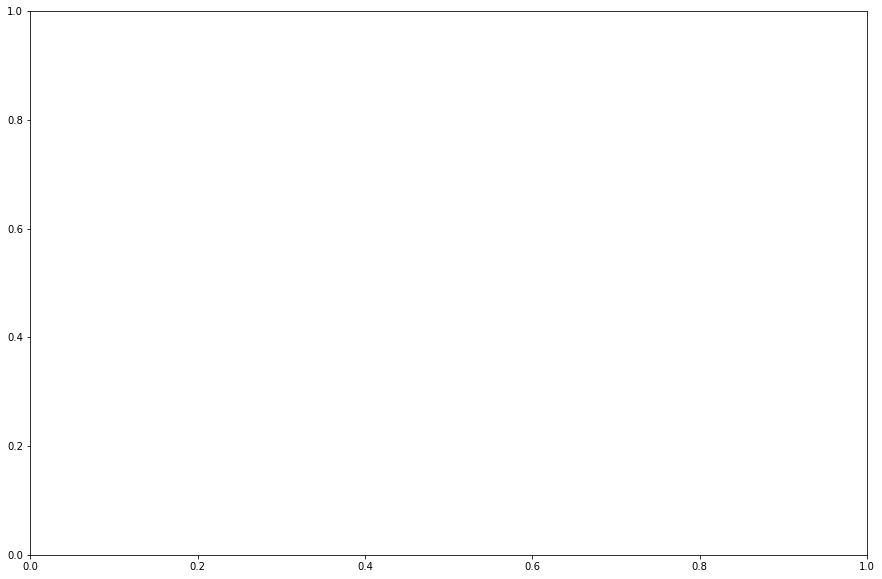

In [ ]:
for coluna in list_category:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result.sort_values(by=coluna)[coluna].dropna(), df_not_found.sort_values(by=coluna)[coluna].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {coluna}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

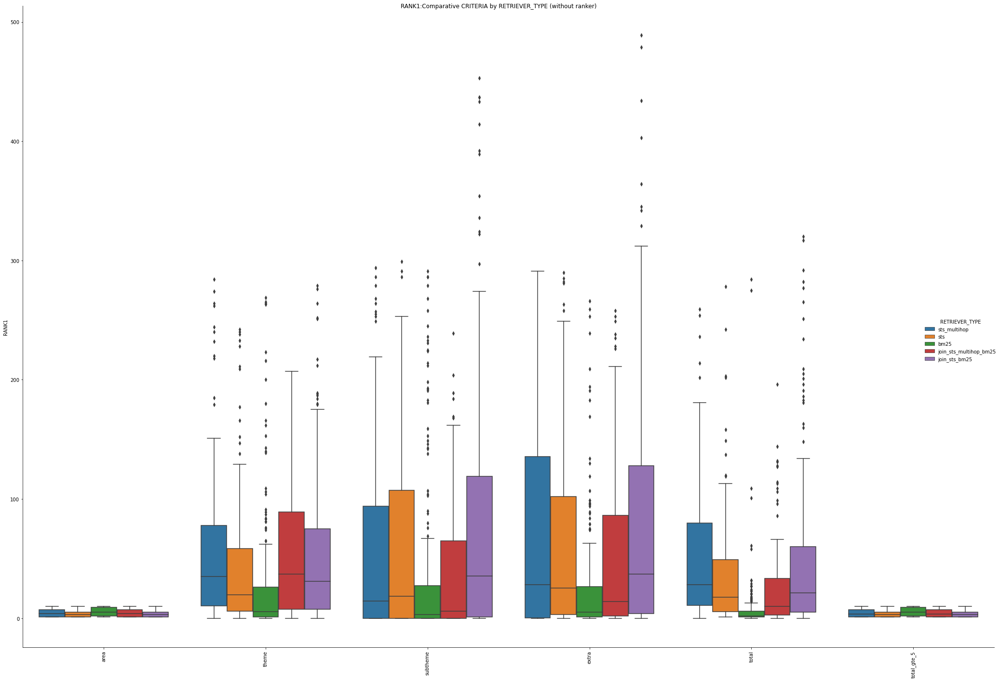

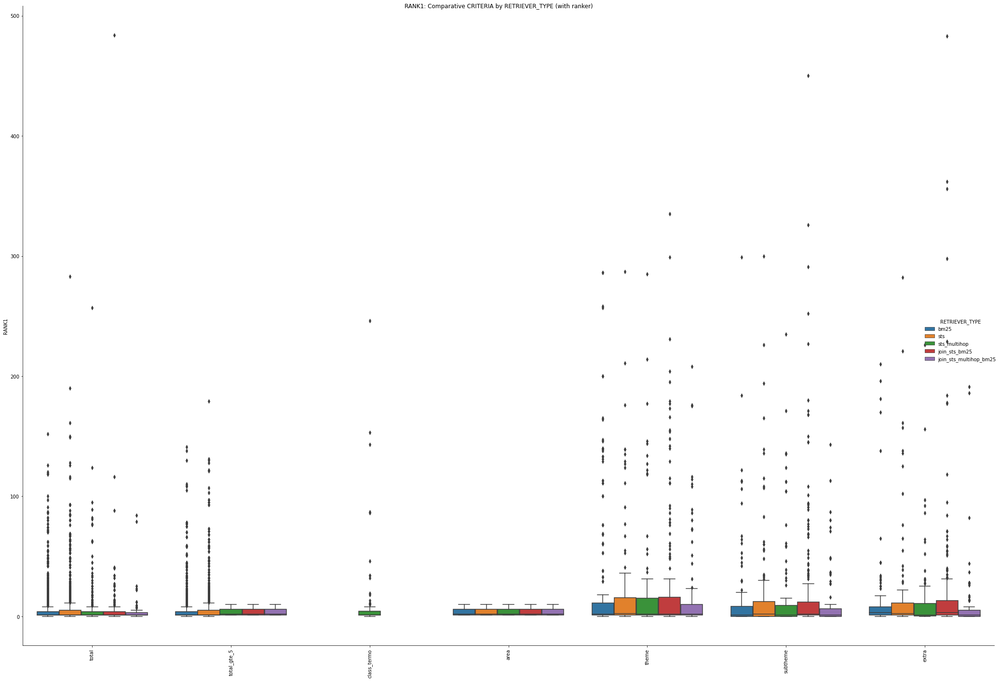

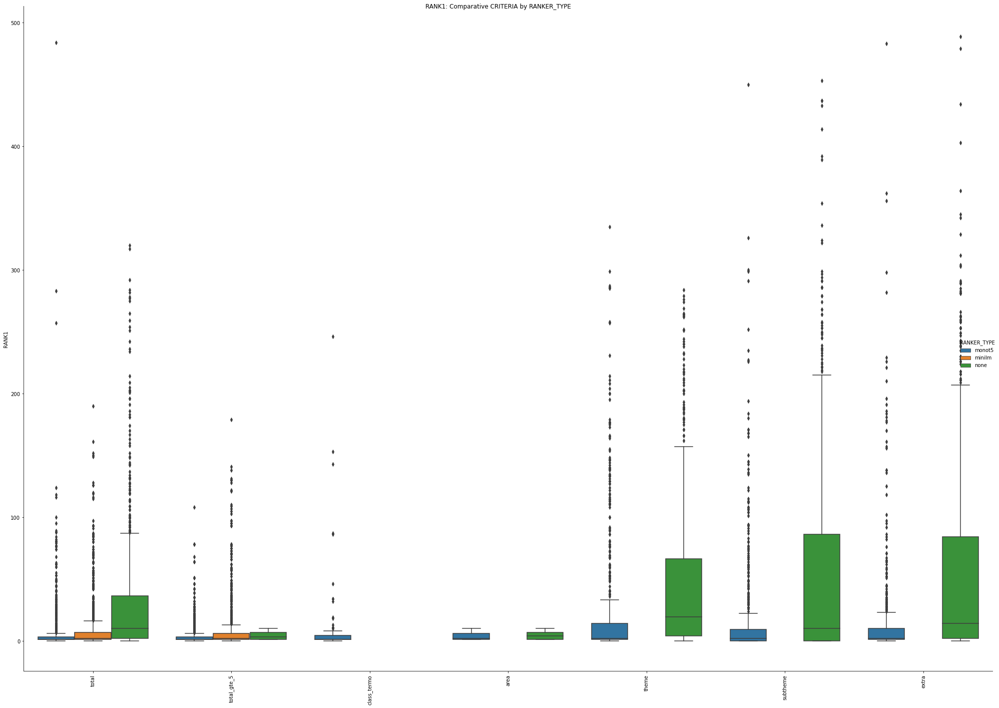

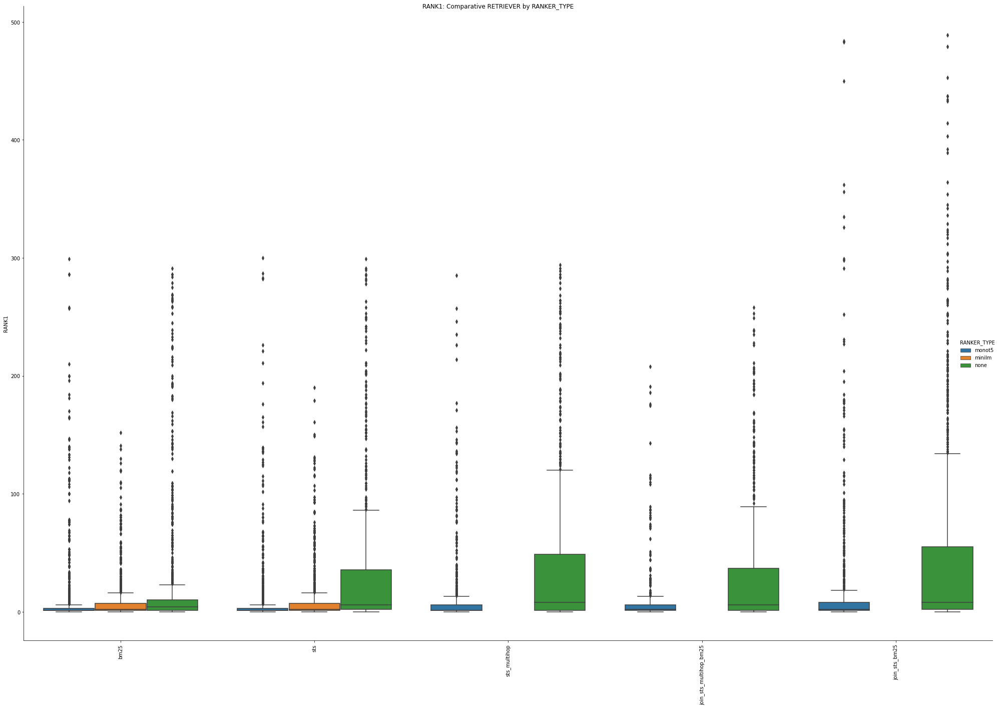

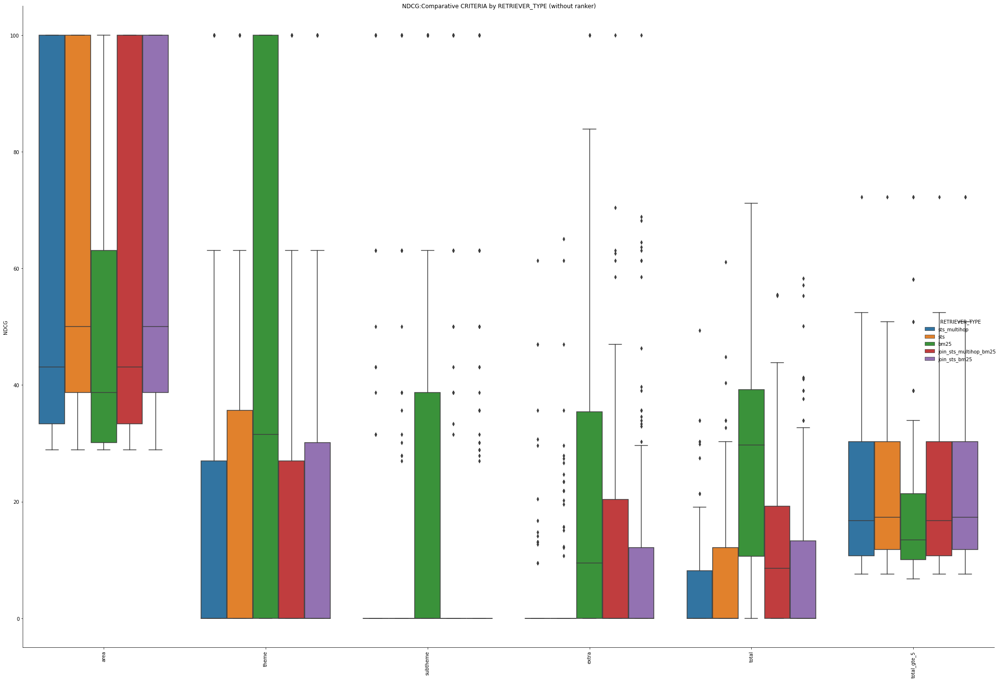

...

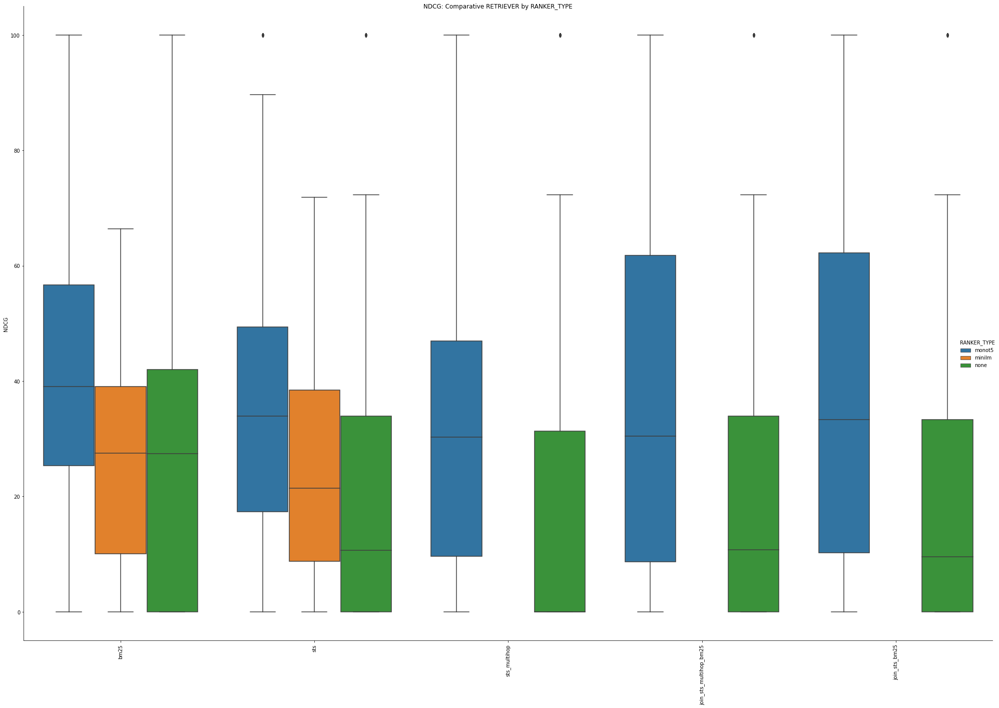

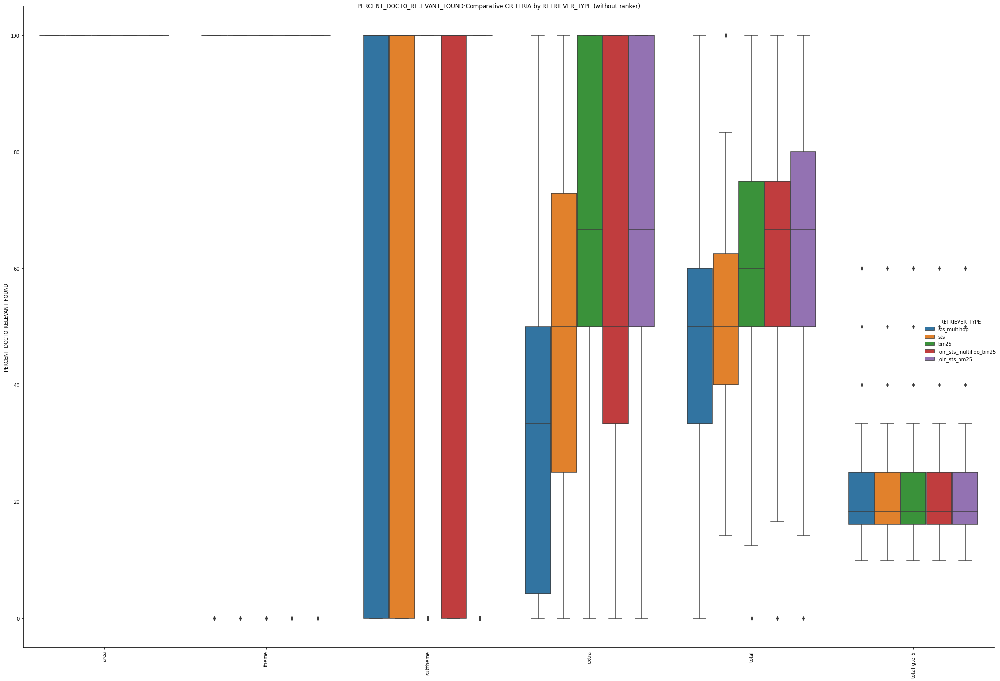

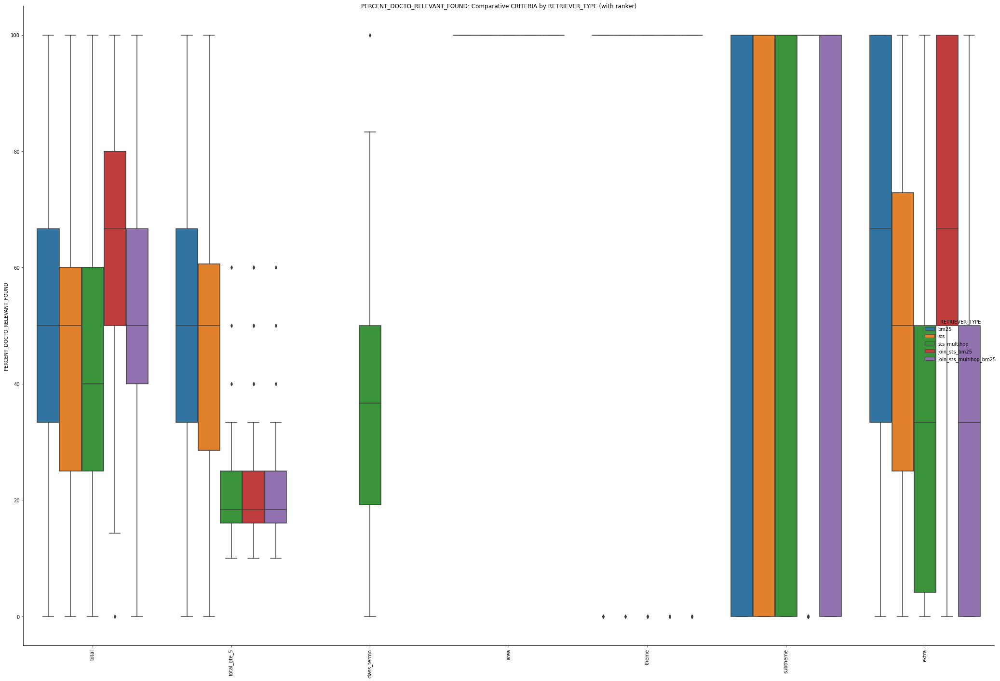

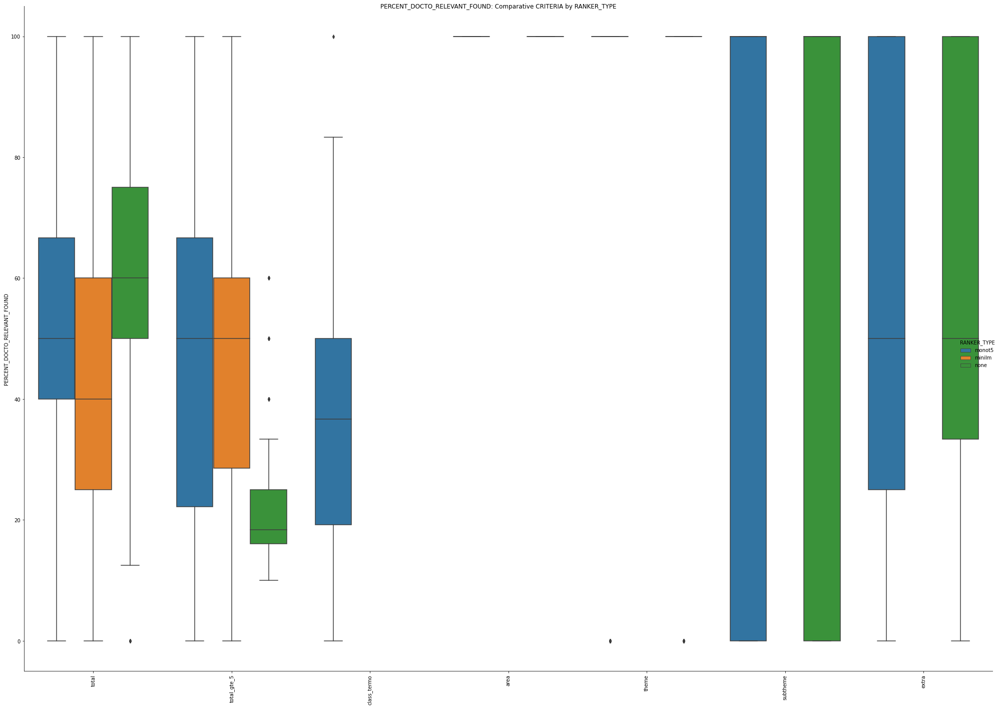

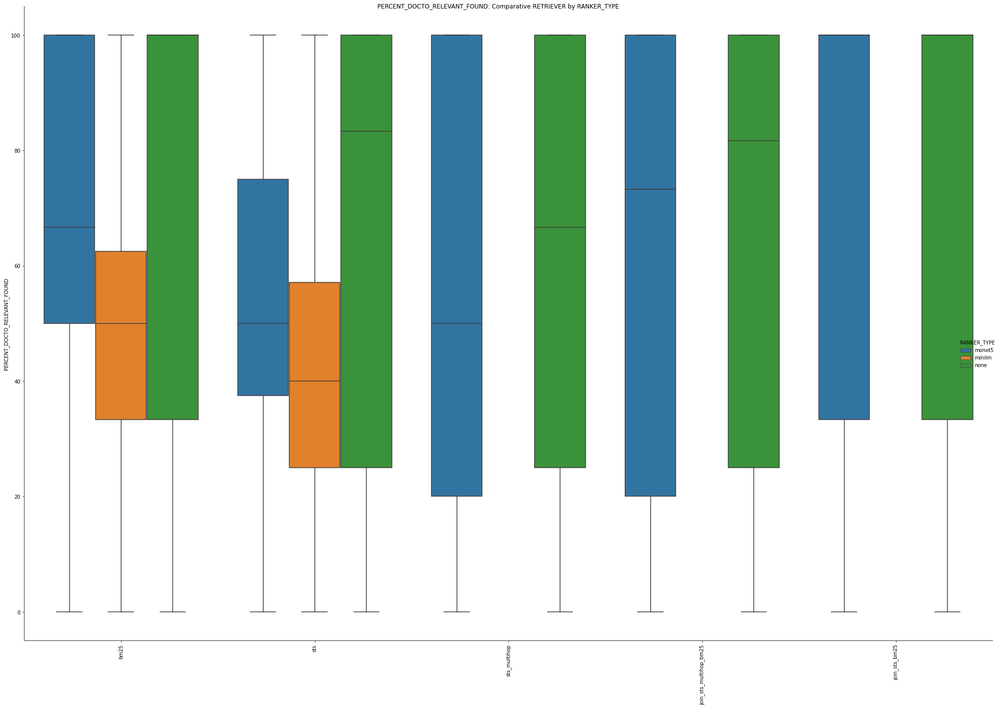

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER",
                    kind="box", data=df_result[df_result['RANKER']=='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}:Comparative CRITERIA by RETRIEVER (without ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RETRIEVER",
                    kind="box", data=df_result[df_result['RANKER']!='none'], height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RETRIEVER (with ranker)')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()    

    g = sns.catplot(x="CRITERIA", sharex=True, y=metric, hue="RANKER",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative CRITERIA by RANKER')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()      

    g = sns.catplot(x="RETRIEVER", sharex=True, y=metric, hue="RANKER",
                    kind="box", data=df_result, height=20, aspect=20/15) # row="CLASSE", 
    g.fig.suptitle(f'{metric}: Comparative RETRIEVER by RANKER')
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
    plt.show()        

        Conclusão:
        usar ranker
        join com bm25: 300 e sts:300  (topk_retriever=600)

## Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


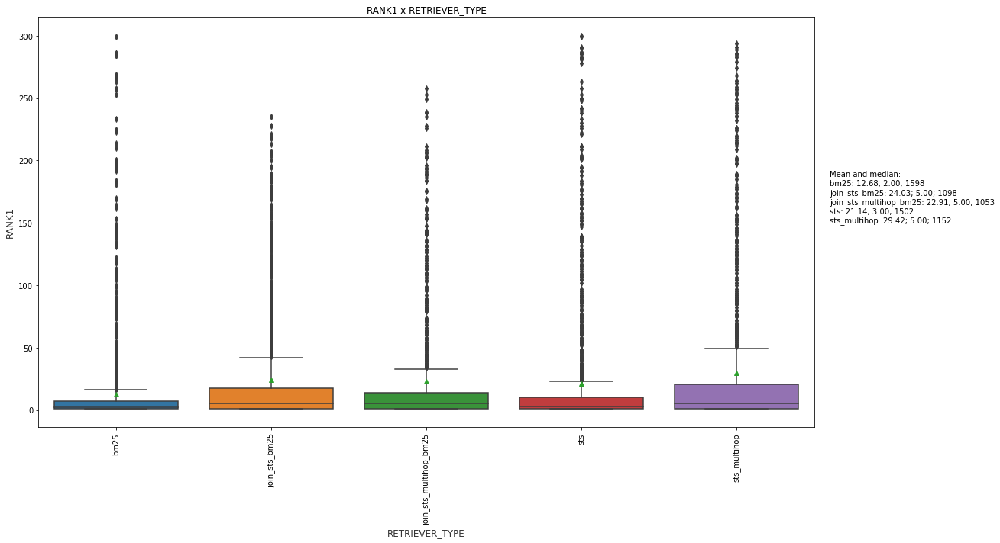

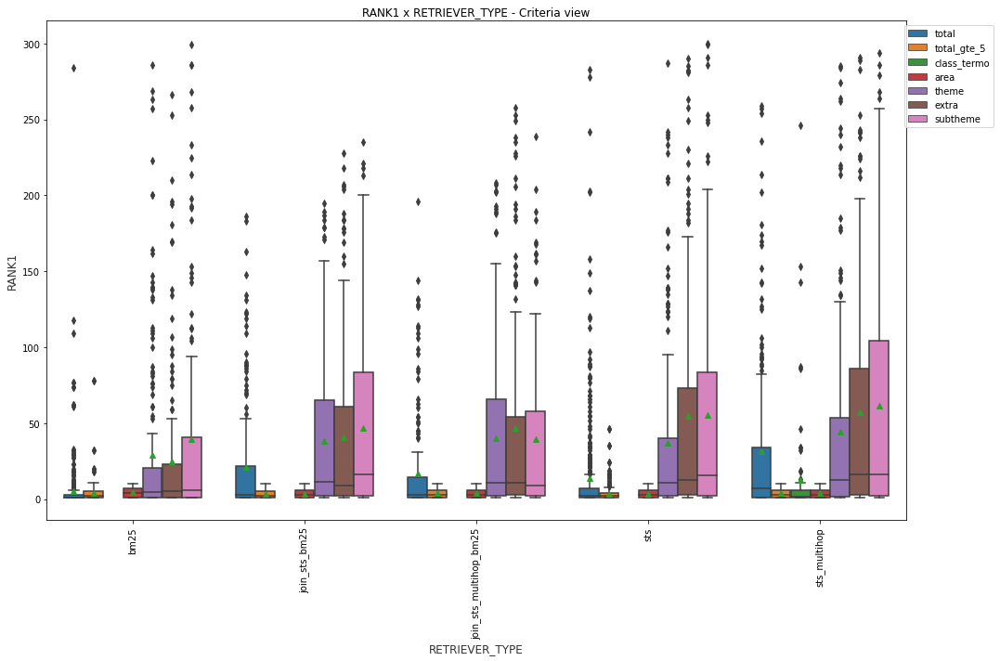

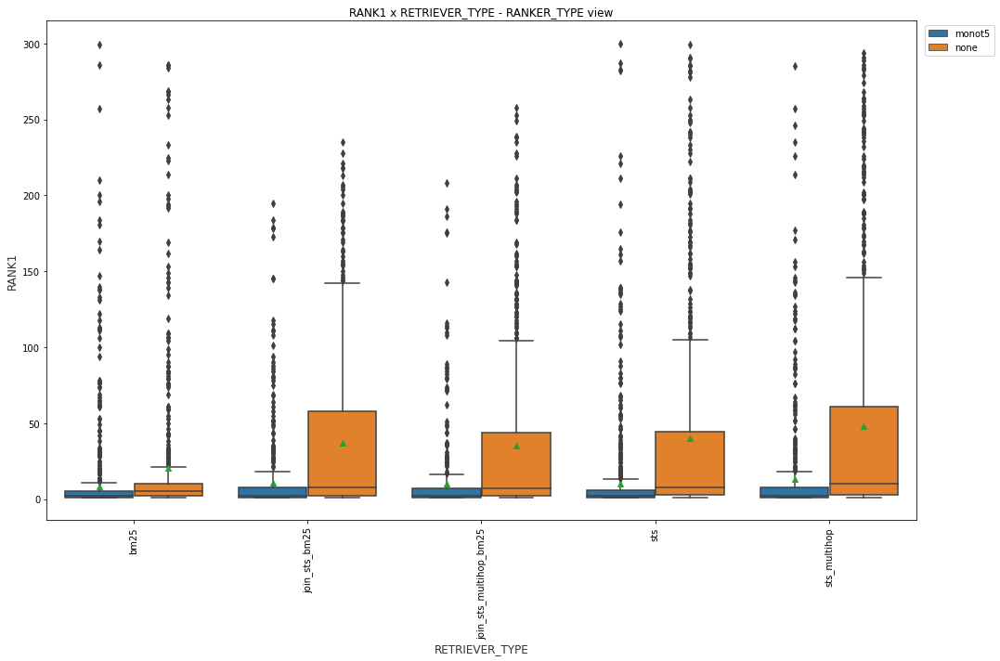

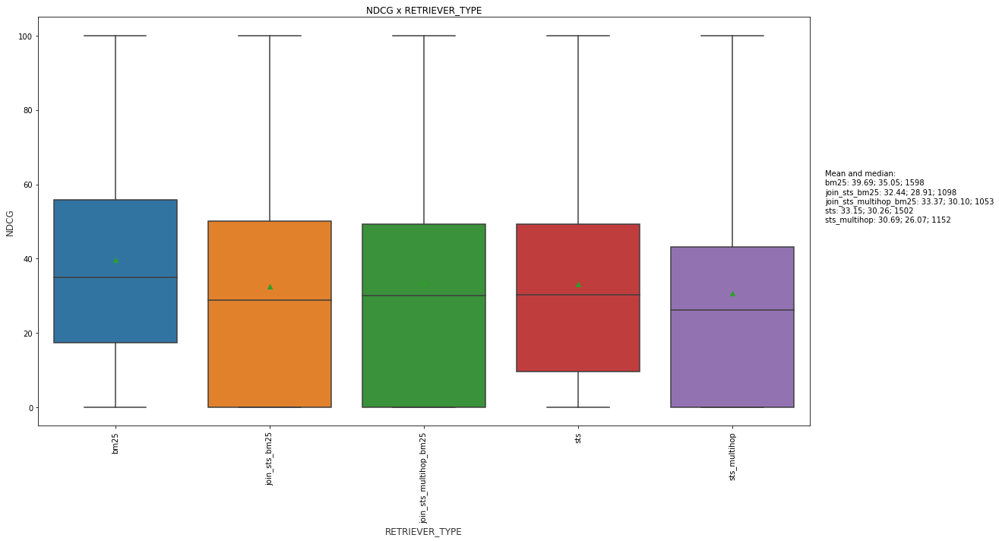

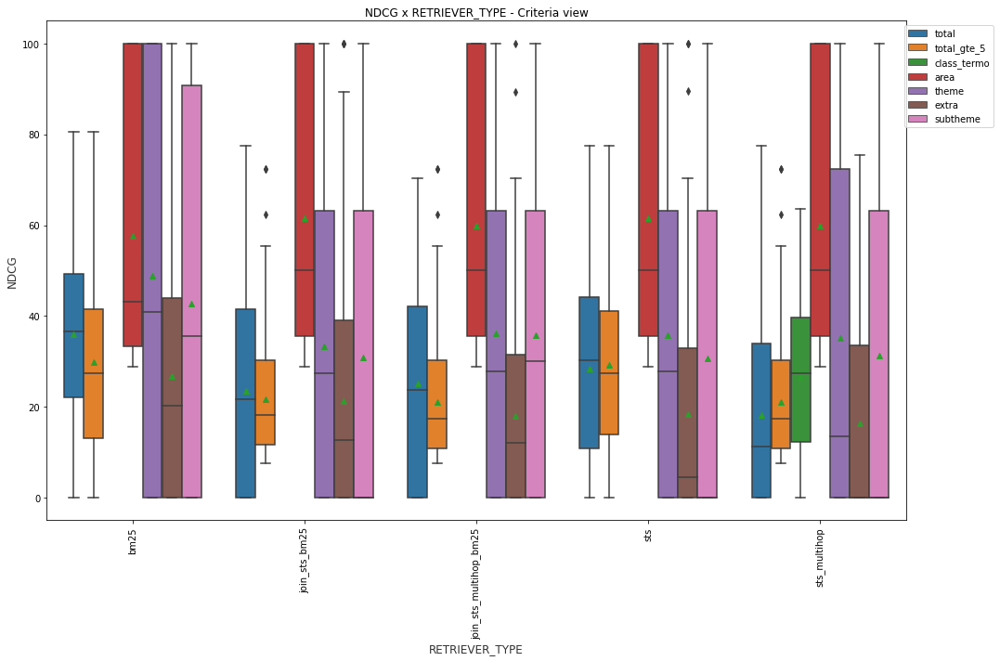

...

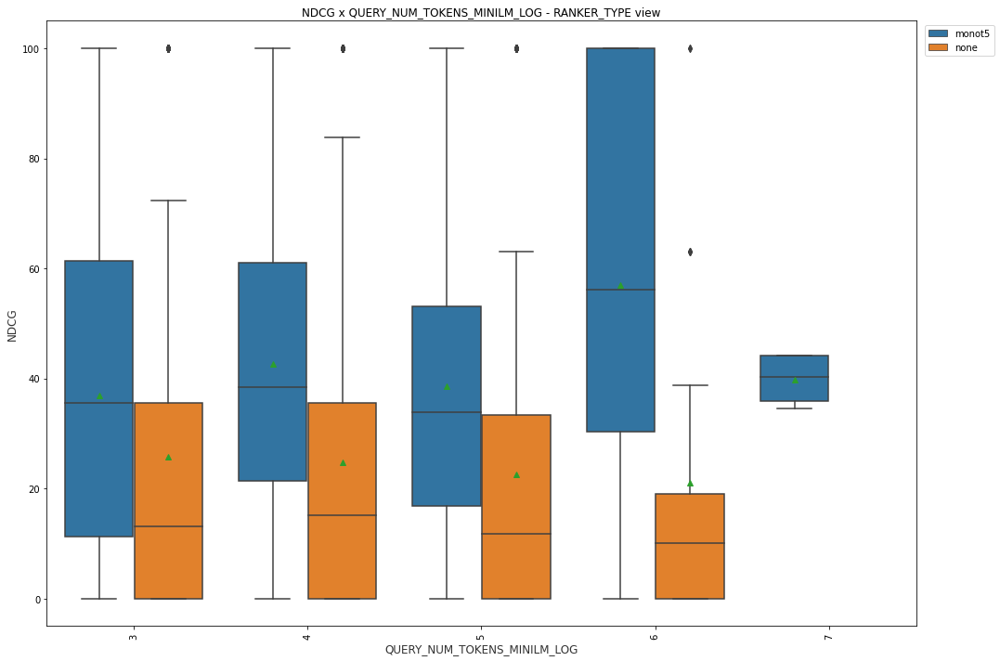

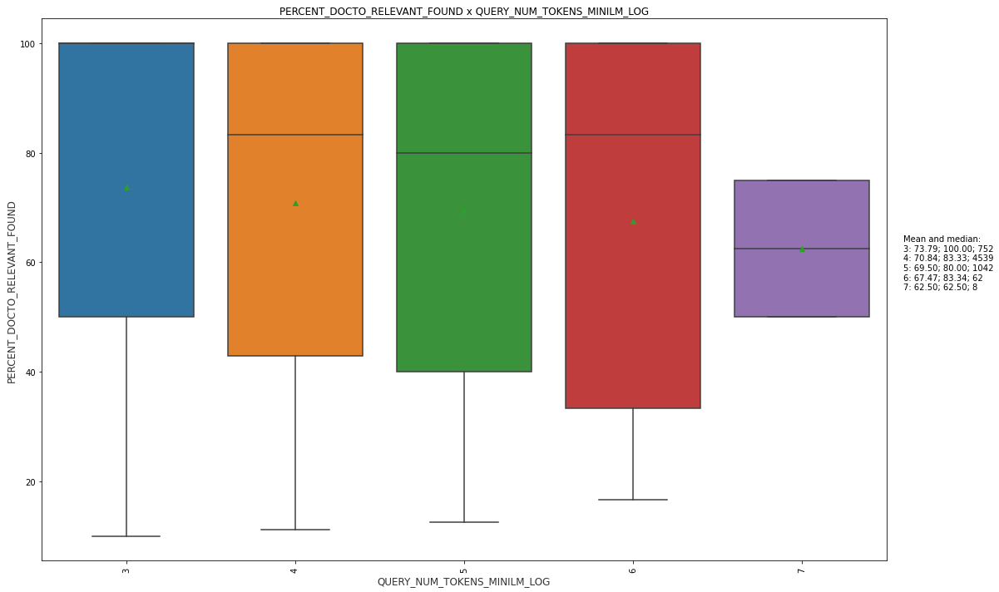

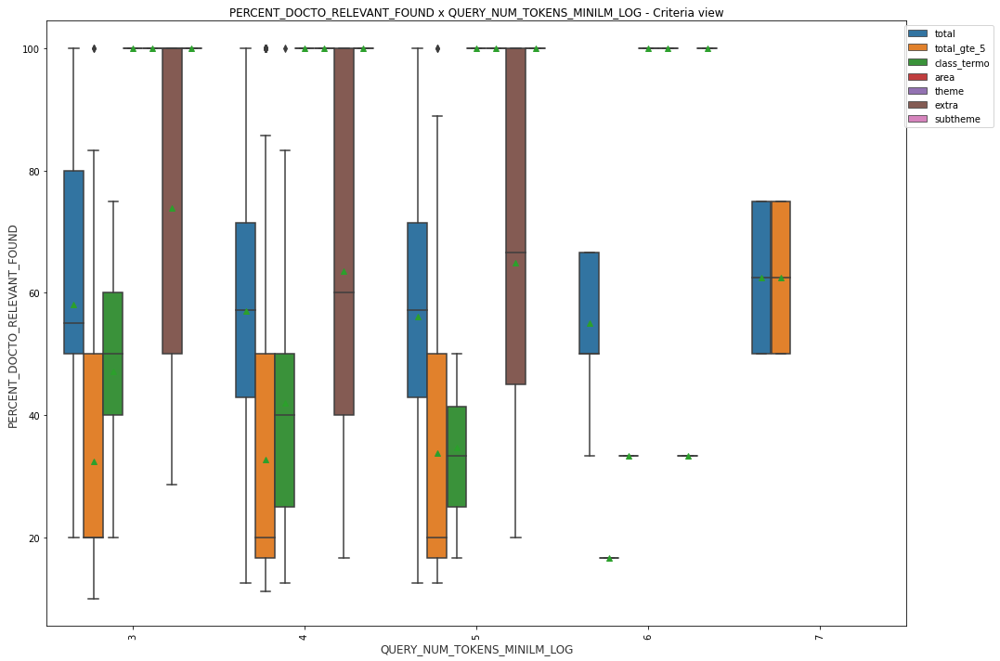

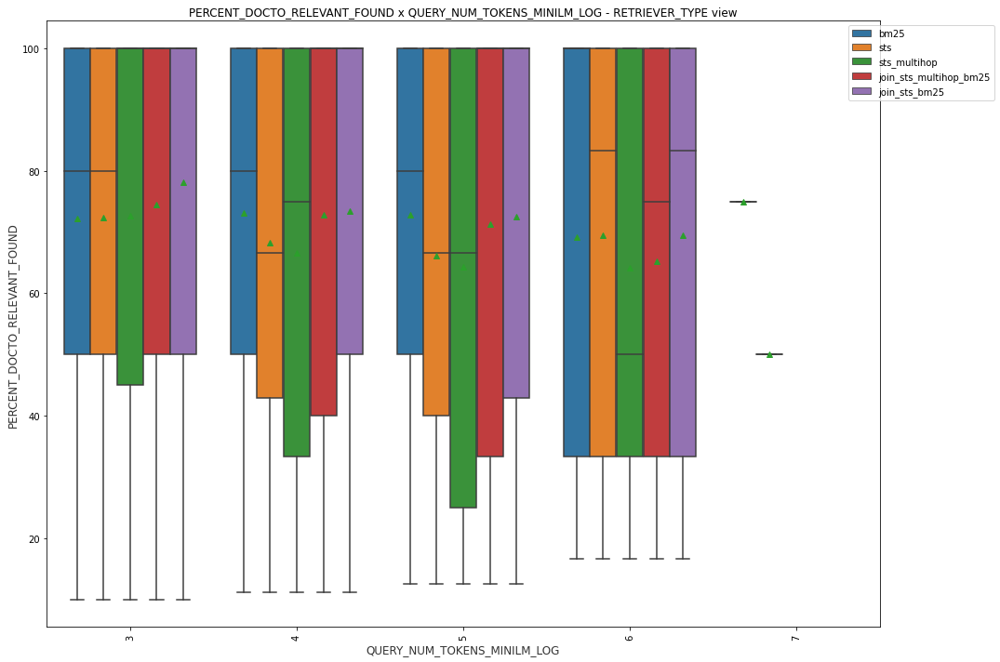

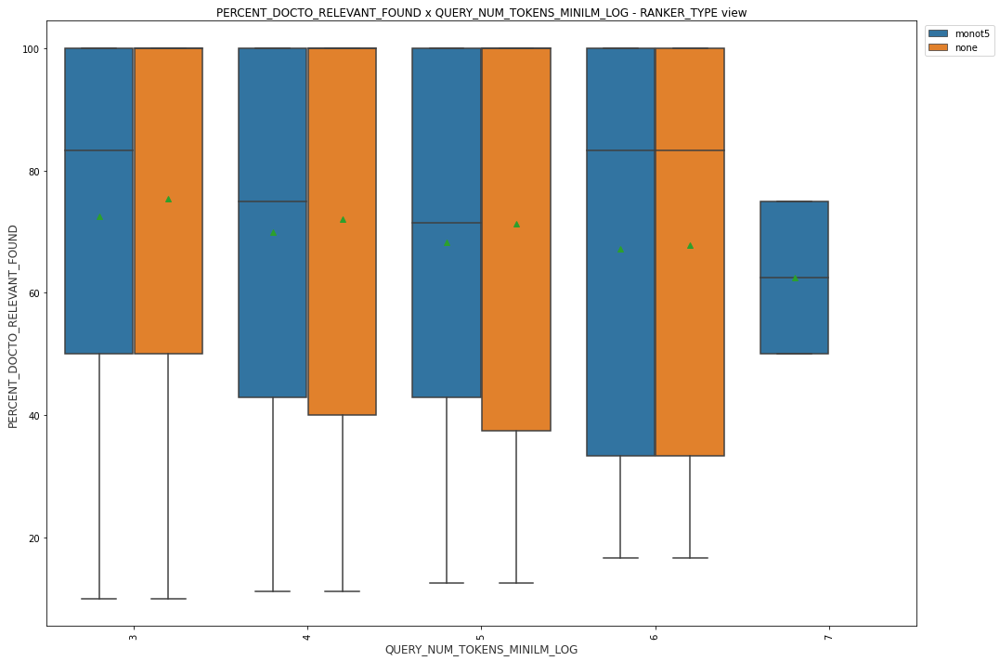

In [ ]:
for context in list_category: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result[context].unique())
        
        valores_unicos = sorted(df_result[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result.groupby(context)[metric].mean()
        mediana = df_result.groupby(context)[metric].median()
        count = df_result.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)

        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

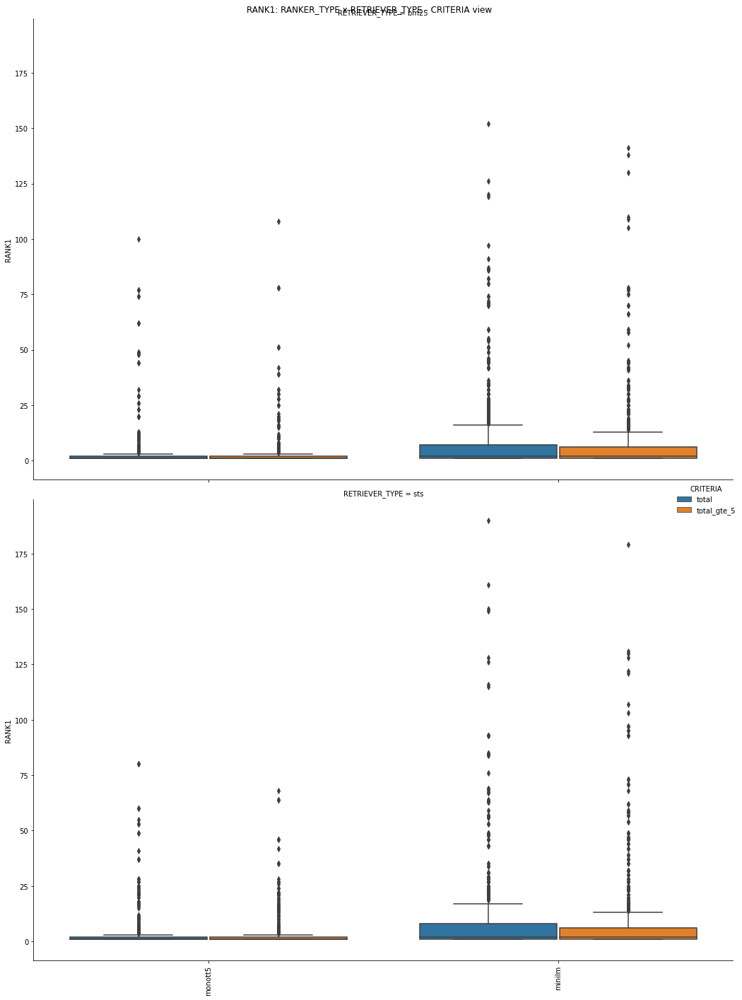

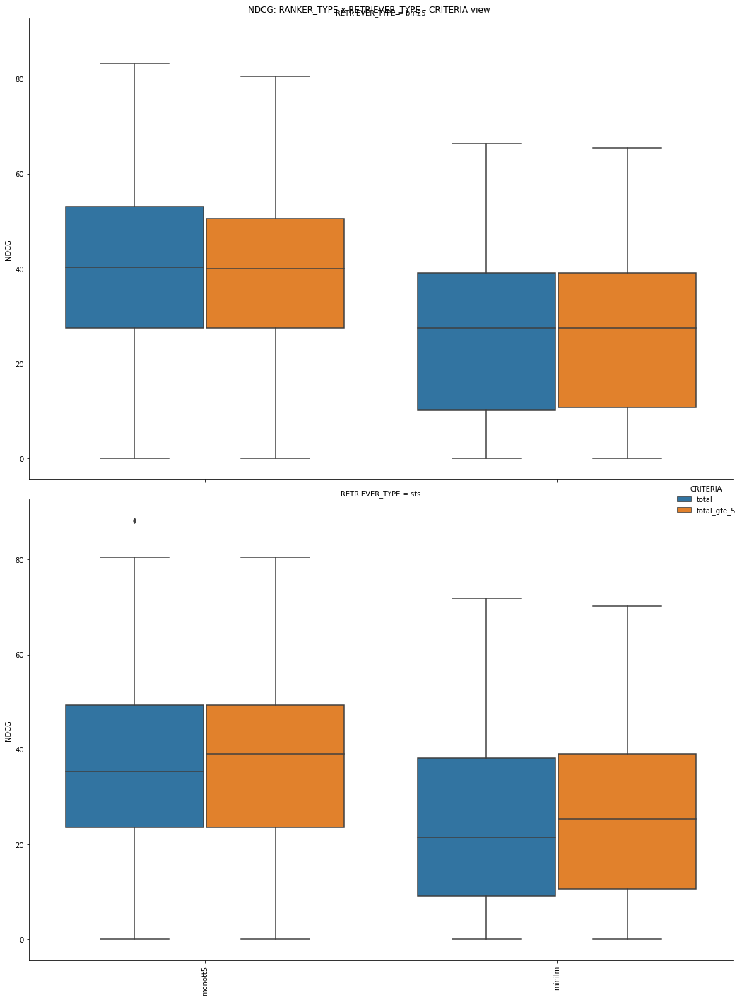

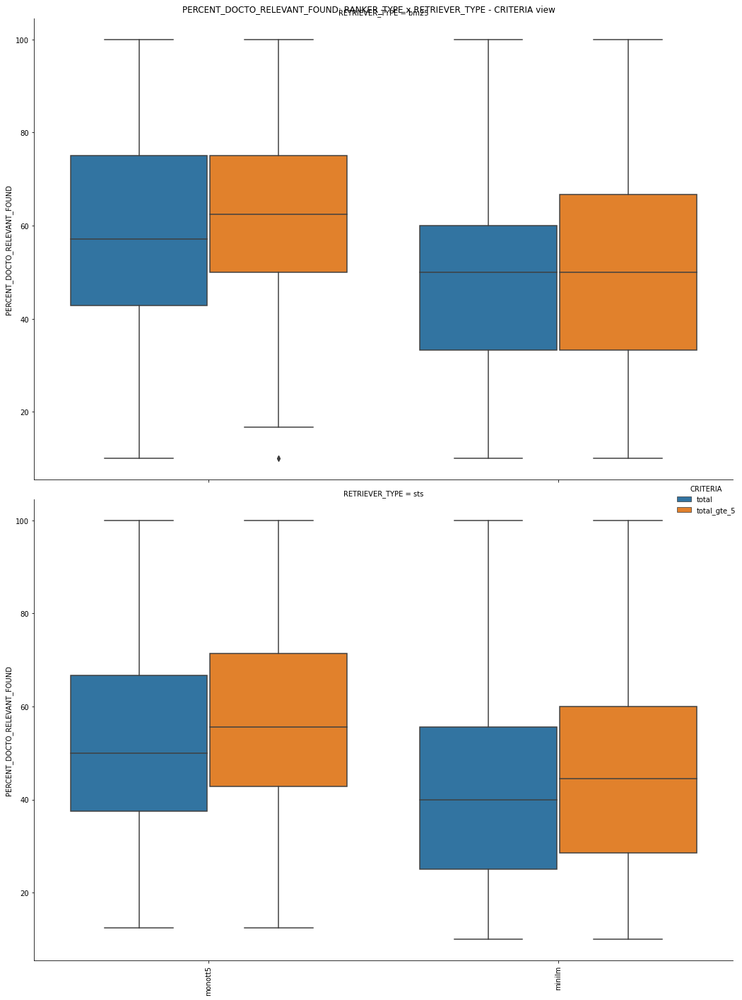

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="RANKER", sharex=True, y=metric, hue="CRITERIA", row="RETRIEVER", kind="box", data=df_result, height=10, aspect=20/15)
    g.fig.suptitle(f"{metric}: RANKER x RETRIEVER - CRITERIA view")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
plt.show()

## Correlation 

In [ ]:
df_result.corr()

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,COUNT_DOCTO_RELEVANT,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_DOC_ID,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
TIME_SPENT,1.000000,0.159931,-0.146162,0.580922,0.184871,NaN,NaN,NaN,-0.026999,-0.011806,0.064791,0.034253,0.060449,0.061807,0.055349,0.043293,0.043780,0.389722,0.028134
NDCG,0.159931,1.000000,-0.452010,-0.159675,-0.258837,NaN,NaN,NaN,-0.001094,0.025774,0.000209,-0.011625,-0.006890,-0.001482,-0.001213,0.013206,0.000477,-0.023892,0.352164
RANK1,-0.146162,-0.452010,1.000000,0.248445,-0.187978,NaN,NaN,NaN,0.025705,-0.009795,-0.004898,0.004572,-0.000016,0.000815,0.002740,-0.018822,-0.011398,-0.155879,0.094290
COUNT_DOCTO_FOUND,0.580922,-0.159675,0.248445,1.000000,0.071178,NaN,NaN,NaN,-0.012129,-0.014716,0.027160,0.002580,0.024173,0.025392,0.021577,0.011356,0.010655,0.420311,0.167541
COUNT_DOCTO_RELEVANT,0.184871,-0.258837,-0.187978,0.071178,1.000000,NaN,NaN,NaN,-0.020157,0.062279,0.057586,0.071628,0.051134,0.051997,0.047090,0.065059,0.066102,0.629644,-0.768036
TOPK_RETRIEVER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TOPK_RANKER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
QUERY_ID,-0.026999,-0.001094,0.025705,-0.012129,-0.020157,NaN,NaN,NaN,1.000000,0.000437,0.101806,0.106190,0.094546,0.092643,0.107483,0.179507,0.064543,-0.040700,-0.003191
QUERY_DOC_ID,-0.011806,0.025774,-0.009795,-0.014716,0.062279,NaN,NaN,NaN,0.000437,1.000000,0.054117,0.049030,0.046645,0.063167,0.061839,0.109567,0.107423,-0.024836,-0.060220


## Distribution of values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


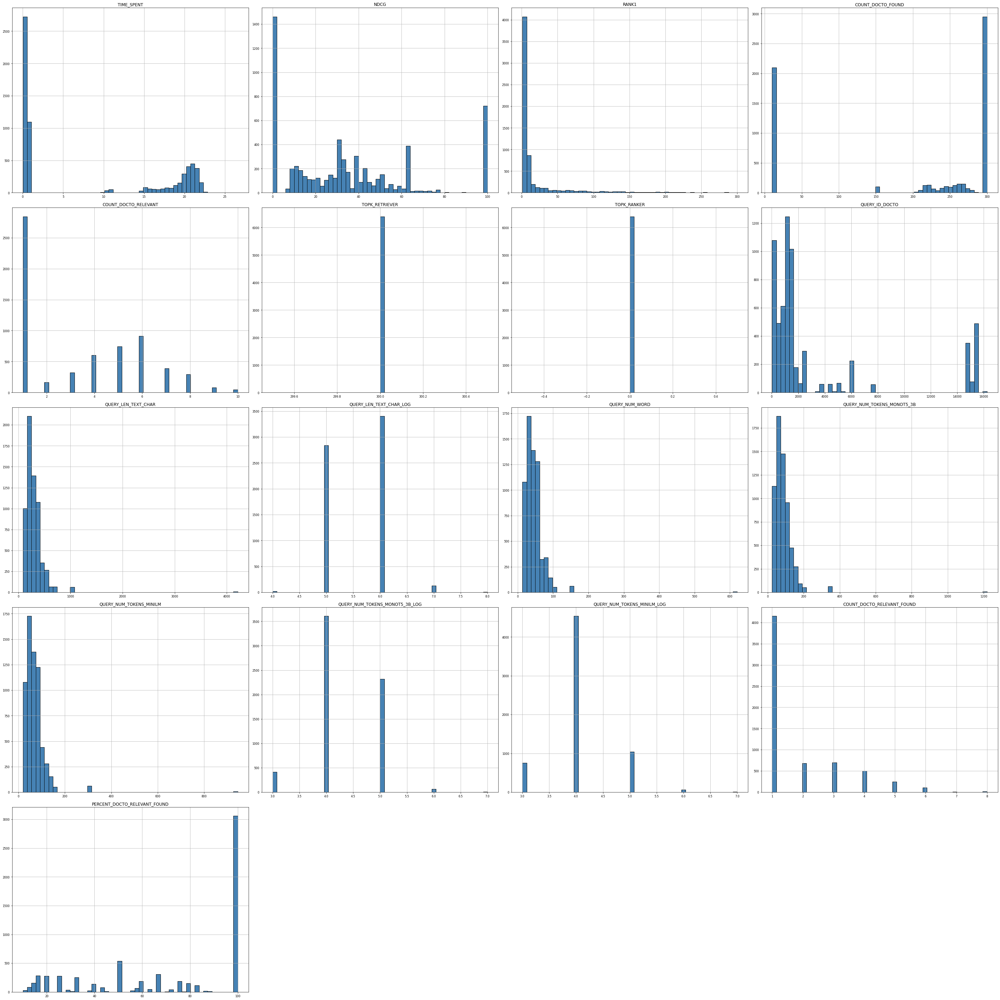

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(40,40))
ax.set_title('Histogram')
df_result.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=50, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout()   

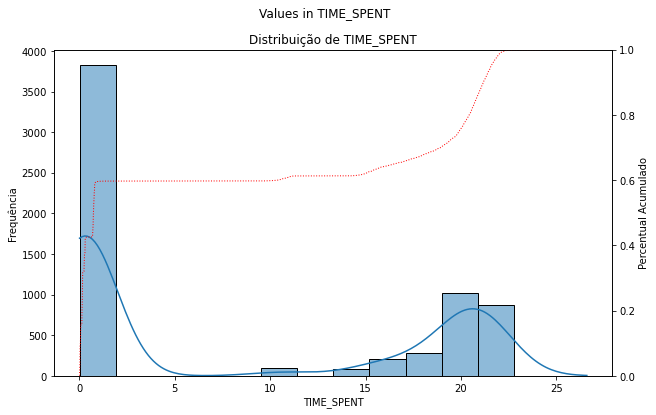

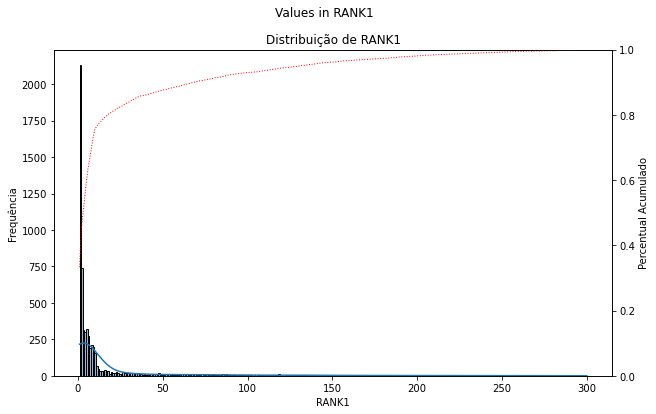

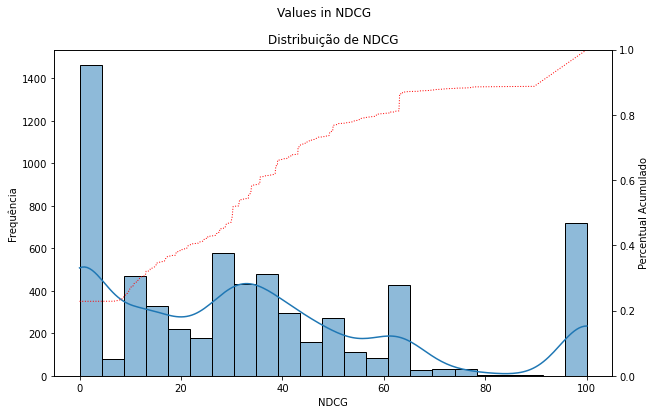

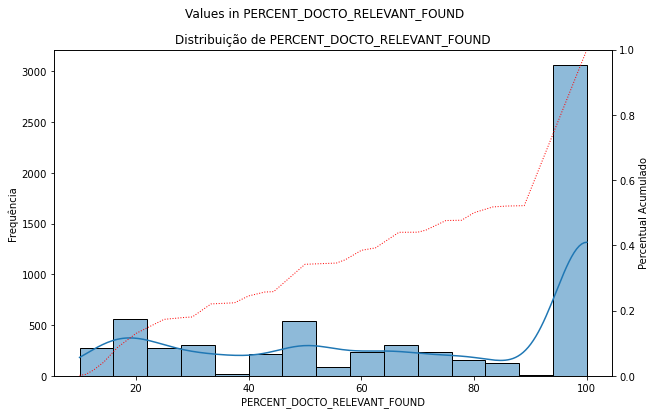

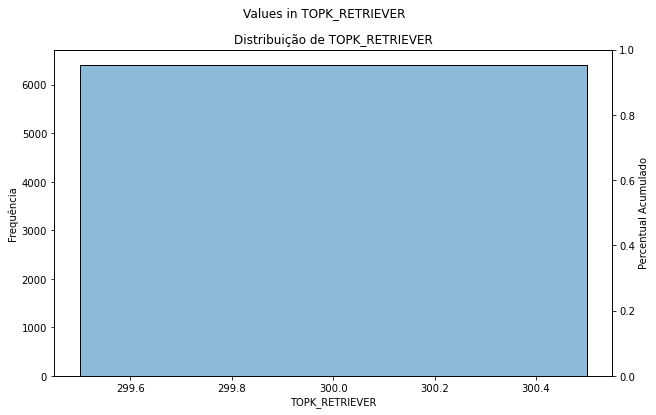

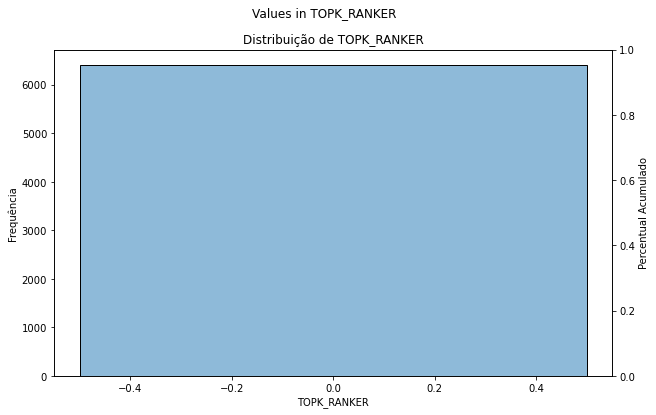

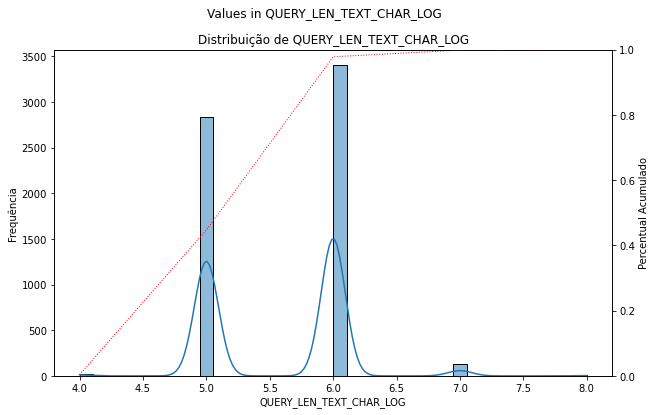

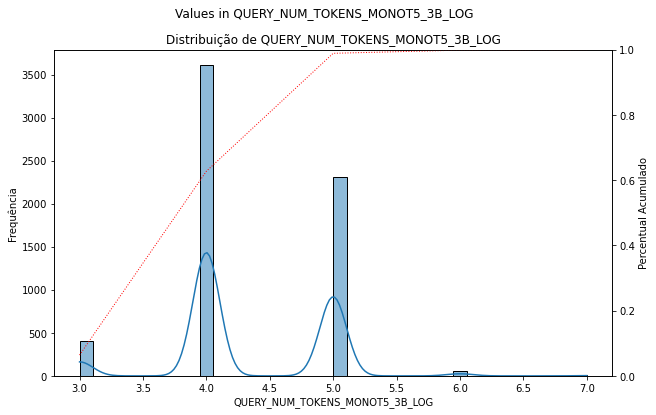

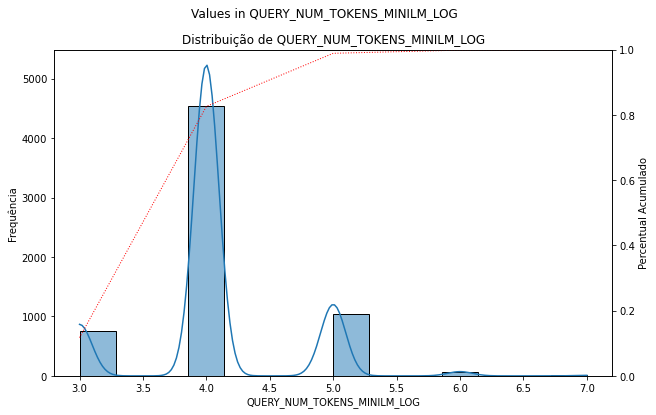

In [ ]:
for column in ['TIME_SPENT'] + list_metric + list_category:
    if df_result[column].dtype != object:
        f, ax = plt.subplots(1, 1, figsize=(10,6))
        f.suptitle(f'Values in {column}')    
        # Plot o histograma normalizado com KDE
        sns.histplot(data=df_result[column], kde=True, ax=ax, linewidth=1)

        # Calcula o percentual acumulado
        cumulative = df_result[column].value_counts(normalize=True).sort_index().cumsum()

        # Cria um novo eixo y com o percentual acumulado
        ax2 = ax.twinx()
        ax2.plot(cumulative.index, cumulative.values, linestyle='dotted', marker='', color='red', linewidth=1)
        ax2.set_ylim([0, 1])
        ax2.set_ylabel('Percentual Acumulado')

        # Configurações do gráfico
        ax.set_title(f'Distribuição de {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequência')
# Exibe o gráfico
plt.show()

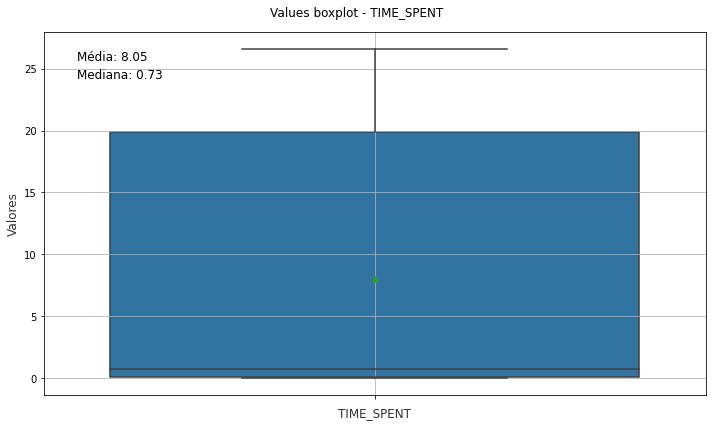

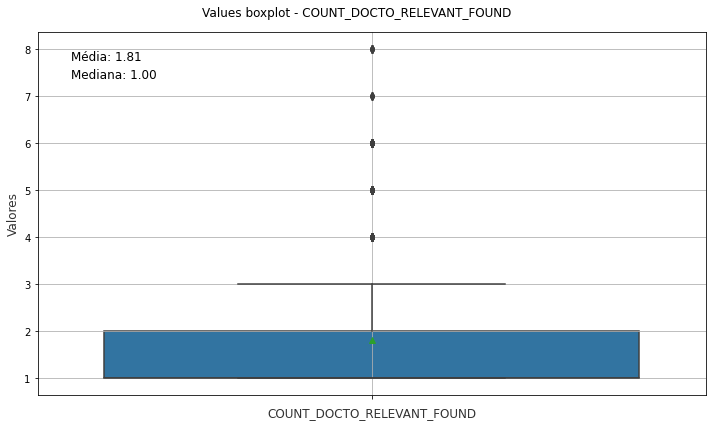

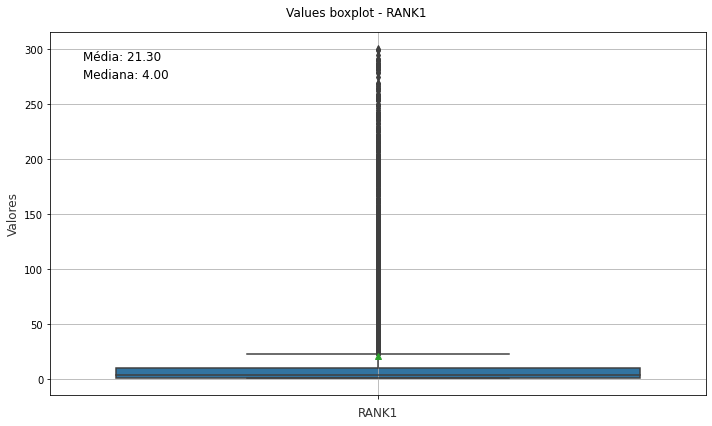

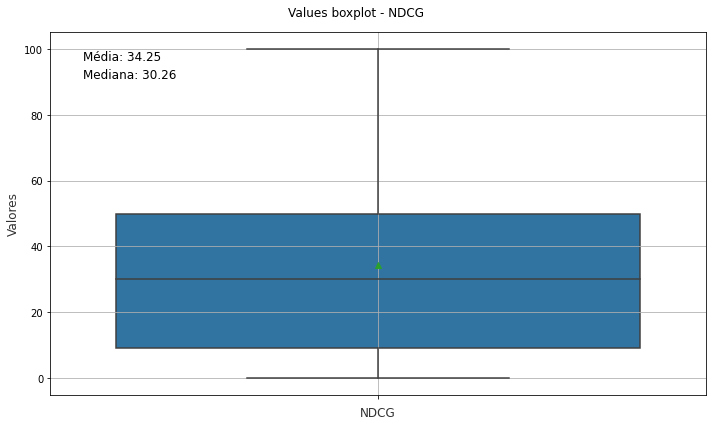

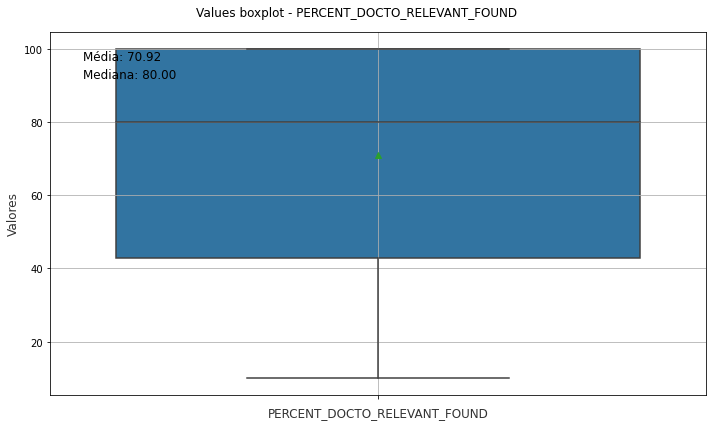

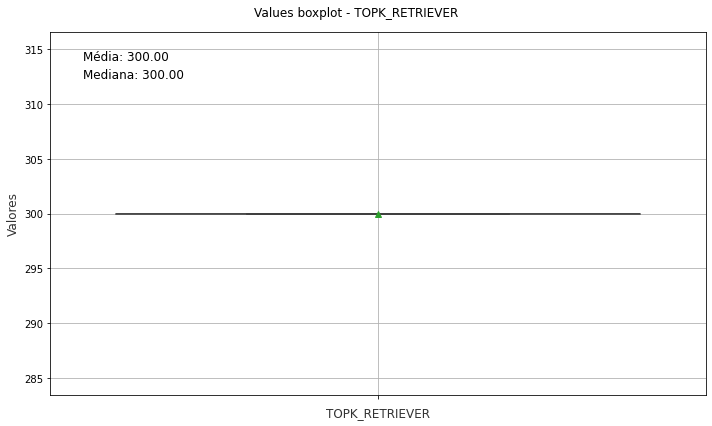

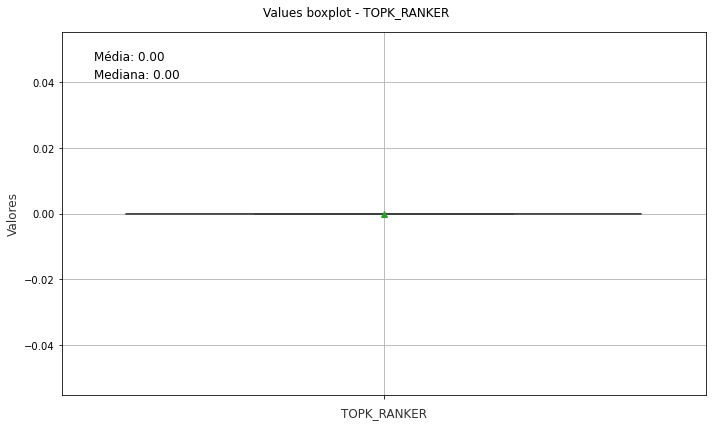

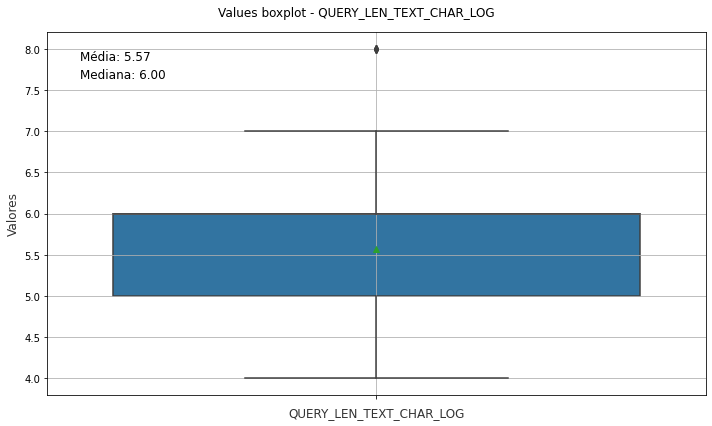

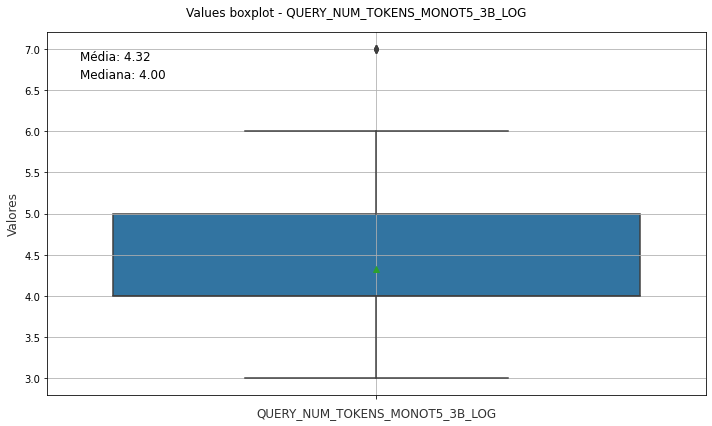

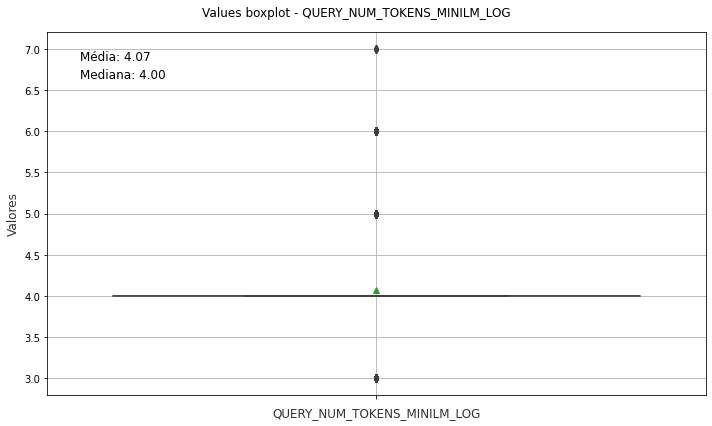

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_result[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Values boxplot - {column}')
    ax = sns.boxplot(y=column, data=df_result, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_result, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_result[column].mean(), 3)
    median_val = df_result[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_result['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

## Best ndcg evaluation

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [ ]:
df_result.sort_values(by='NDCG', ascending=False).head(10)

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,CRITERIA,RETRIEVER_MODEL_NAME,RANKER_MODEL_NAME,QUERY_ID,QUERY_RELEVANCE_DICT_ID_DOC,QUERY_RELEVANCE_DICT_TYPE,QUERY_PARADIGMATIC,QUERY_AREA_NAME,QUERY_DOC_ID,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
9117,0.6998,100.0,1,10,[1],1,{342: 'AREA'},"[342, 5095, 331, 775, 629, 932, 15273, 414, 52...",bm25,300,0.0,12,area,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,15470,"{342: 'AREA', 631: 'INDEXACAO_EXTRA', 2553: 'T...","{'AREA': [342], 'INDEXACAO_EXTRA': [631], 'TEM...",NaN,Convênio,342,266,6,45,71,57,4,4,1,100.0,monot5
9695,0.0242,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 414, 331, 932, 342, 775, 5288, 152...",sts,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
9738,0.7222,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",join_sts_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
12560,20.6935,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 169, 724, 1451, 722, 617, 23, 435,...",sts_multihop,300,0.0,12,theme,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,monot5
9727,0.0308,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 414, 331, 932, 342, 775, 5288, 152...",join_sts_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
9726,0.0657,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 932, 331, 414, 1131, 342, 775, 528...",join_sts_multihop_bm25,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,NaN,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,none
12569,0.1282,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 506, 295, 1451, 722, 1480, 1100217...",bm25,300,0.0,12,theme,NaN,NaN,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,none
9713,0.7174,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",sts,300,0.0,12,area,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
9712,0.6927,100.0,1,10,[1],1,{5095: 'AREA'},"[5095, 629, 1131, 775, 331, 15273, 932, 342, 4...",bm25,300,0.0,12,area,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,37176,"{1340: 'INDEXACAO_EXTRA', 4070: 'TEMA', 5095: ...","{'INDEXACAO_EXTRA': [1340, 15266, 1478], 'TEMA...",NaN,Competência do TCU,1340,324,6,51,91,72,5,4,1,100.0,monot5
12584,19.9793,100.0,1,300,[1],1,{41: 'TEMA'},"[41, 14871, 169, 724, 1451, 722, 617, 23, 435,...",bm25,300,0.0,12,theme,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,38436,"{41: 'TEMA', 3213: 'SUBTEMA', 4070: 'INDEXACAO...","{'TEMA': [41], 'SUBTEMA': [3213], 'INDEXACAO_E...",NaN,Pessoal,41,195,5,30,52,44,4,4,1,100.0,monot5


In [ ]:
df_top = df_result[df_result['NDCG'] >= 60].sort_values(by='NDCG', ascending=False)
df_top.shape

(1257, 31)

### Distribution of Values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


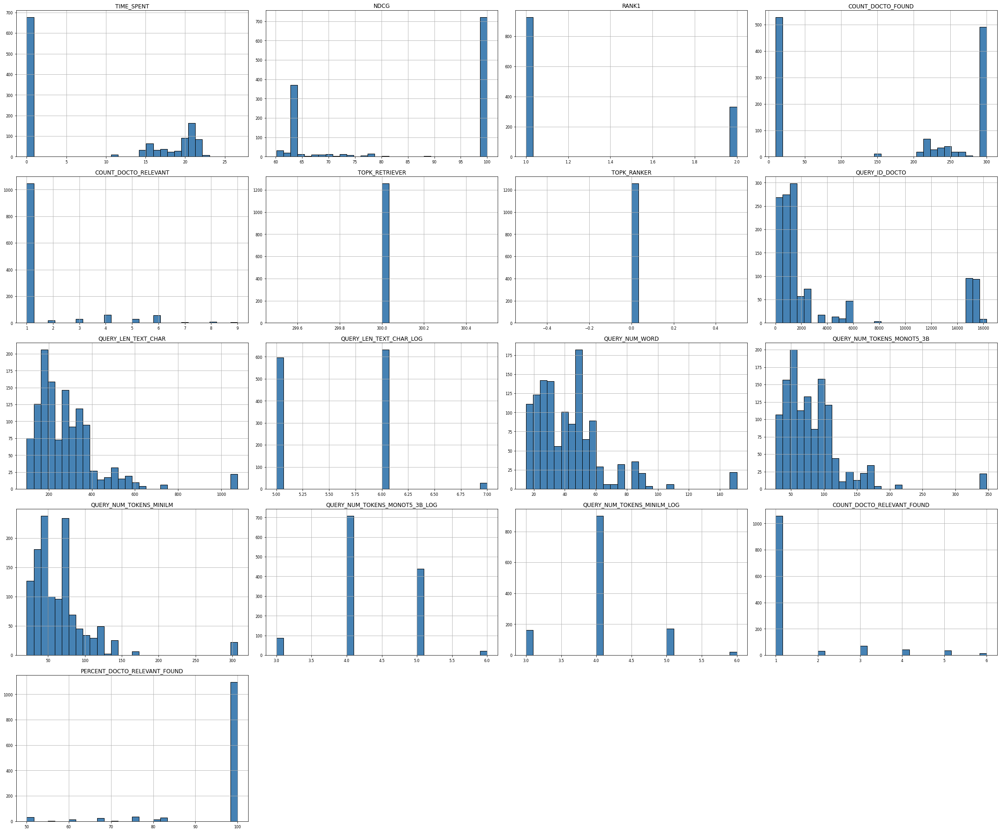

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(30,25))
ax.set_title('Histogram')
df_top.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=30, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout() 

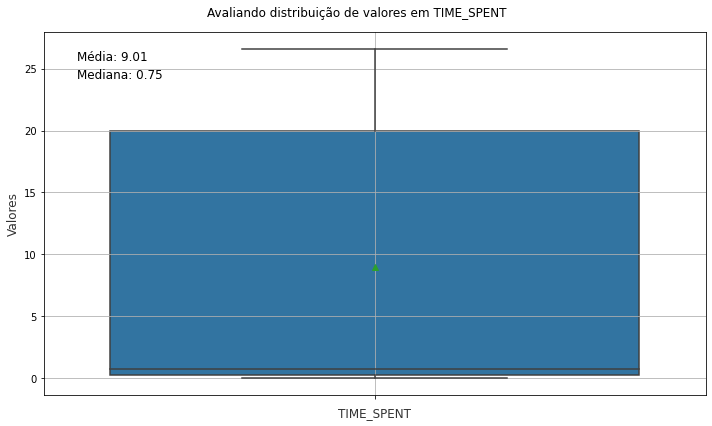

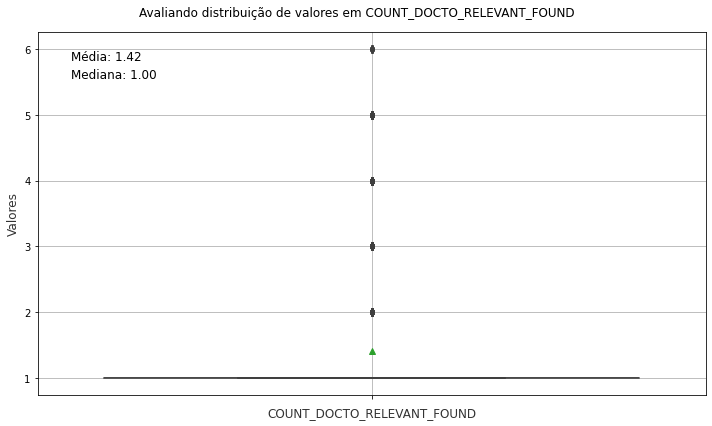

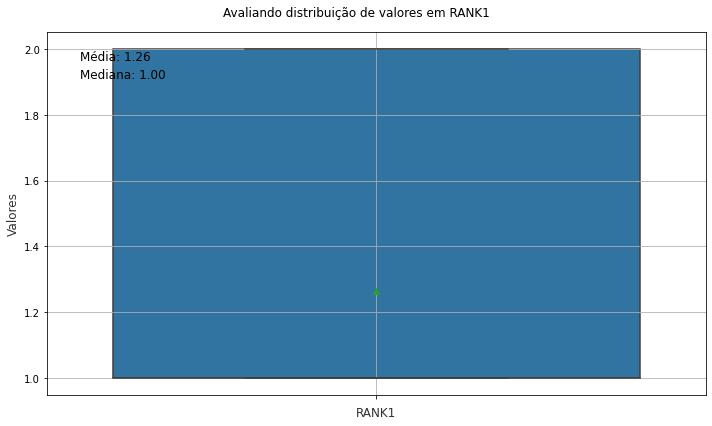

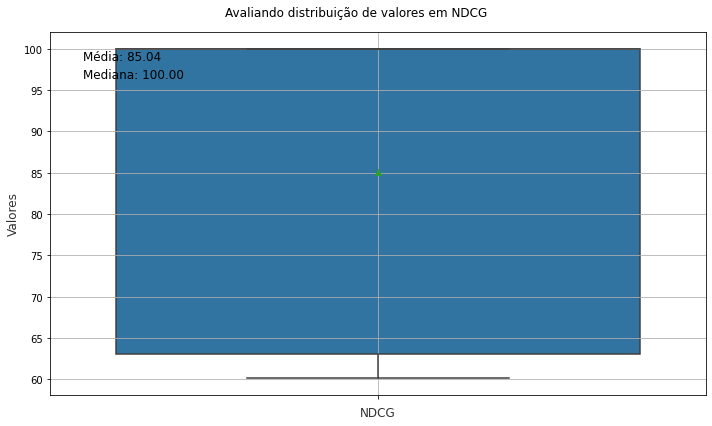

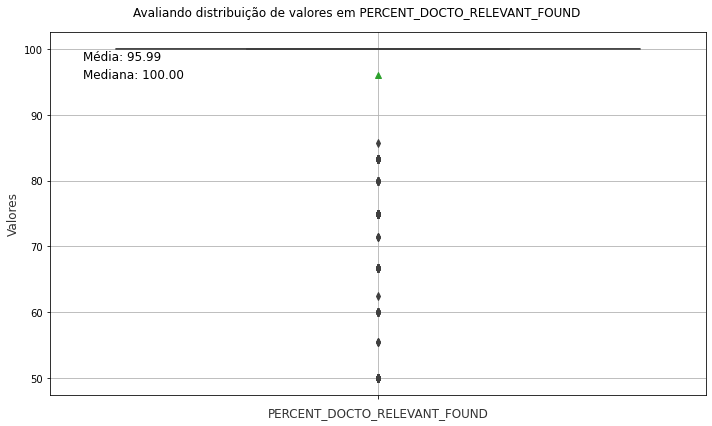

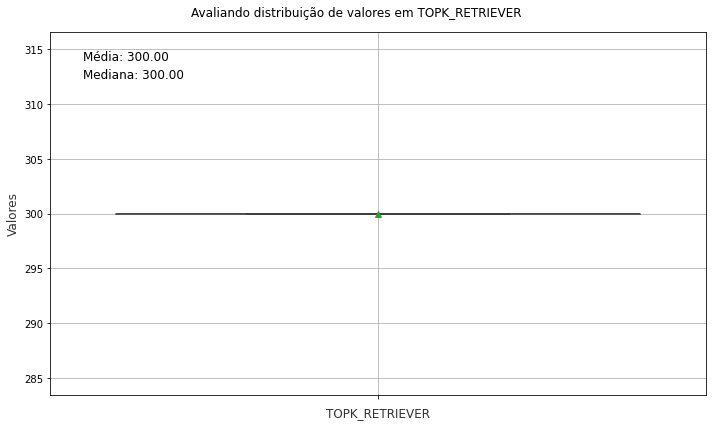

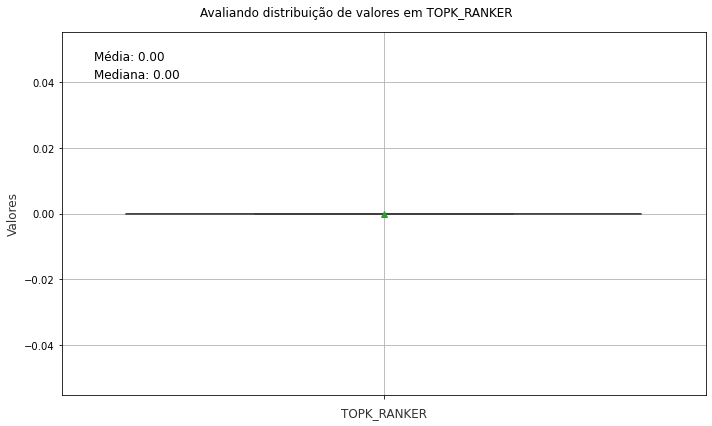

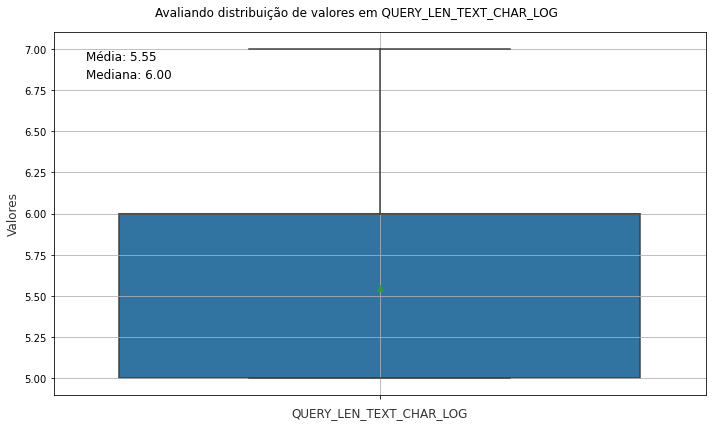

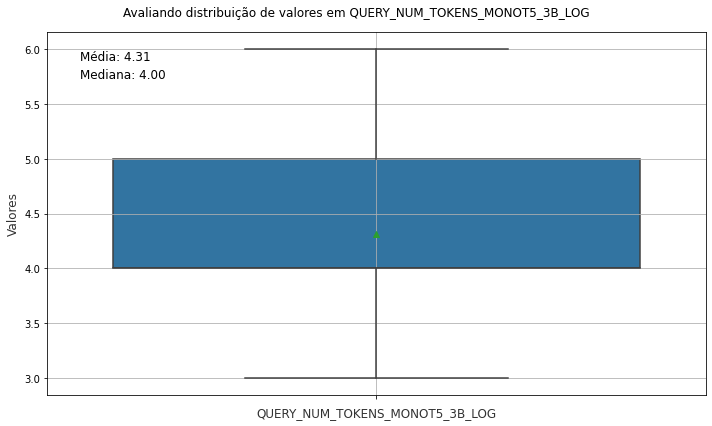

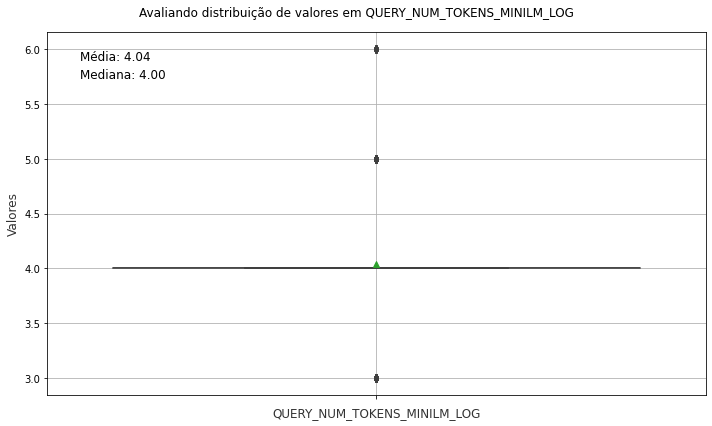

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_top[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Avaliando distribuição de valores em {column}')
    ax = sns.boxplot(y=column, data=df_top, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_top, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_top[column].mean(), 3)
    median_val = df_top[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_top['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

### Category evaluation

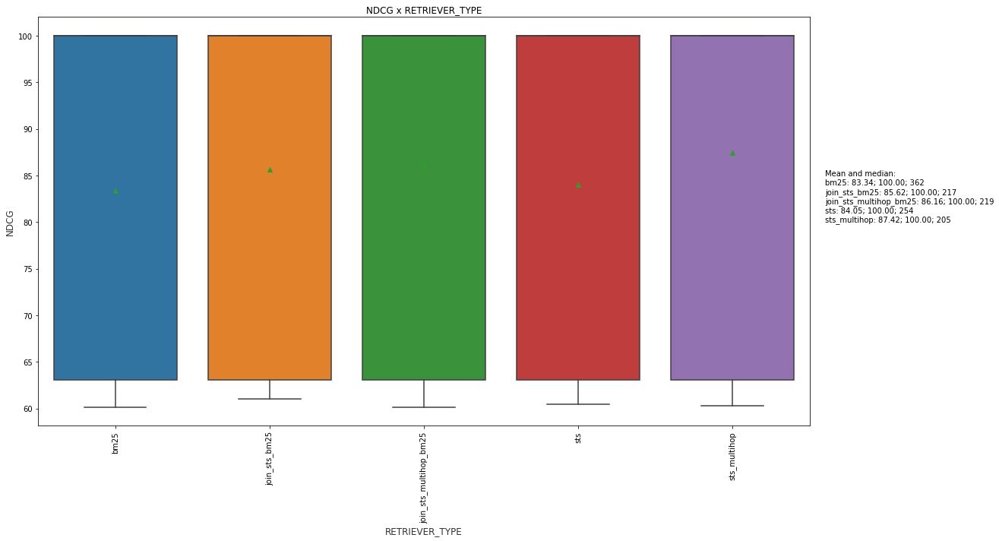

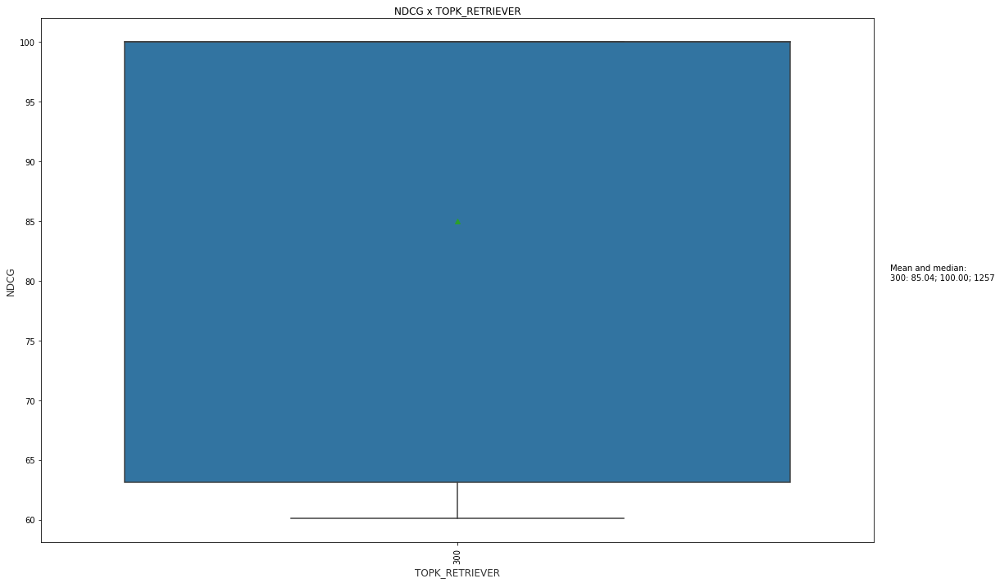

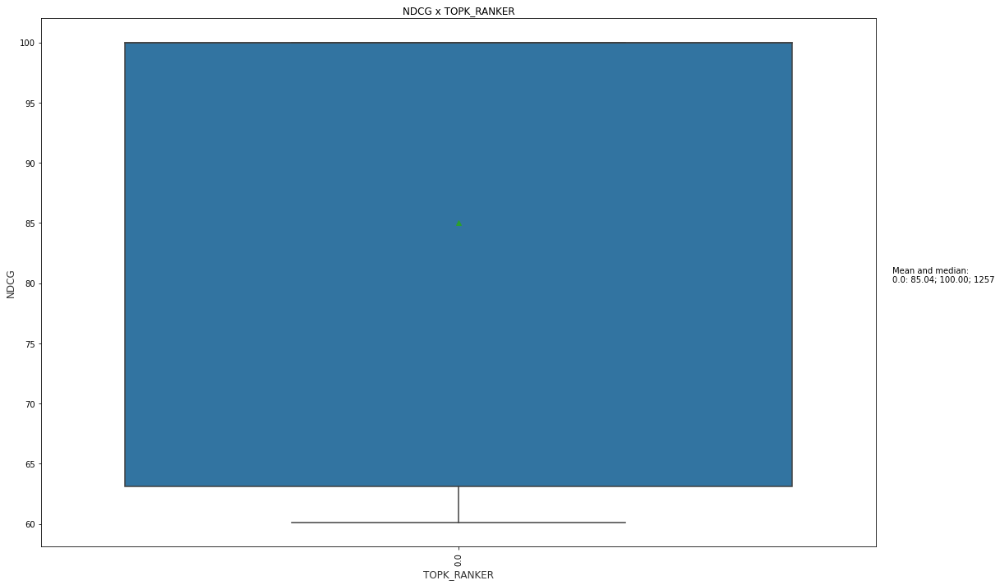

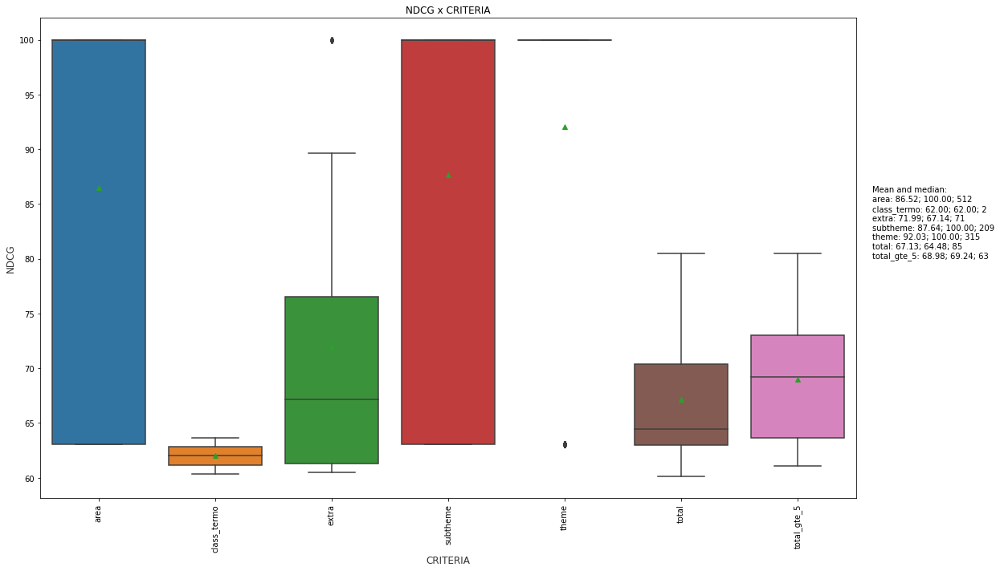

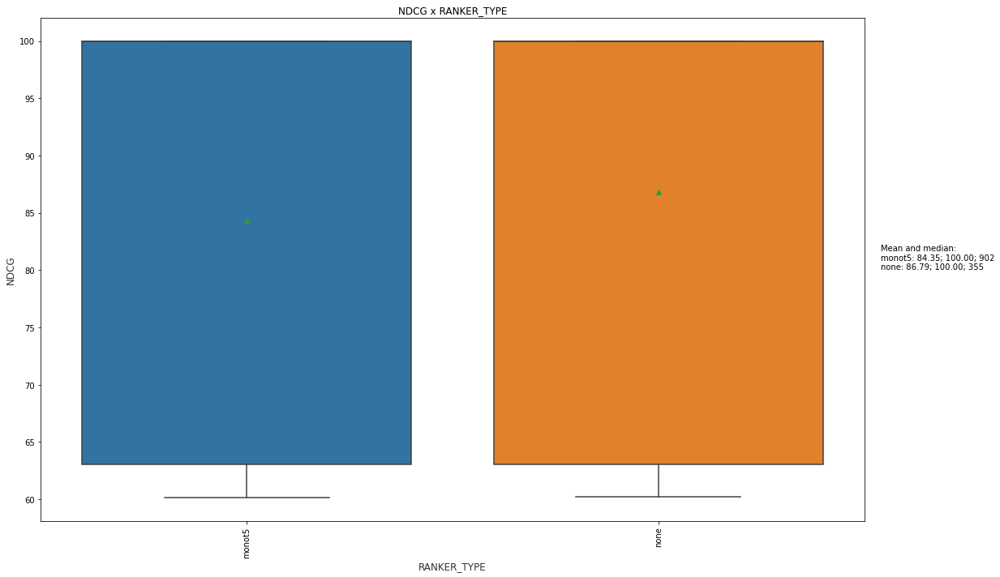

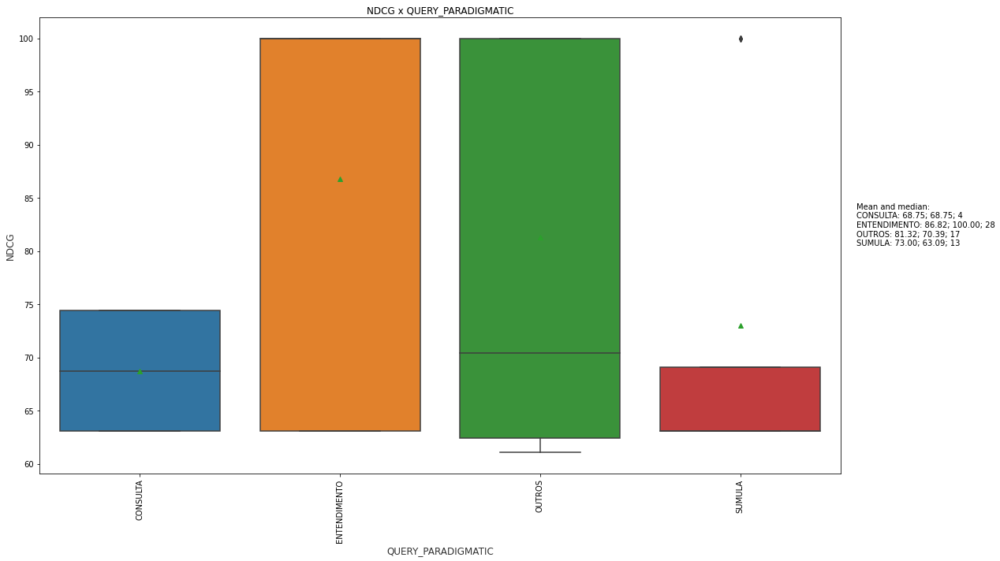

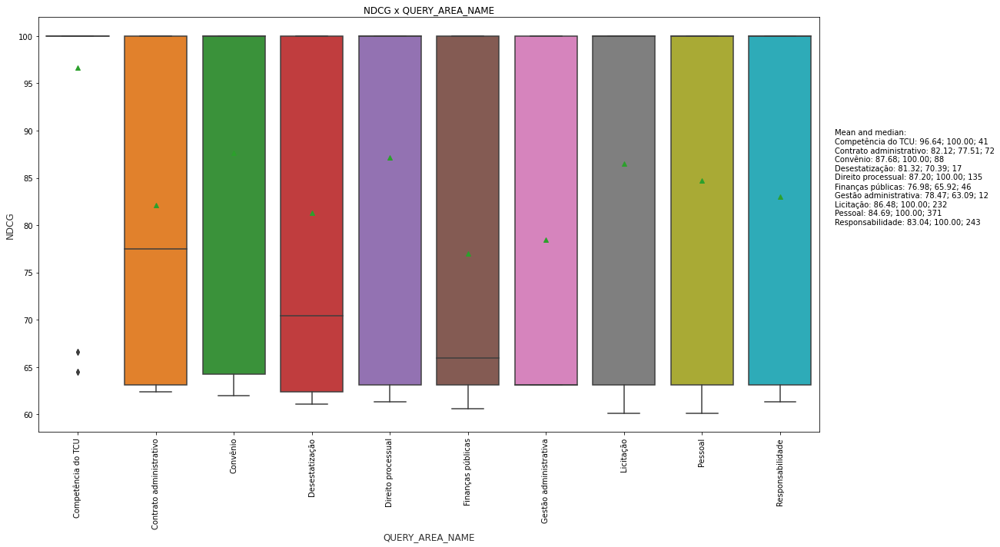

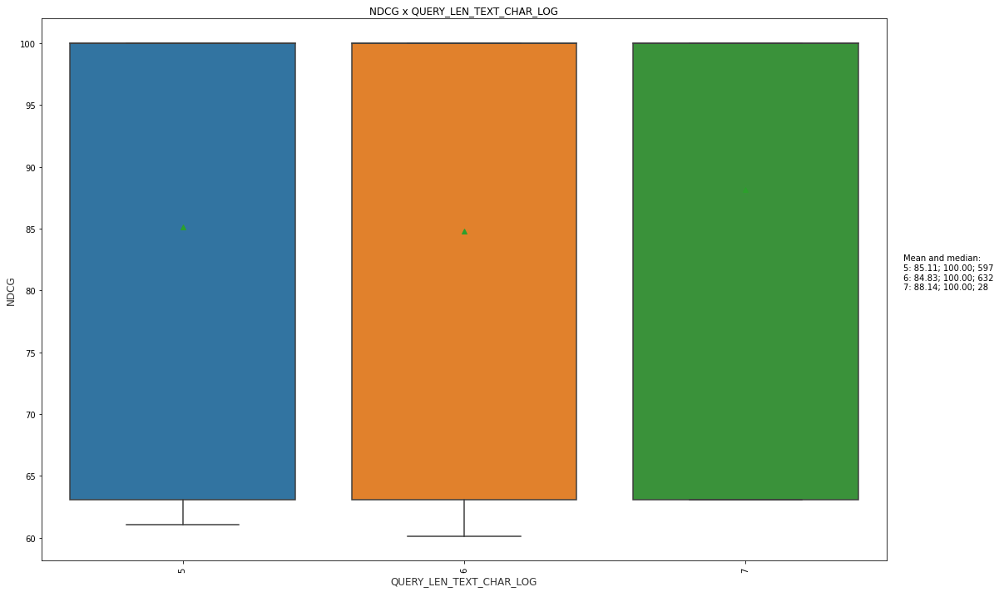

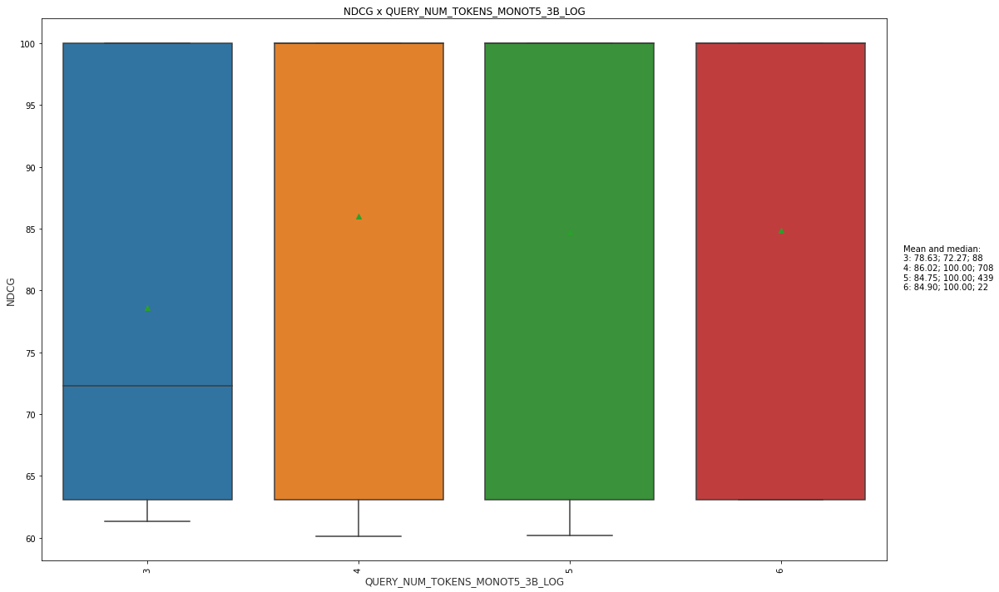

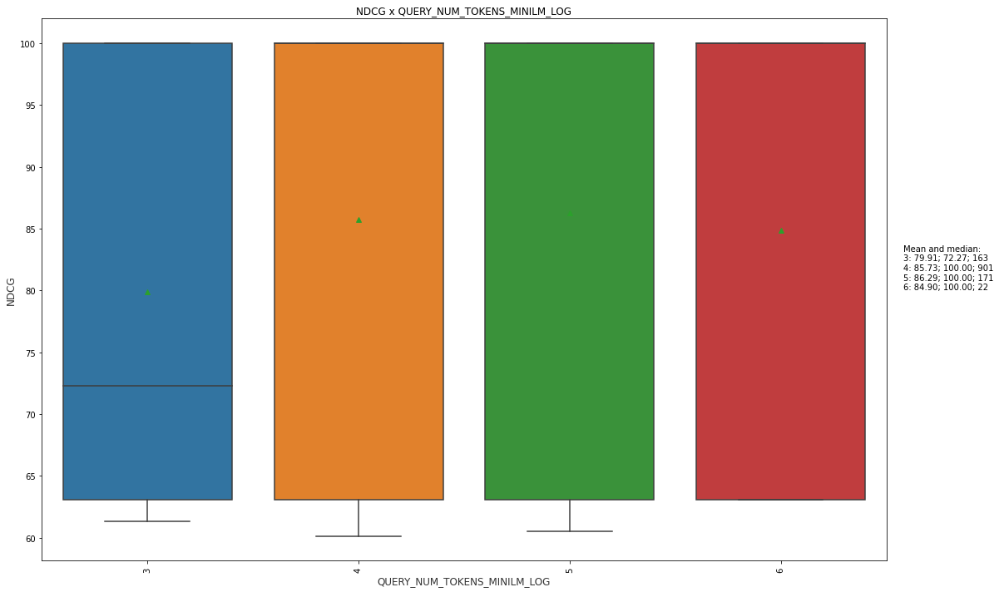

In [ ]:
for context in list_category: 
    for metric in ['NDCG']:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_top[context].unique())
        
        valores_unicos = sorted(df_top[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_top, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_top.groupby(context)[metric].mean()
        mediana = df_top.groupby(context)[metric].median()
        count = df_top.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)


# Doc - evaluation


In [ ]:
import importlib
importlib.reload(util_evaluation)

<module 'util.util_evaluation' from '/home/borela/fontes/ind-ir/code/util/util_evaluation.py'>

In [ ]:
%%time
df_result_doc = util_evaluation.return_result_per_doc(DATASET_NAME)

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/transformers/convert_slow_tokenizer.py:447: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  "The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option"


CPU times: user 1min, sys: 136 ms, total: 1min
Wall time: 1min


In [ ]:
df_result_doc.shape

(43560, 54)

In [ ]:
df_result_doc.columns

Index(['COUNT_DOCTO_RELEVANT', 'TIME_SPENT', 'NDCG', 'COUNT_DOCTO_FOUND',
       'RANK1', 'LIST_RANK', 'LIST_DOCTO_FOUND', 'RETRIEVER_TYPE',
       'TOPK_RETRIEVER', 'TOPK_RANKER', 'NDCG_LIMIT', 'CRITERIA',
       'RETRIEVER_MODEL_NAME', 'RANKER_MODEL_NAME', 'QUERY_ID',
       'QUERY_PARADIGMATIC', 'QUERY_AREA_NAME', 'QUERY_DOC_ID',
       'QUERY_LEN_TEXT_CHAR', 'QUERY_LEN_TEXT_CHAR_LOG', 'QUERY_NUM_WORD',
       'QUERY_NUM_TOKENS_MONOT5_3B', 'QUERY_NUM_TOKENS_MINILM',
       'QUERY_NUM_TOKENS_MONOT5_3B_LOG', 'QUERY_NUM_TOKENS_MINILM_LOG',
       'COUNT_DOCTO_RELEVANT_FOUND', 'PERCENT_DOCTO_RELEVANT_FOUND',
       'RANKER_TYPE', 'DOC_ID', 'TYPE_QREL', 'DOC_ID_FOUND', 'DOC_NAME',
       'DOC_CLASS', 'DOC_HAS_SCOPE_NOTE', 'DOC_HAS_DEFINITION',
       'DOC_HAS_SYNONYM', 'DOC_HAS_EXAMPLE', 'DOC_HAS_ENGLISH_TRANSLATION',
       'DOC_HAS_SPECIALIZATION', 'DOC_HAS_RELATED_TERM',
       'DOC_HAS_SPANISH_TRANSLATION', 'DOC_HAS_GENERALIZATION',
       'DOC_COUNT_INDEX_AREA', 'DOC_COUNT_INDEX_THE

In [ ]:
# list_metric = ['RANK1', 'NDCG', 'PERCENT_DOCTO_RELEVANT_FOUND']
list_category_doc = [
       # about doc
       'TYPE_QREL', 'DOC_CLASS', 'DOC_HAS_SCOPE_NOTE', 'DOC_HAS_DEFINITION',
       'DOC_HAS_SYNONYM', 'DOC_HAS_EXAMPLE', 'DOC_HAS_ENGLISH_TRANSLATION',
       'DOC_HAS_SPECIALIZATION', 'DOC_HAS_RELATED_TERM',
       'DOC_HAS_SPANISH_TRANSLATION', 'DOC_HAS_GENERALIZATION',
       'DOC_LEN_TEXT_CHAR_LOG',
       'DOC_NUM_TOKENS_MONOT5_3B_LOG', 'DOC_NUM_TOKENS_MINILM_LOG'
]



## Found x not found

In [ ]:
df_result_doc_found = df_result_doc[df_result_doc['DOC_ID_FOUND']]

In [ ]:
df_result_doc_not_found = df_result_doc[-df_result_doc['DOC_ID_FOUND']]

In [ ]:
df_result_doc_found.shape, df_result_doc_not_found.shape

((20645, 54), (22915, 54))

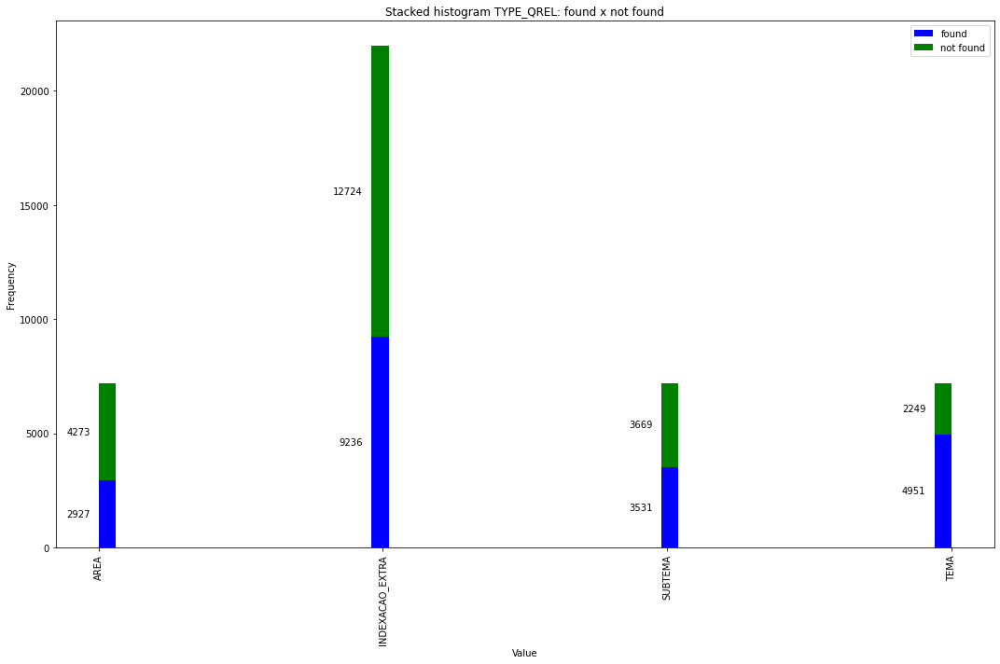

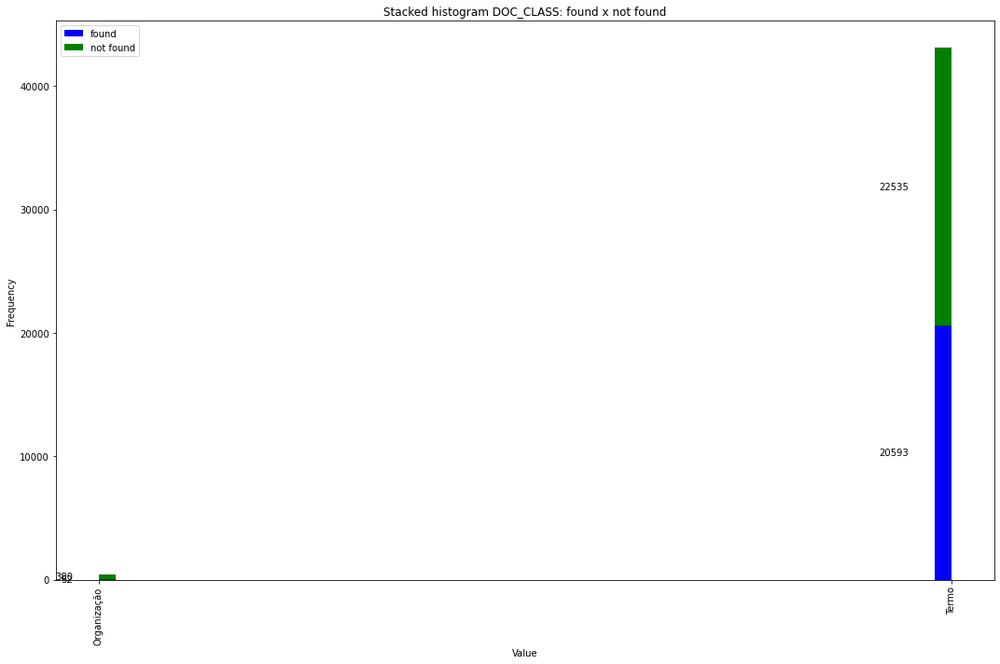

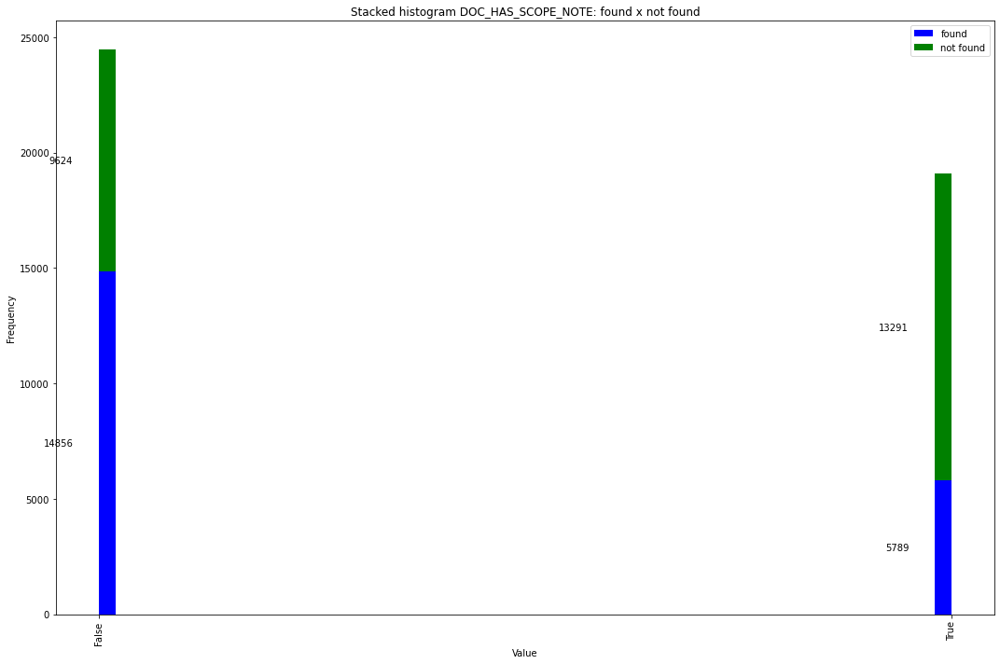

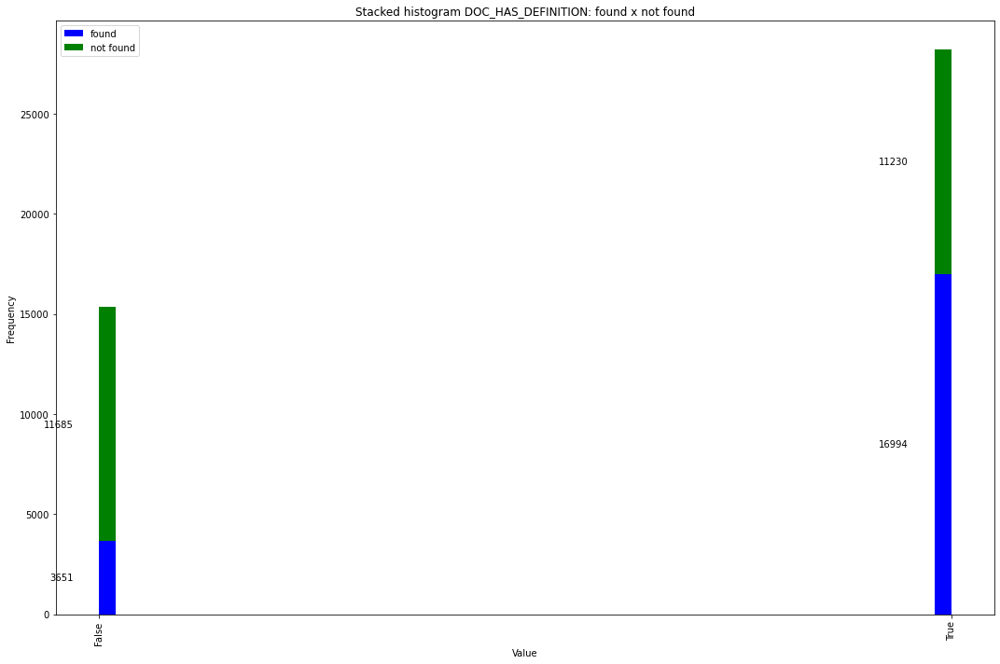

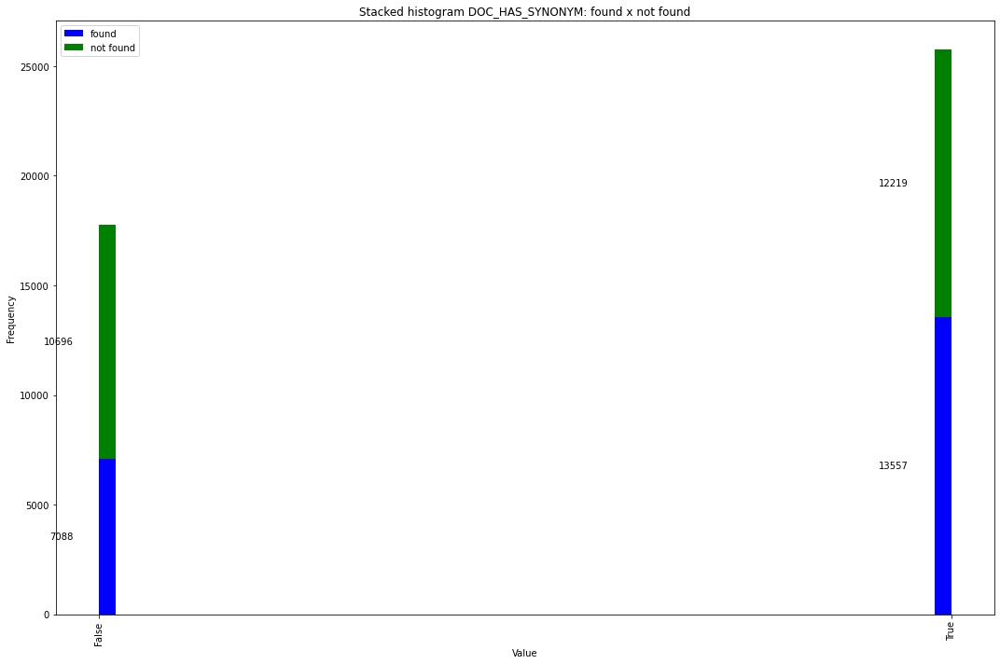

...

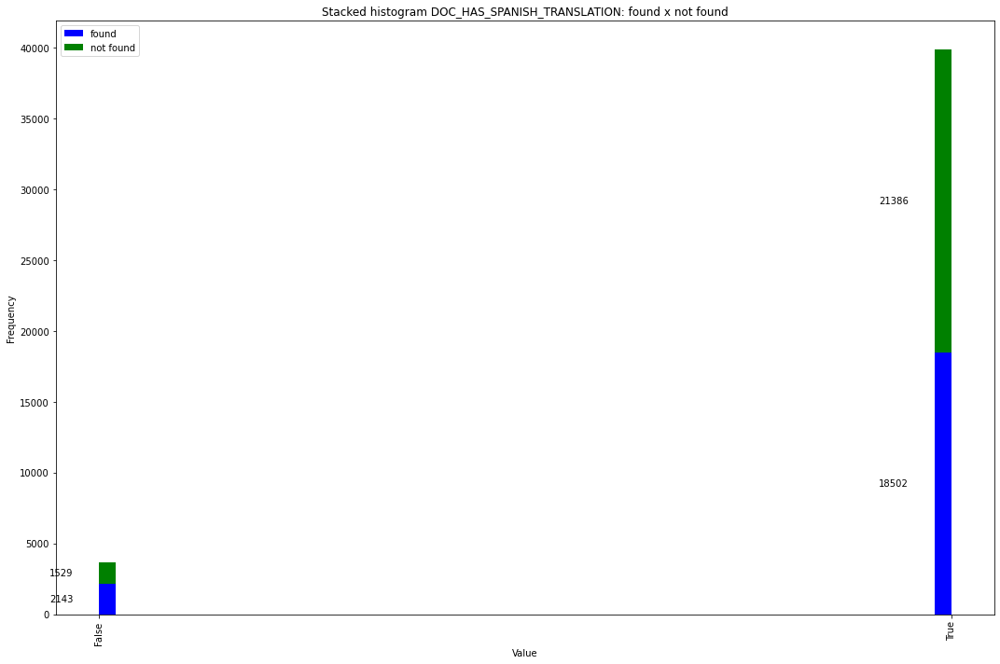

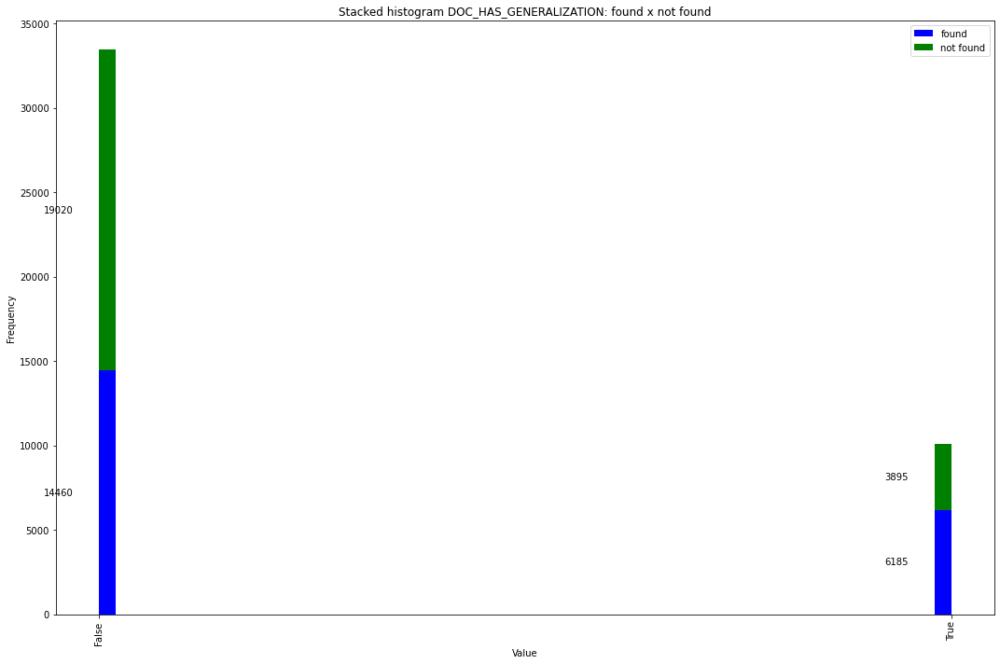

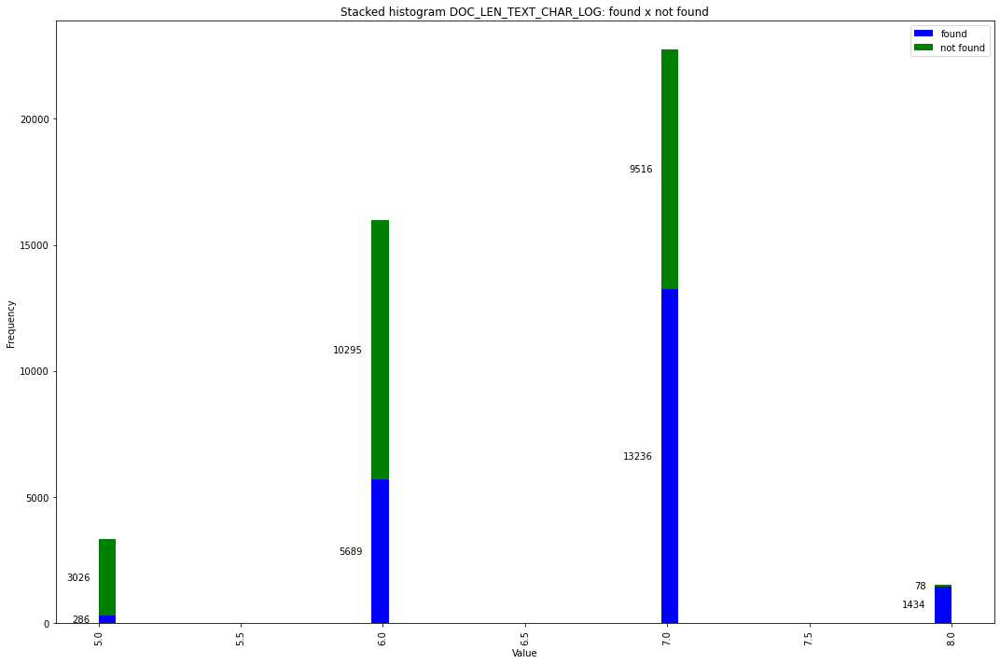

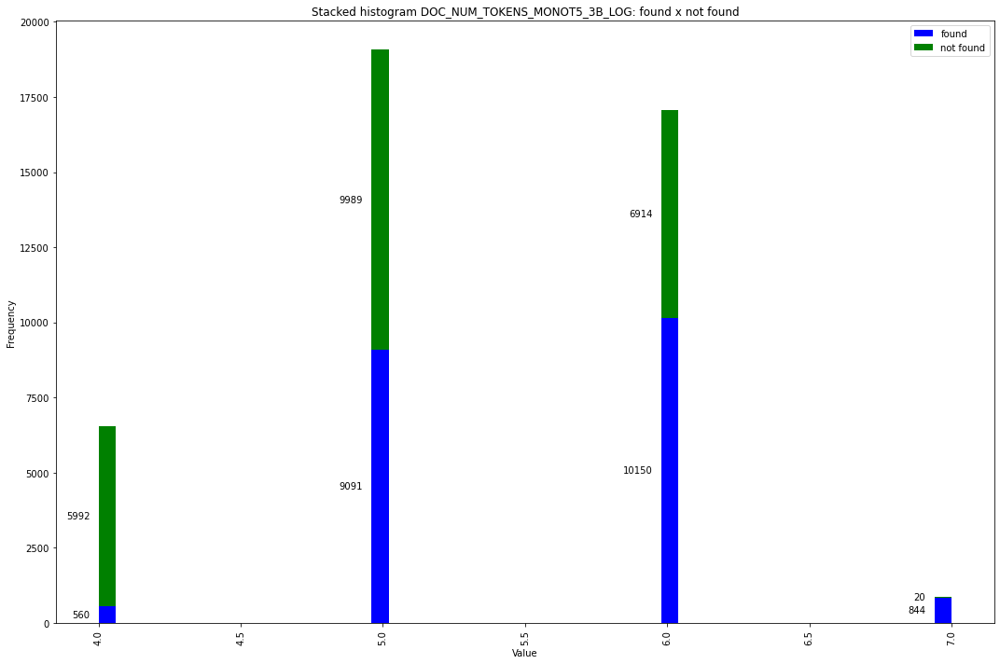

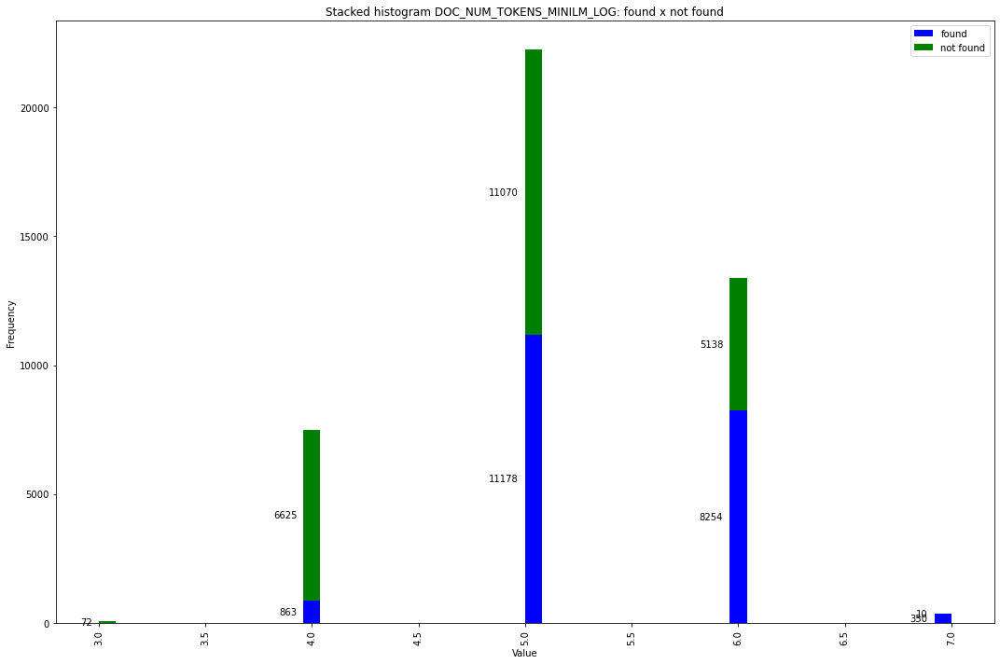

In [ ]:
for column in list_category_doc:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result_doc_found.sort_values(by=column)[column].dropna(), df_result_doc_not_found.sort_values(by=column)[column].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)

    # Definir os rótulos do eixo X para columns booleanas
    if '_HAS_' in column:
        plt.xticks([0, 1], ['False', 'True'])

    for rect in ax.patches:
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        if height > 0:
            # ax.text(x + width / 2, y + height + 0.01, int(height), ha='center', va='bottom')
            ax.text(x - 0.03, y + height / 2, int(height), ha='right', va='center')


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {column}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

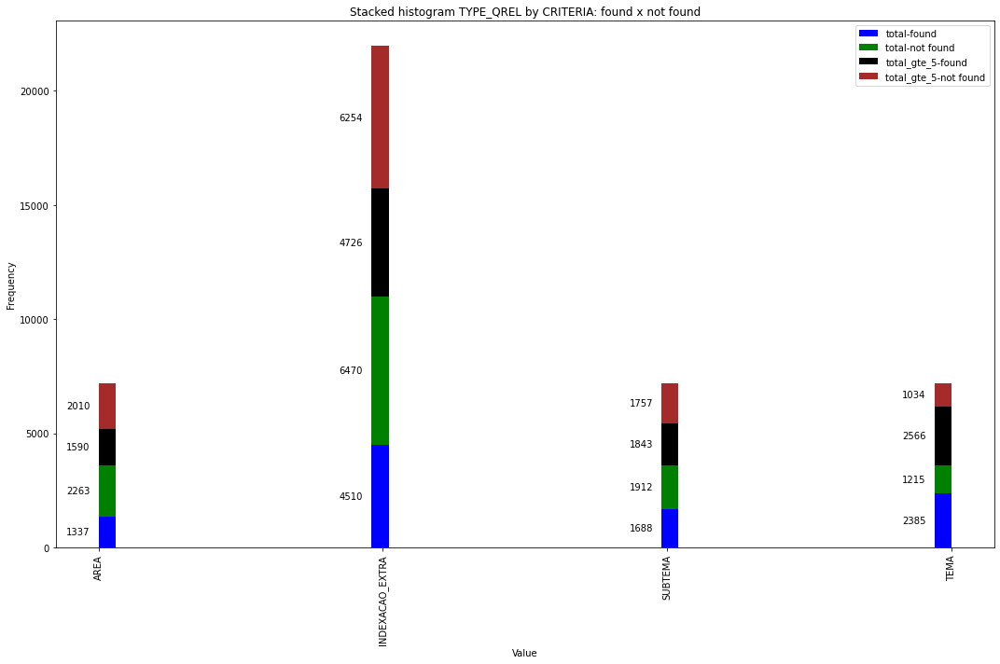

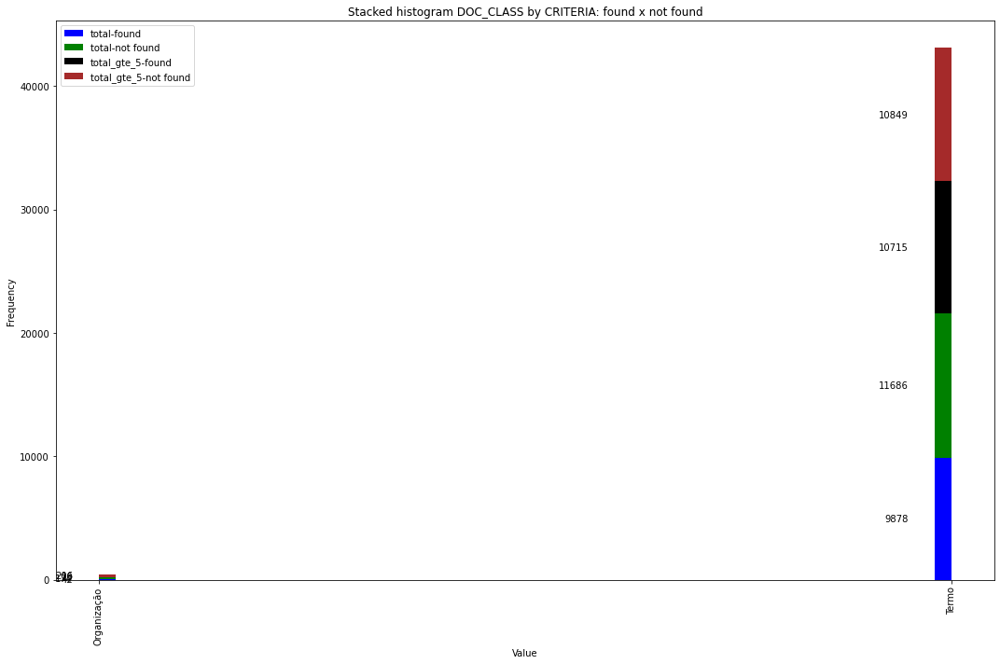

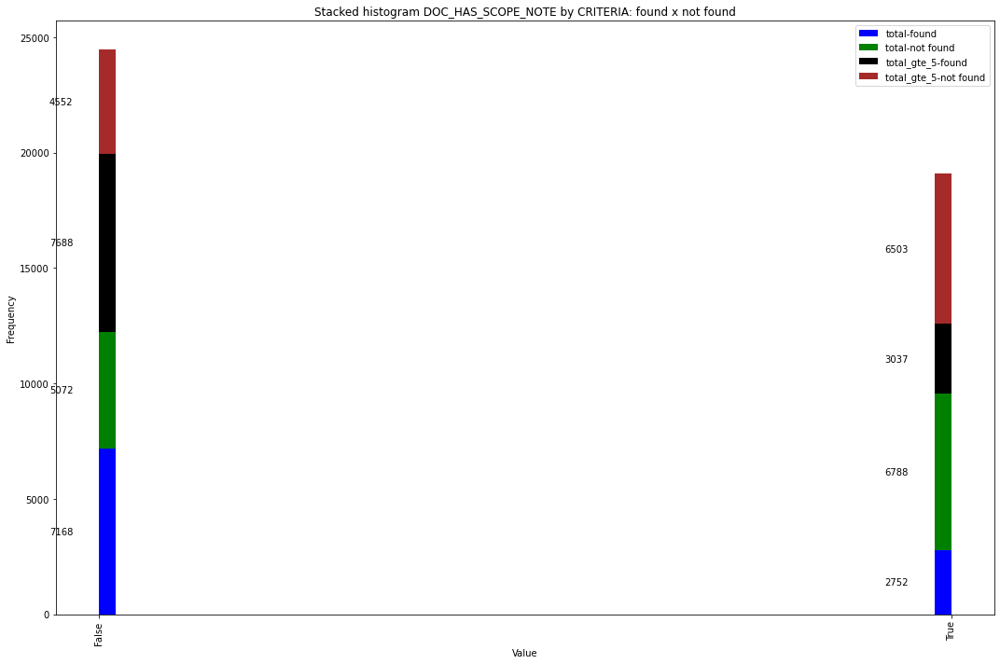

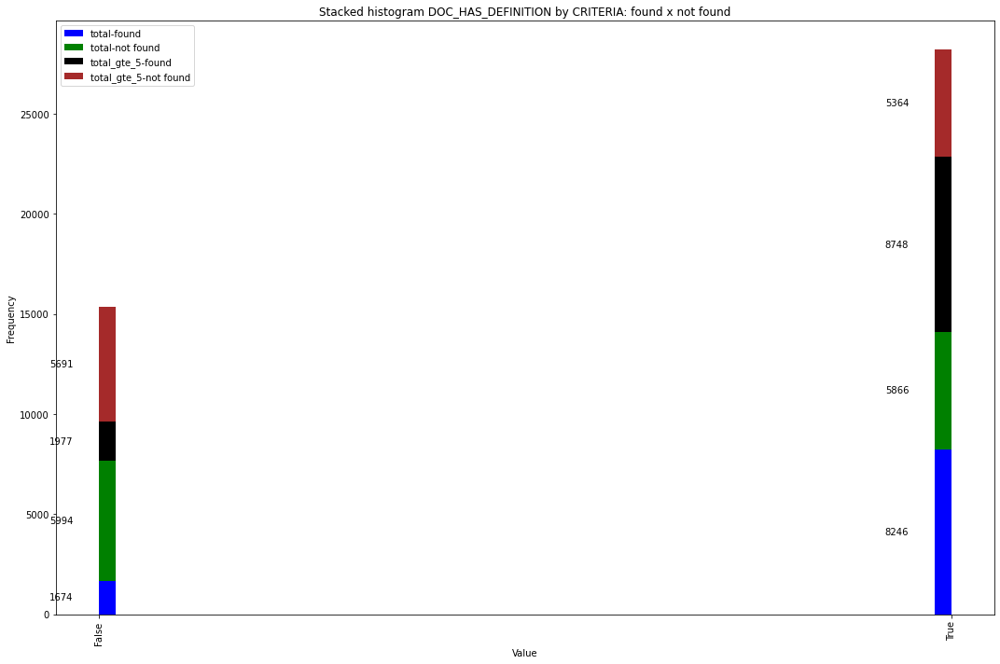

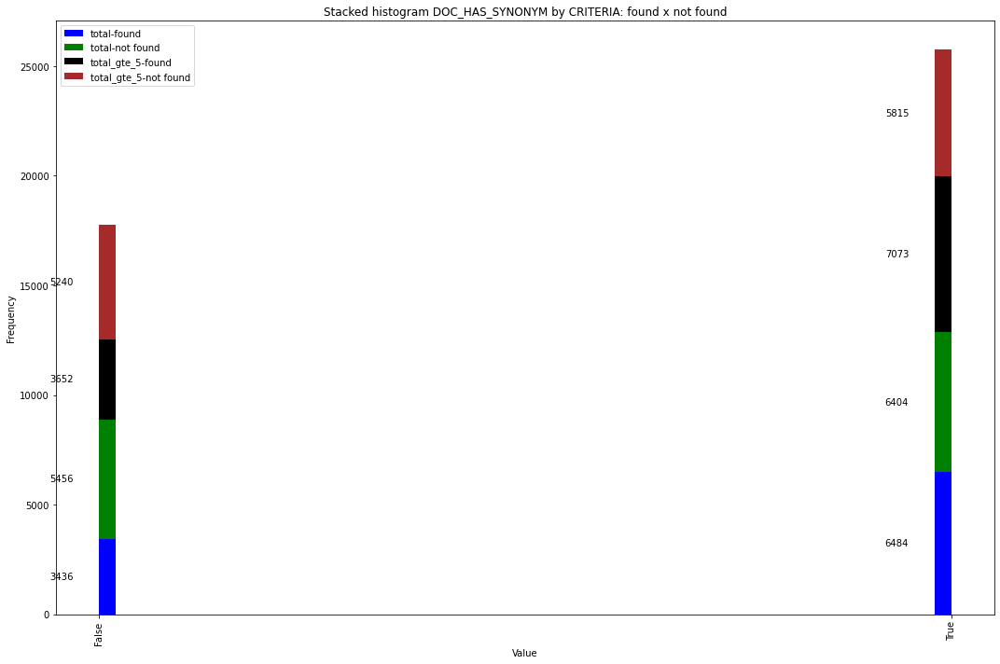

...

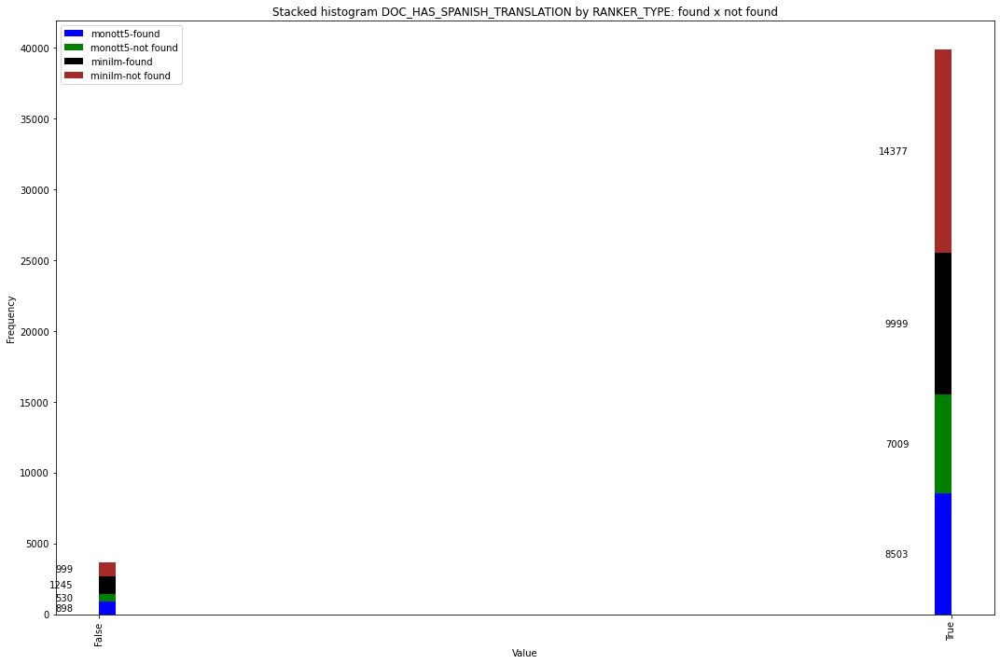

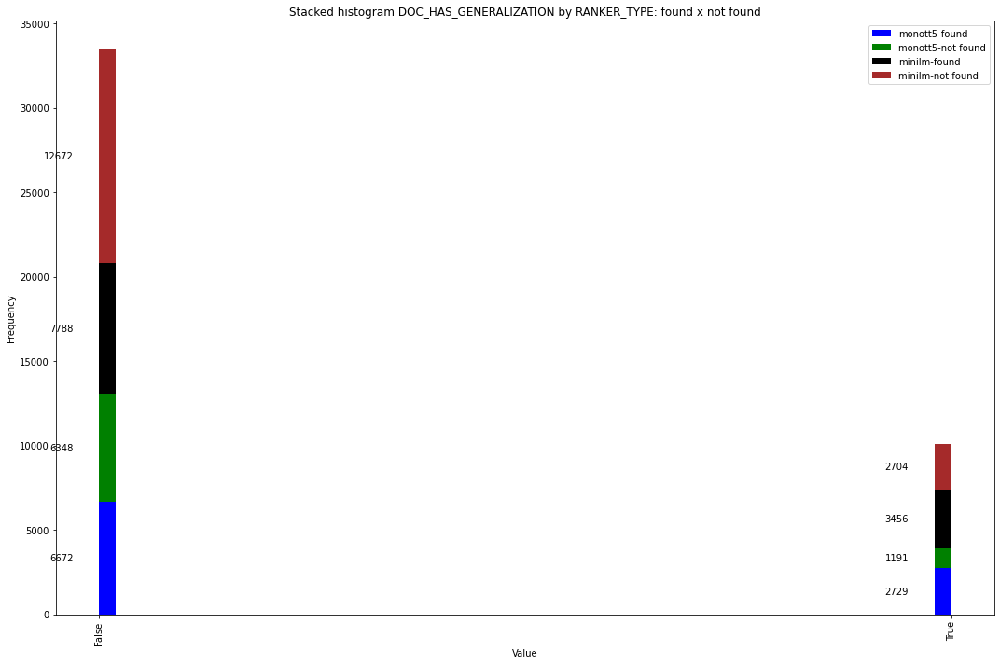

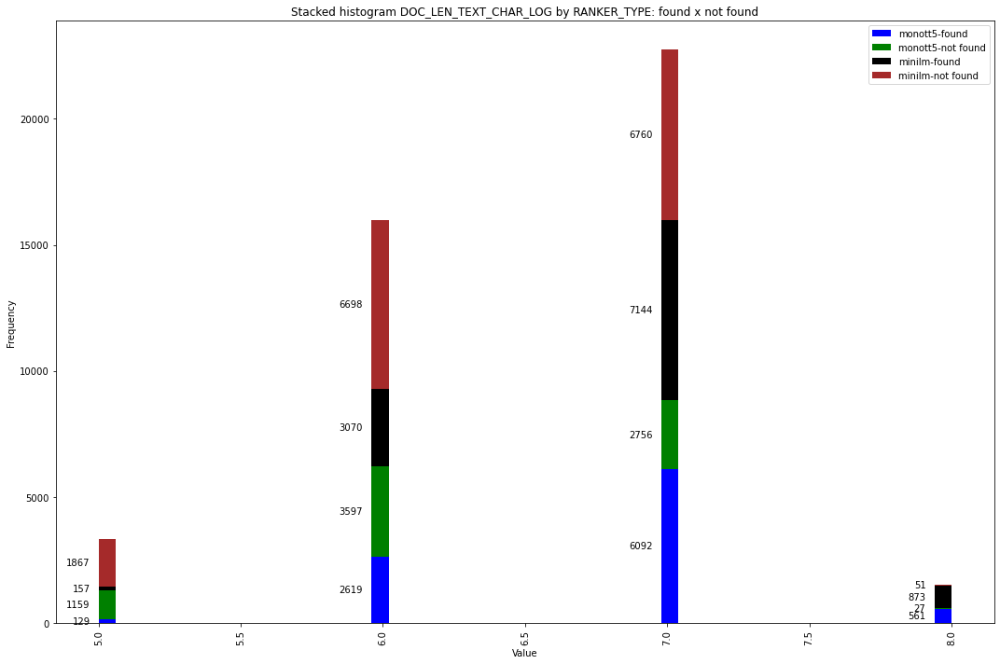

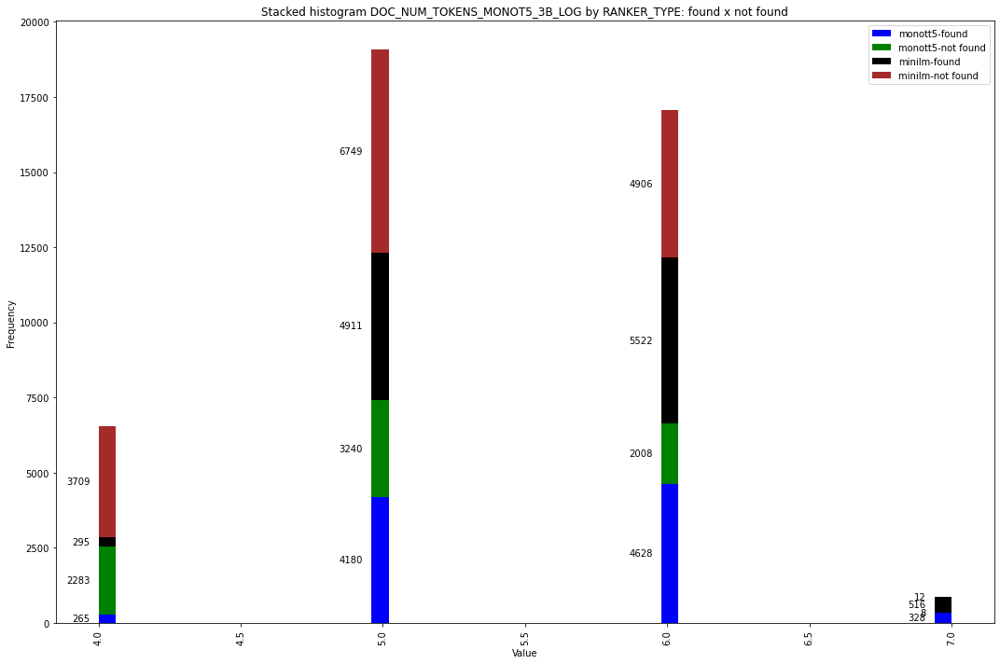

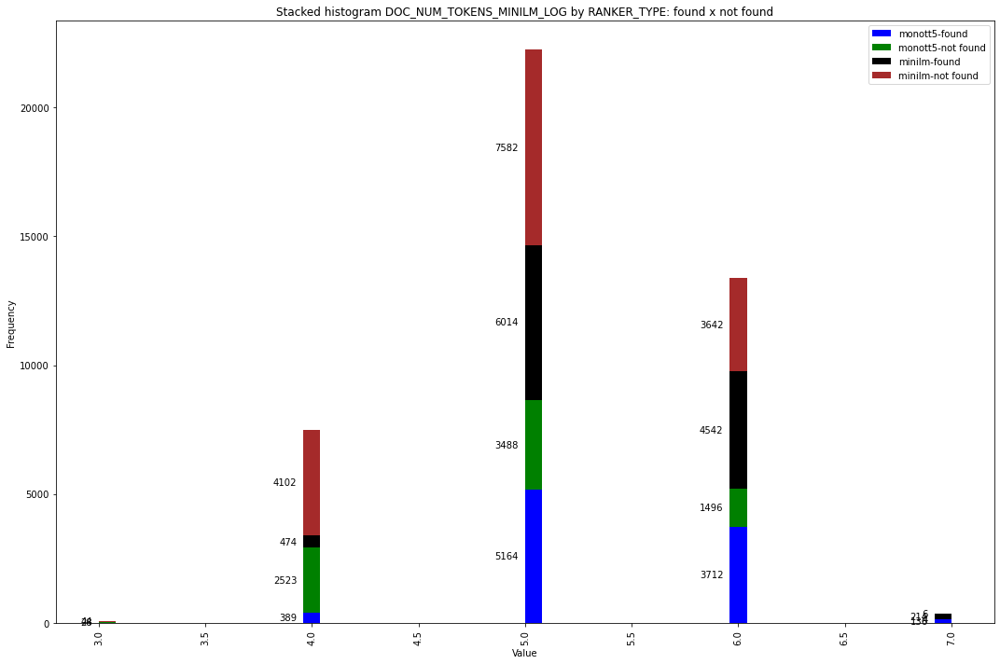

In [ ]:
for hue in ['CRITERIA', 'RETRIEVER','RANKER']:
    assert len(df_result_doc_found[hue].unique()) == 2, 'It only shows first 2 values'
    value1 = df_result_doc_found[hue].unique()[0]
    value2 = df_result_doc_found[hue].unique()[1]
    for column in list_category_doc:
        f, ax = plt.subplots(1, 1, figsize=(15, 10))
        plt.hist([
            df_result_doc_found[df_result_doc_found[hue] == value1].sort_values(by=column)[column].dropna(),
            df_result_doc_not_found[df_result_doc_not_found[hue] == value1].sort_values(by=column)[column].dropna(),
            df_result_doc_found[df_result_doc_found[hue] == value2].sort_values(by=column)[column].dropna(),
            df_result_doc_not_found[df_result_doc_not_found[hue] == value2].sort_values(by=column)[column].dropna(),
        ],
            color=['blue', 'green', 'black', 'brown'],
            label=[f'{value1}-found', f'{value1}-not found', f'{value2}-found', f'{value2}-not found'],
            stacked=True, bins=50)

        # Definir os rótulos do eixo X para colunas booleanas
        if '_HAS_' in column:
            plt.xticks([0, 1], ['False', 'True'])

        # Adicionar os valores das barras no topo e no lado esquerdo
        for rect in ax.patches:
            height = rect.get_height()
            width = rect.get_width()
            x = rect.get_x()
            y = rect.get_y()

            if height > 0:
                # ax.text(x + width / 2, y + height + 0.01, int(height), ha='center', va='bottom')
                ax.text(x - 0.03, y + height / 2, int(height), ha='right', va='center')

        plt.legend()
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.title(f'Stacked histogram {column} by {hue}: found x not found')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()


/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


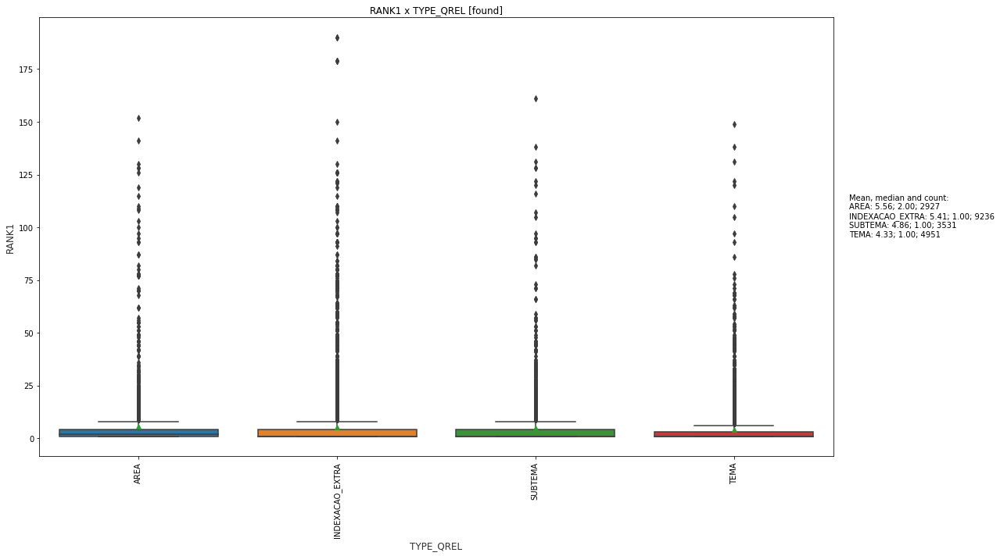

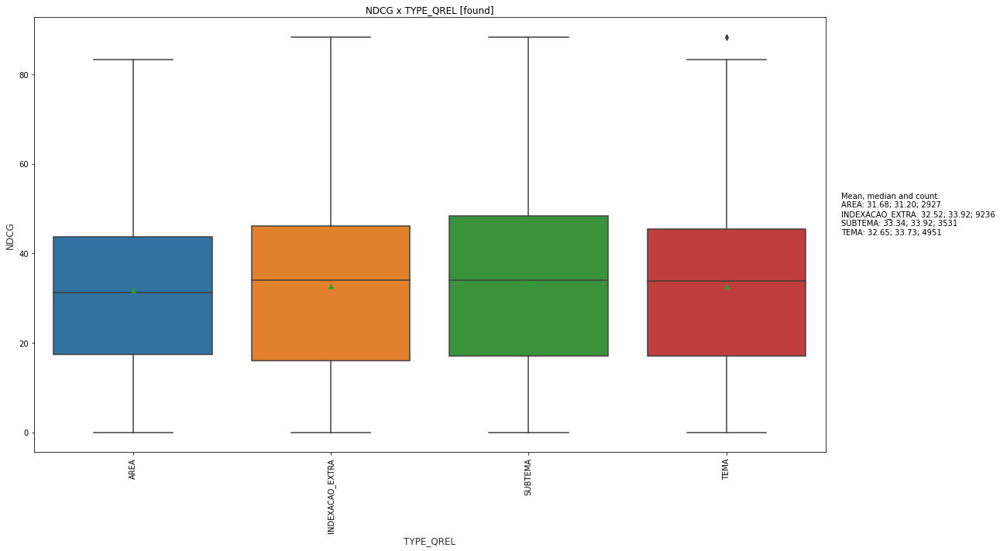

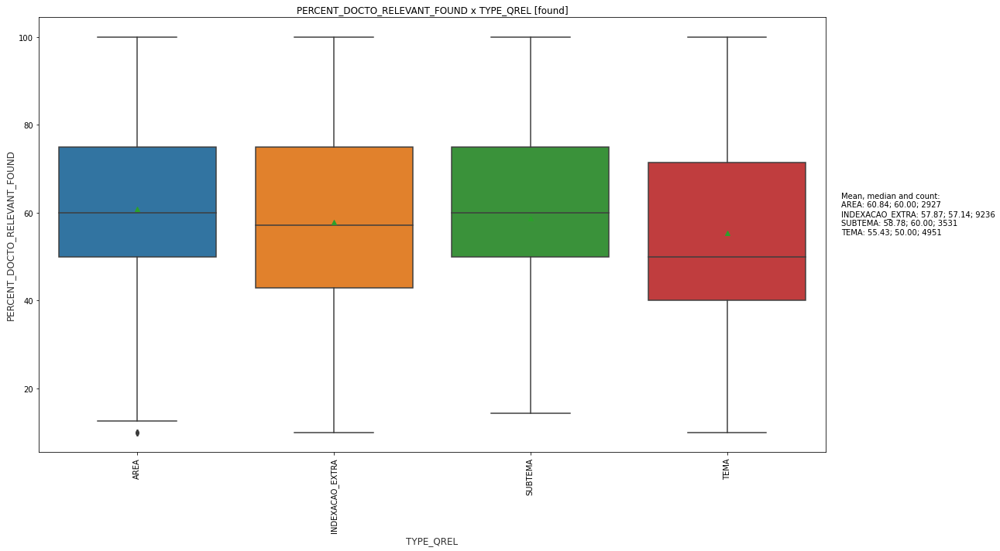

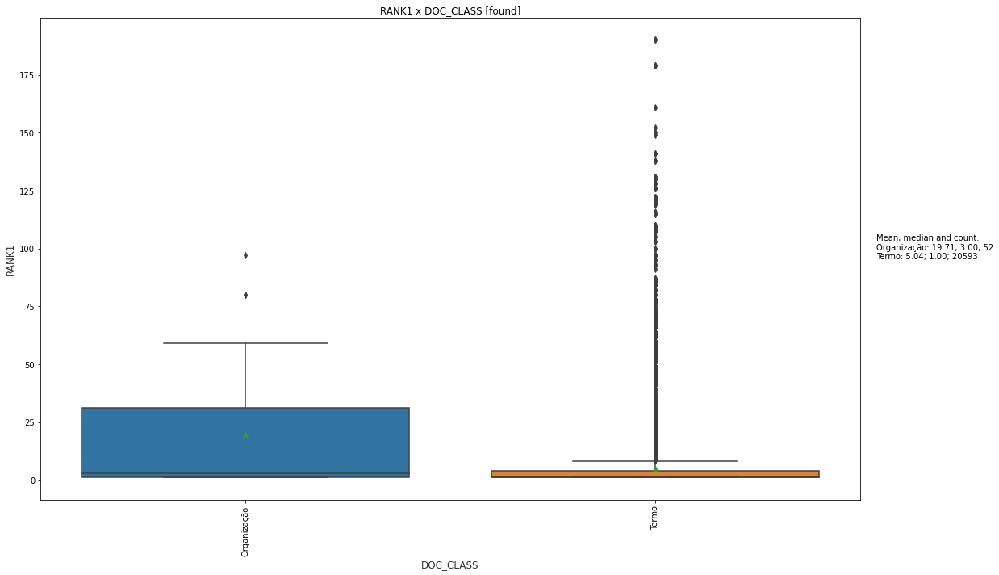

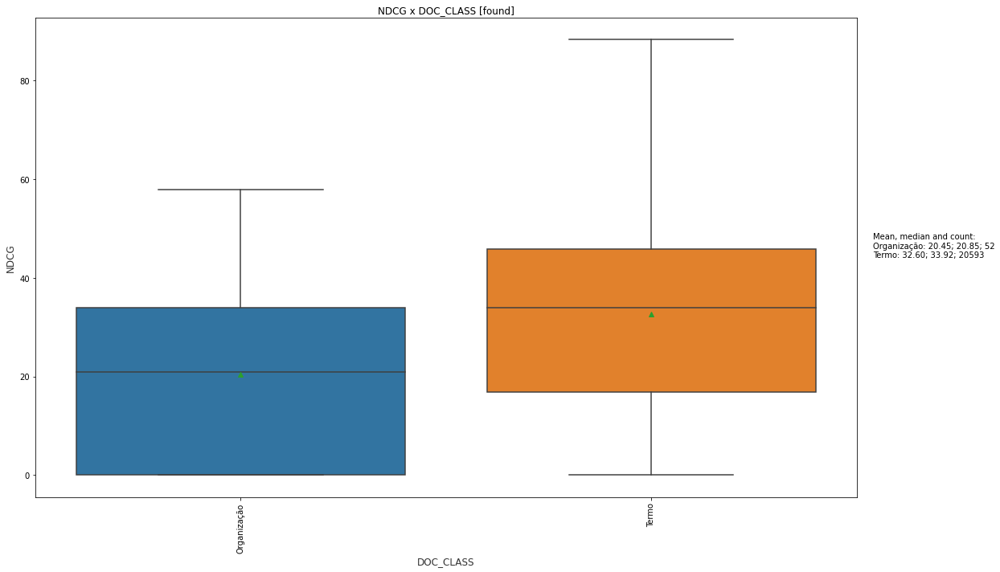

...

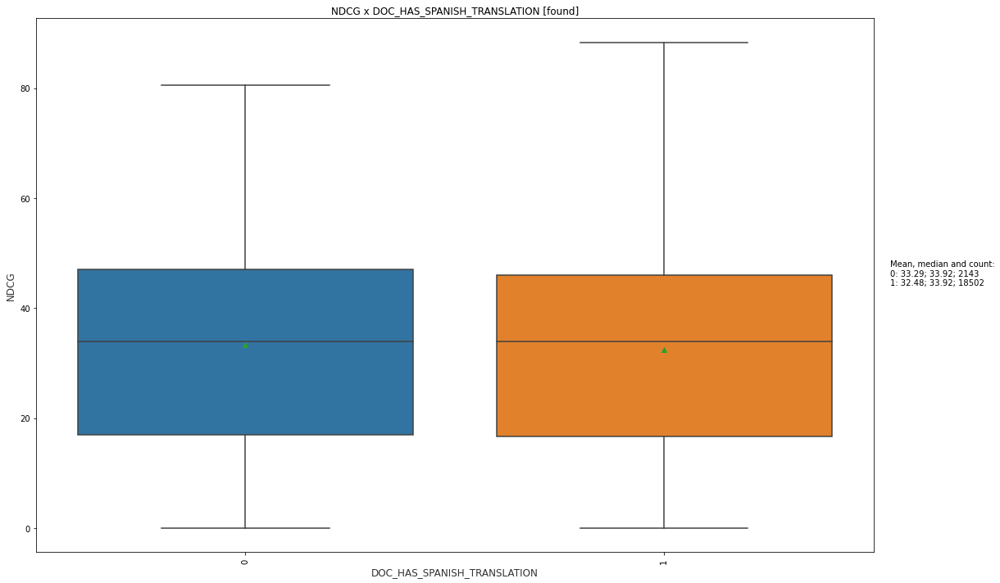

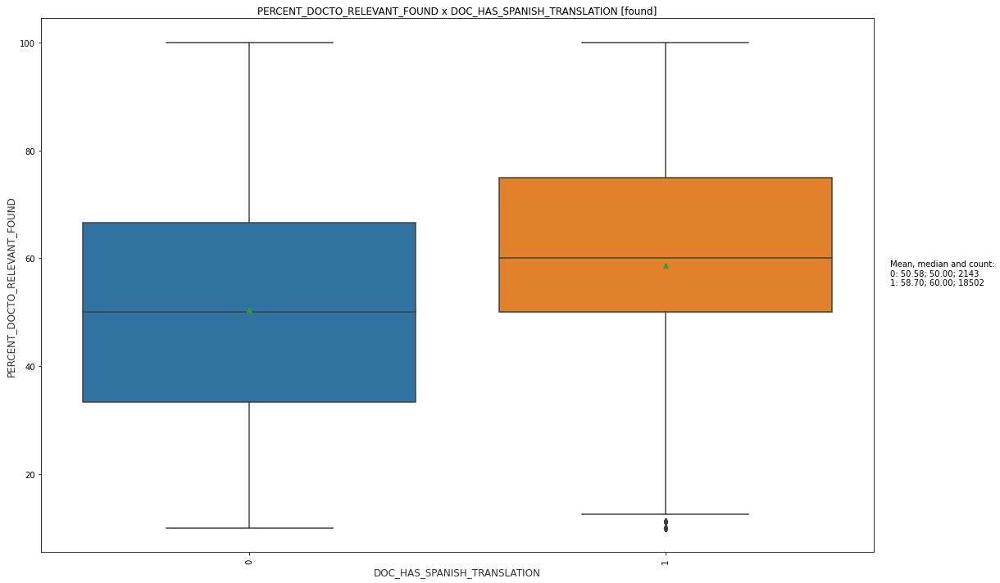

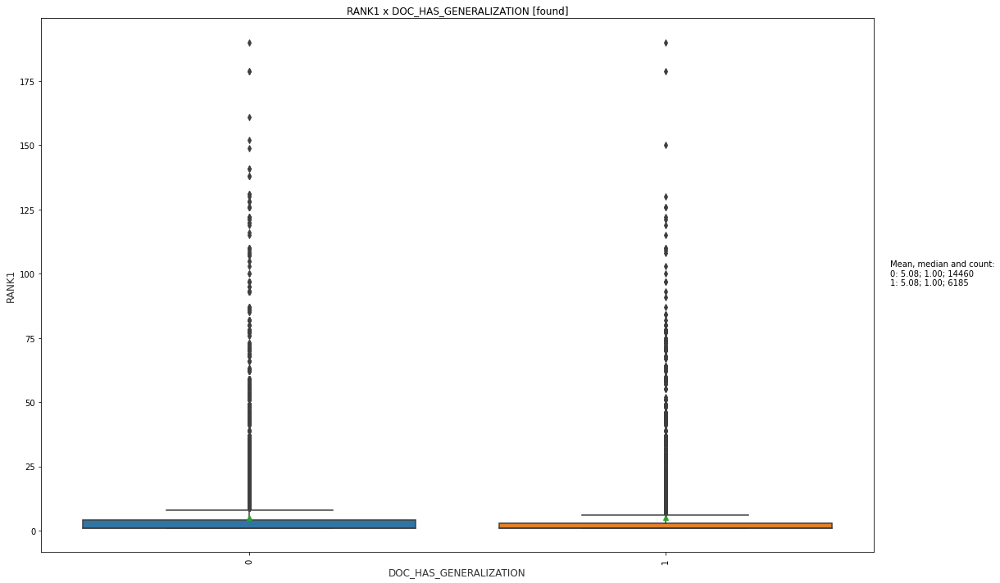

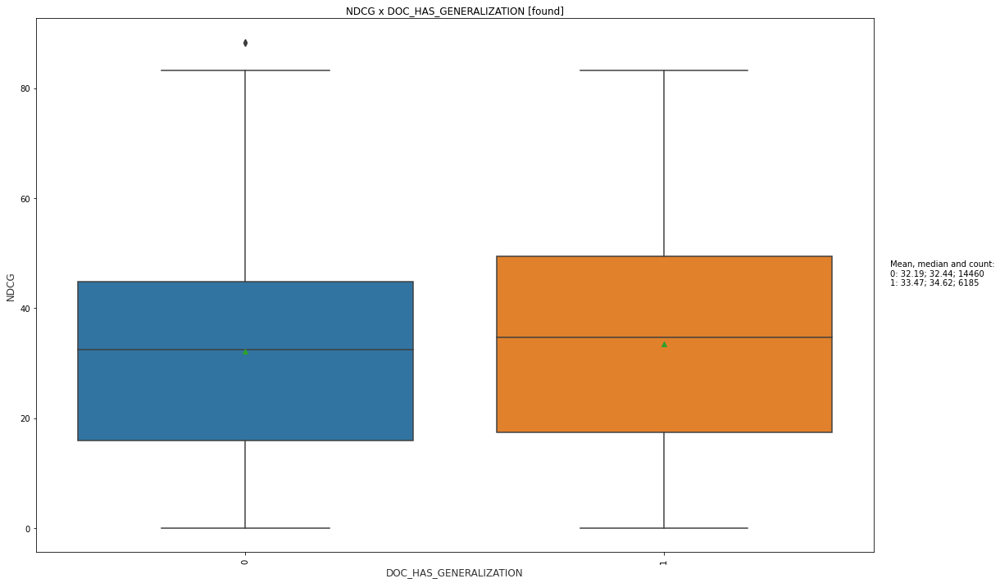

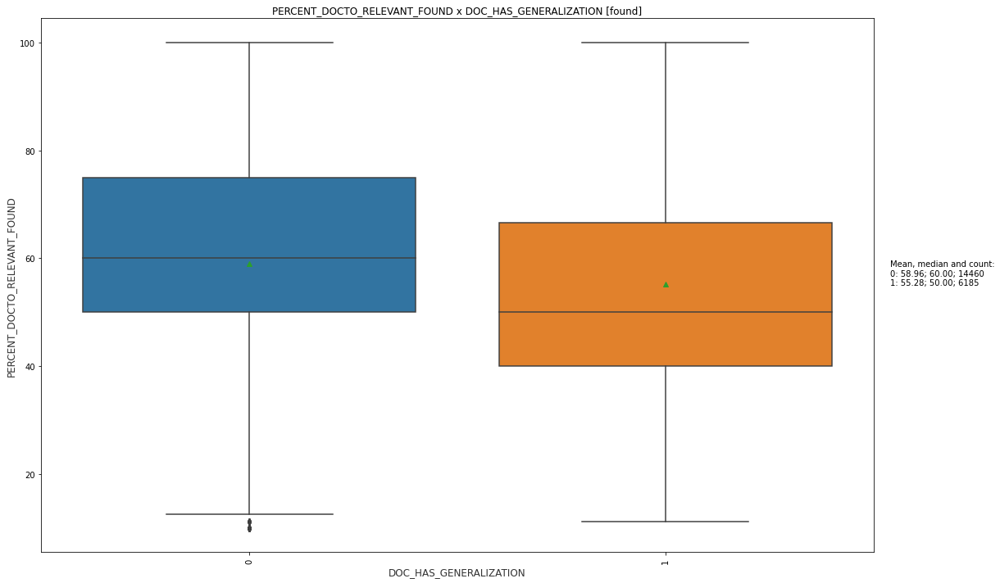

In [ ]:
for context in list_category_doc: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result_doc_found[context].unique())
        
        valores_unicos = sorted(df_result_doc_found[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context} [found]')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result_doc_found.groupby(context)[metric].mean()
        mediana = df_result_doc_found.groupby(context)[metric].median()
        count = df_result_doc_found.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean, median and count:\n{mm_str}", transform=ax.transAxes)

        """
        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()
        """

In [ ]:
len(df_result_doc_found['DOC_ID'].unique())

303

Creating validation data

In [ ]:
pd.DataFrame(df_result['QUERY_ID'].unique()).to_csv(f'../data/train_juris_tcu_index/validation_query_id.csv', index=False, header=['QUERY_ID'])

Definindo ordem para colunas

In [ ]:
list_expq_cnt_order = ['----', '1',  '2',  '3',  '4',  '5',  '6',  '7',  '8',  '9', '10']

In [ ]:
df_result['EXPQ_CNT'] = df_result['EXPQ_CNT'].astype(pd.CategoricalDtype(categories=list_expq_cnt_order, ordered=True))

In [ ]:
list_expq_type_order = ['----', 'base', 'indir', , 'indir_extra']

In [ ]:
df_result['EXPQ_TYPE'] = df_result['EXPQ_TYPE'].astype(pd.CategoricalDtype(categories=list_expq_type_order, ordered=True))

In [ ]:
list_expd_val_order = ['----', 'term', '+syn', '+rel', '+syn+rel']

In [ ]:
df_result['EXPD_VAL'] = df_result['EXPD_VAL'].astype(pd.CategoricalDtype(categories=list_expd_val_order, ordered=True))

In [ ]:
list_expd_type_order = ['----', 'user', 'indir-1', 'indir-3', 'indir-5' ]

In [ ]:
df_result['EXPD_TYPE'] = df_result['EXPD_TYPE'].astype(pd.CategoricalDtype(categories=list_expd_type_order, ordered=True))

In [ ]:
list_retriever_order = [ 'sts', 'bm25', 'join']

In [ ]:
df_result['RETRIEVER'] = df_result['RETRIEVER'].astype(pd.CategoricalDtype(categories=list_retriever_order, ordered=True))

In [ ]:
list_ranker_order = ['----', 'indir', 'indiri', 'base', 'basei']

In [ ]:
df_result['RANKER'] = df_result['RANKER'].astype(pd.CategoricalDtype(categories=list_ranker_order, ordered=True))